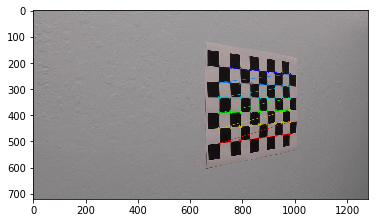

In [1]:
################################FROM lesson 15 "FINDING CORNERS"
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

%matplotlib inline
#%matplotlib qt

def find_corners(filename):
    #issue here is that some images have 9 and some 8 x direction points this may be causing probelms later on...
    # prepare object points
    nx = 9 #TODO: enter the number of inside corners in x
    ny = 6 #TODO: enter the number of inside corners in y

    # Make a list of calibration images
    fname = 'camera_cal/' + filename 
    img = cv2.imread(fname)

    # Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    #I think I will need a try stement becuase 9 5 works and 96 does not on image 1

    # If found, draw corners
    if ret == True:
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        plt.imshow(img)
    #plt.close()    
###########################################################
# test line of code to check functionality of abve function
find_corners('calibration8.jpg')


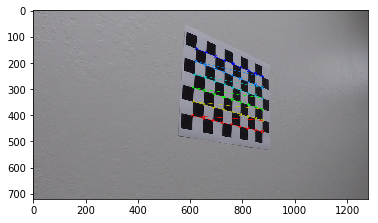

In [2]:
#############################################FROM LESSON 15 , 10 "Calibrating your camera"
import glob


def glob_find_corners( similar_filenames):
    
    #images = glob.glob('camera_cal/calibration*.jpg')

    images = glob.glob('camera_cal/' + similar_filenames)

    #fname = 'camera_cal/calibration6.jpg'
    #img = cv2.imread(fname)

    nx = 9#TODO: enter the number of inside corners in x
    ny = 6 # =6 for some images

    object_points = []
    image_points  = []

    objp = np.zeros((ny*nx,3),np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2) # x.y coorodinates

    for fname in images :

        img = mpimg.imread(fname)

        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

        ret ,corners =cv2.findChessboardCorners(gray,(nx,ny),None)

        if ret == True:
            image_points.append(corners)
            object_points.append(objp)

            cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
            plt.imshow(img)
            
    return object_points,image_points
        

        
###########################################################
# test line of code to check functionality of abve function        
object_points,image_points = glob_find_corners('calibration*.jpg')
    


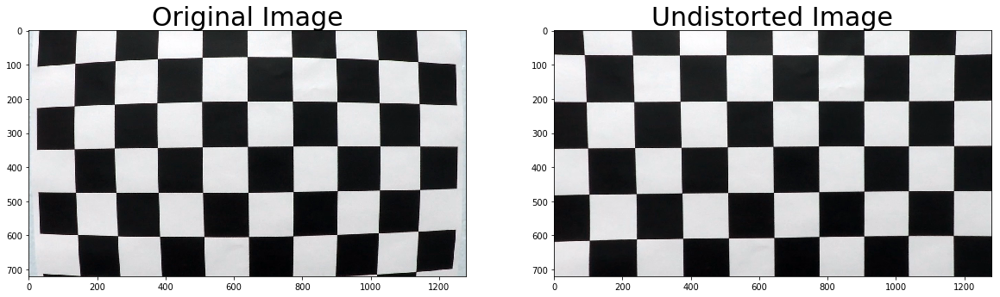

In [3]:
import pickle
%matplotlib inline

def undistort(object_points, image_points, filename):

    # Test undistortion on an image
    #img = cv2.imread('camera_cal/test_image.jpg') #this fish eye image was too much and was for a differnt set of images
    #img = cv2.imread('camera_cal/temp_calibration1.jpg')
   # img = cv2.imread('camera_cal/'+filename)
    #img = cv2.imread('test_images/'+filename)
    img = cv2.imread(filename)
    img_size = (img.shape[1], img.shape[0])

    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(object_points, image_points, img_size,None,None)


    dst = cv2.undistort(img, mtx, dist, None, mtx)
    cv2.imwrite('calibration_wide/test_undist.jpg',dst)

    # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
    dist_pickle = {}
    dist_pickle["mtx"] = mtx
    dist_pickle["dist"] = dist
    pickle.dump( dist_pickle, open( "camera_cal/wide_dist_pickle.p", "wb" ) )
    #dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=30)
    
###########################################################
# test line of code to check functionality of abve function  

undistort(object_points, image_points , 'camera_cal/temp_calibration1.jpg')

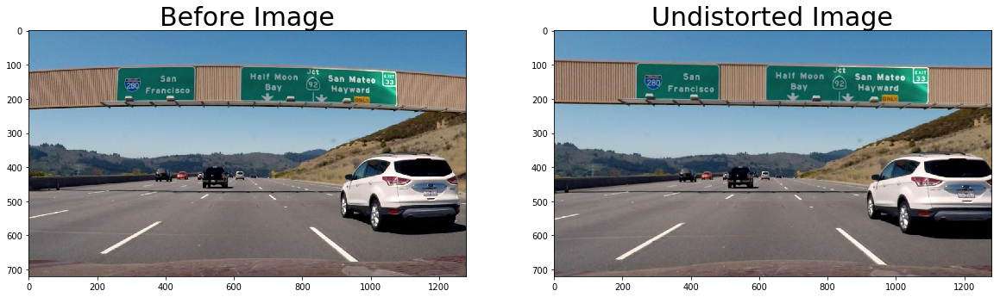

In [4]:
############################################################
# 23 june
# this is anonter unsidtort to return an undistorted image for video pipelne without saving or diplaying outputs
# nice result on test image of wide road sign
import pickle
%matplotlib inline

#def create_undistorted(object_points, image_points, filename):
def create_undistorted(object_points, image_points, img): #video will feed in one image at a time

    # Test undistortion on an image
   
   # img = cv2.imread('camera_cal/'+filename)
    #img = cv2.imread(filename) #video will feed in one image at a time
    #img = cv2.imread('test_images/'+filename)
   

    
    img_size = (img.shape[1], img.shape[0])

    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(object_points, image_points, img_size,None,None)


    dst = cv2.undistort(img, mtx, dist, None, mtx)
  
    
    return dst
    
###########################################################
# test line of code to check functionality of abve function       
#undistored_image = create_undistorted(object_points, image_points , 'temp_calibration1.jpg')

before_image = cv2.imread('test_images/signs_vehicles_xygrad.png')
#note the function loads and image and above before image is just to display below
#undistored_image = create_undistorted(object_points, image_points , 'test_images/signs_vehicles_xygrad.png')
undistored_image = create_undistorted(object_points, image_points , before_image)


# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow( cv2.cvtColor(before_image, cv2.COLOR_BGR2RGB))
ax1.set_title('Before Image', fontsize=30)
ax2.imshow( cv2.cvtColor(undistored_image, cv2.COLOR_BGR2RGB))
ax2.set_title('Undistorted Image', fontsize=30)



In [5]:
######################From Lesson 15, 2 Applying Sobel
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    #gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

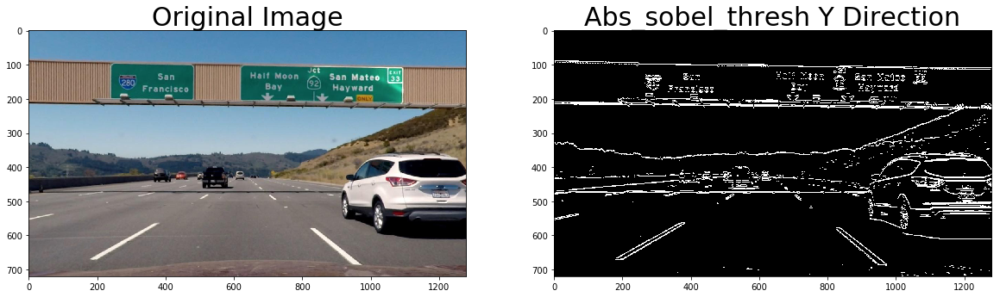

In [6]:
################################ Using above Function
#dst = abs_sobel_thresh(img, orient='y', thresh_min=5, thresh_max=100)

distorted_image = cv2.imread('test_images/signs_vehicles_xygrad.png')
undistored_image = create_undistorted(object_points, image_points , distorted_image)


singleUndistorted= undistored_image

#dst = abs_sobel_thresh(singleUndistorted, orient='y', thresh_min=10, thresh_max=255)
#dst = abs_sobel_thresh(singleUndistorted, orient='y', thresh_min=20, thresh_max=255)
dst = abs_sobel_thresh(singleUndistorted, orient='y', thresh_min=30, thresh_max=255)
#dst = abs_sobel_thresh(singleUndistorted, orient='y', thresh_min=40, thresh_max=255)





f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
#ax1.imshow( cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.imshow( cv2.cvtColor(singleUndistorted, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=30)
#ax2.imshow( cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
ax2.imshow( dst,cmap='gray')
ax2.set_title('Abs_sobel_thresh Y Direction', fontsize=30)


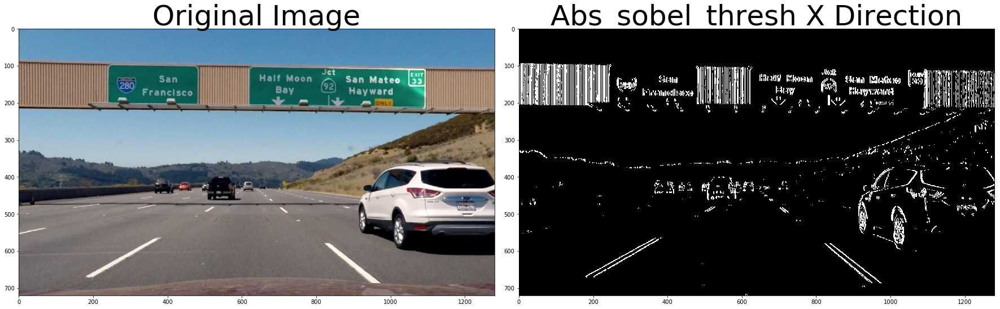

In [7]:

# Run the function
#grad_binary = abs_sobel_thresh(dst, orient='x', thresh_min=20, thresh_max=100) 
#grad_binary = abs_sobel_thresh(singleUndistorted, orient='x', thresh_min=10, thresh_max=100)
#grad_binary = abs_sobel_thresh(singleUndistorted, orient='x', thresh_min=20, thresh_max=100)
grad_binary = abs_sobel_thresh(singleUndistorted, orient='x', thresh_min=30, thresh_max=255)
#grad_binary = abs_sobel_thresh(singleUndistorted, orient='x', thresh_min=40, thresh_max=255)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(singleUndistorted, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Abs_sobel_thresh X Direction', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


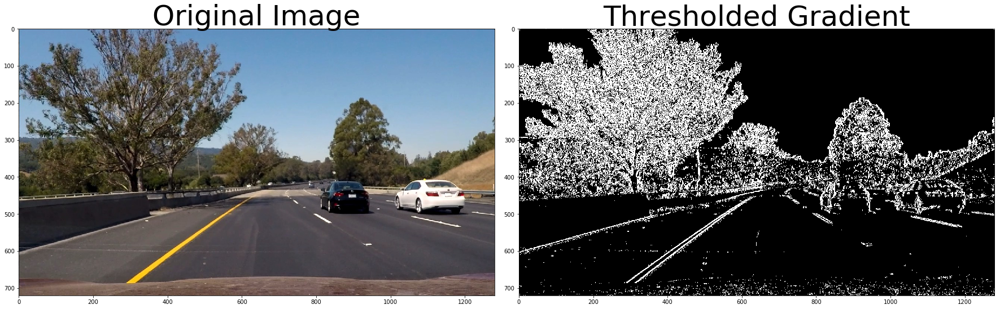

In [8]:

#note the teacher in the video chose the best test image to get results
#as above and below results are very differnet with same settings on Sobel x
image6 = mpimg.imread('test_images/test6.jpg')

grad_binary = abs_sobel_thresh(image6, orient='x', thresh_min=10, thresh_max=100)
#grad_binary = abs_sobel_thresh(image6, orient='y', thresh_min=10, thresh_max=100)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image6)#cv2.cvtColor(image6, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


In [9]:
#DO some variations of x and y gradients and different thresholds to show work maybe 10 Pics etc#
#could do one side x one side y variations of same threlhold each row

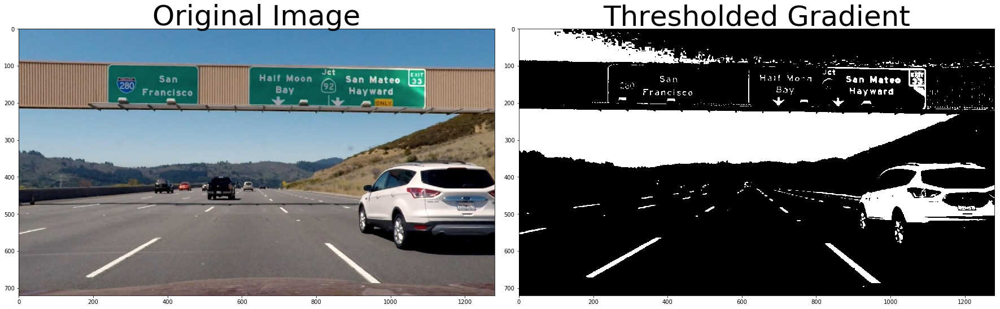

In [10]:
#21 June
#From lesson 15 video 31



image = singleUndistorted
#thresh = (200, 255)
#thresh = (180, 255)
#thresh = (170, 255)
thresh = (150, 255)
#thresh = (100, 255)

gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
binary = np.zeros_like(gray)
binary[(gray > thresh[0]) & (gray <= thresh[1])] = 1

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(singleUndistorted, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(binary, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


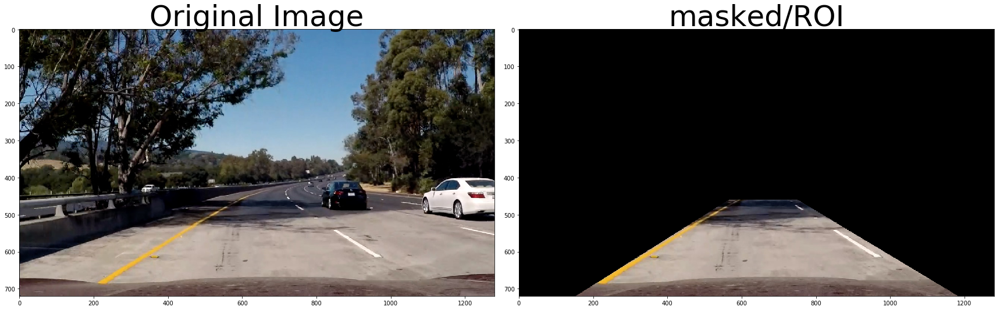

In [11]:
# aaded 25th June a separate ROI function
# I am putting htis here becuase in the piplein I will use it after undistort
def make_ROI_version2(undistorted, roi_corners):
    
    #ROI
    ####use this now!https://stackoverflow.com/questions/15341538/numpy-opencv-2-how-do-i-crop-non-rectangular-region
    #### nearly the same https://github.com/liferlisiqi/Advanced-Lane-Finding/blob/master/Advanced-lane-lines.ipynb
    ### also similar... https://github.com/jippey67/sdc-p4/blob/master/auto_persp_transf.py
  
    img_size = (undistorted.shape[1], undistorted.shape[0])
    mask = np.zeros_like(undistorted)#.shape)#, dtype = np.int32)
    
    if len(undistorted.shape) > 2:
        channel_count = undistorted.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255

    
    cv2.fillPoly(mask, roi_corners, ignore_mask_color)
    #print('undistorted', undistorted.shape , 'mask', mask.shape )
    masked_image = cv2.bitwise_and(undistorted, mask)
    
    return masked_image
    #return ROI

######################################
# test function

#roi_corners = np.array([[(585,460),(203,720), (1182,720), (750,460)]]) #misses left side test image 5
roi_corners = np.array([[(565,460),(153,720), (1182,720), (750,460)]]) #this is OK for test image 5

image = mpimg.imread('test_images/test5.jpg')
masked_image = make_ROI_version2(image,roi_corners)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(masked_image, cmap='gray')
ax2.set_title('masked/ROI', fontsize=50)

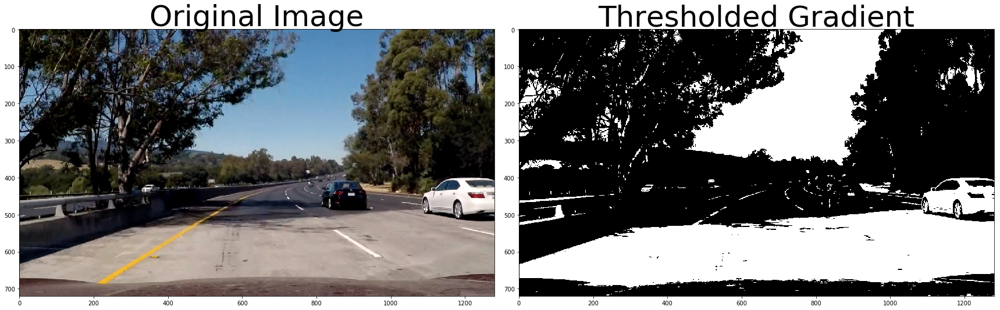

In [12]:
#21 June
#From lesson 15 video 31


image = mpimg.imread('test_images/test5.jpg')
#image = img
thresh = (120, 255)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
binary = np.zeros_like(gray)
binary[(gray > thresh[0]) & (gray <= thresh[1])] = 1

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(binary, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=50)

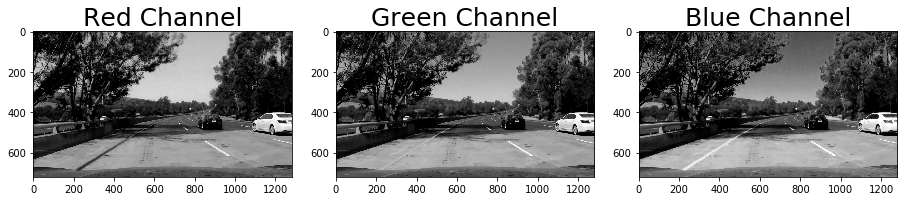

In [13]:
#21 June
#From lesson 15 video 31
#image from above
# BGR RGB converted
image = cv2.cvtColor(image , cv2.COLOR_BGR2RGB)

R = image[:,:,0]
G = image[:,:,1]
B = image[:,:,2]

# Plot the result
f, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize=(12, 4.5))
f.tight_layout()
ax1.imshow(R,cmap='gray')
ax1.set_title('Red Channel', fontsize=25)
ax2.imshow(G, cmap='gray')
ax2.set_title('Green Channel', fontsize=25)
ax3.imshow(B, cmap='gray')
ax3.set_title('Blue Channel', fontsize=25)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


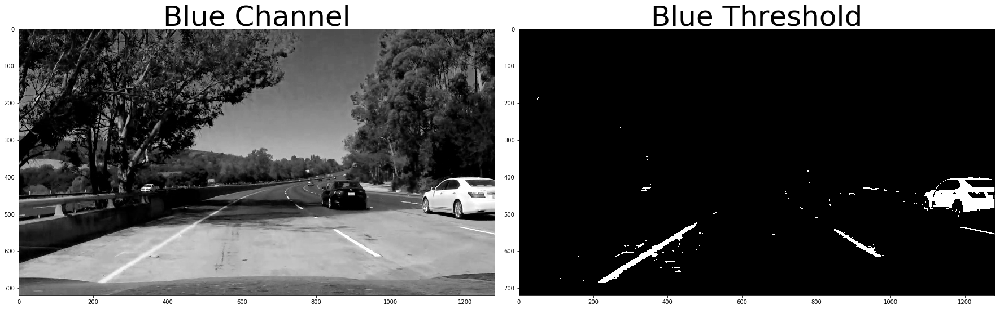

In [14]:
#21 June
#From lesson 15 video 31

thresh = (200, 255)
binary = np.zeros_like(B)
binary[(B > thresh[0]) & (B <= thresh[1])] = 1

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(B,cmap='gray')
ax1.set_title('Blue Channel', fontsize=50)
ax2.imshow(binary, cmap='gray')
ax2.set_title('Blue Threshold', fontsize=50)


plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

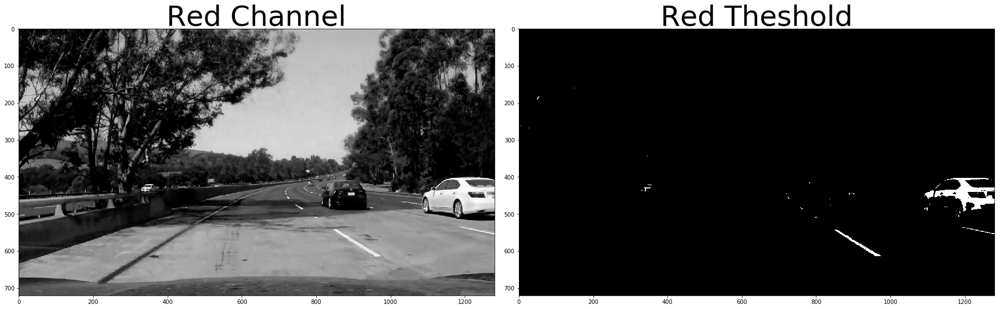

In [15]:
#21 June
#From lesson 15 video 31
#note  new theshold levels here 

thresh = (220, 255)
binary = np.zeros_like(R)
binary[(R > thresh[0]) & (R <= thresh[1])] = 1

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(R,cmap='gray')
ax1.set_title('Red Channel', fontsize=50)
ax2.imshow(binary, cmap='gray')
ax2.set_title('Red Theshold', fontsize=50)


plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

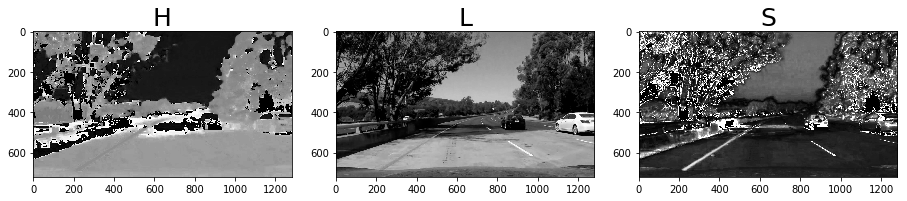

In [16]:
#21 June
#From lesson 15 video 31


hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
H = hls[:,:,0]
L = hls[:,:,1]
S = hls[:,:,2]

# Plot the result
f, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize=(12, 4.5))
f.tight_layout()
ax1.imshow(H,cmap='gray')
ax1.set_title('H', fontsize=25)
ax2.imshow(L, cmap='gray')
ax2.set_title('L', fontsize=25)
ax3.imshow(S, cmap='gray')
ax3.set_title('S', fontsize=25)


plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

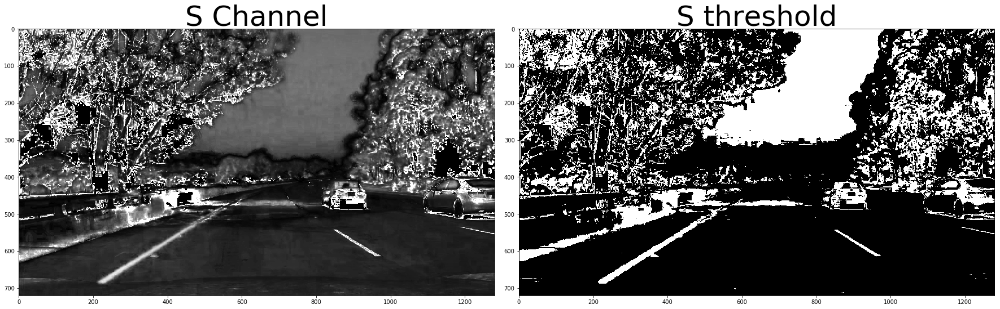

In [17]:
#21 June
#From lesson 15 video 31

thresh = (90, 255)
binary = np.zeros_like(S)
binary[(S > thresh[0]) & (S <= thresh[1])] = 1

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(S,cmap='gray')
ax1.set_title('S Channel', fontsize=50)
ax2.imshow(binary, cmap='gray')
ax2.set_title('S threshold', fontsize=50)


plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

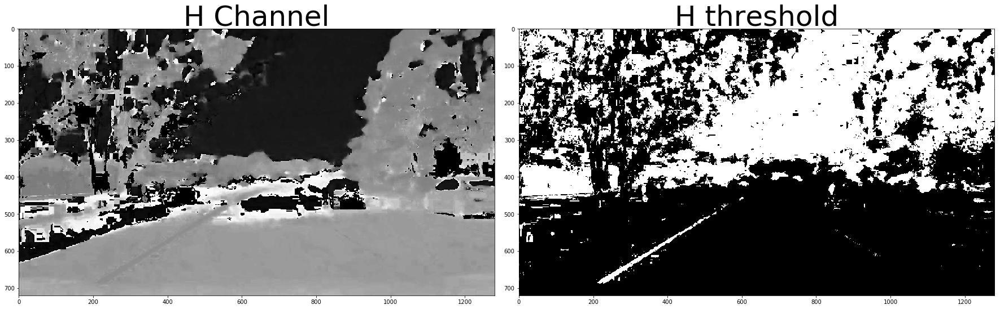

In [18]:
#21 June
#From lesson 15 video 31

thresh = (15, 100)
binary = np.zeros_like(H)
binary[(H > thresh[0]) & (H <= thresh[1])] = 1

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(H,cmap='gray')
ax1.set_title('H Channel', fontsize=50)
ax2.imshow(binary, cmap='gray')
ax2.set_title('H threshold', fontsize=50)


plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

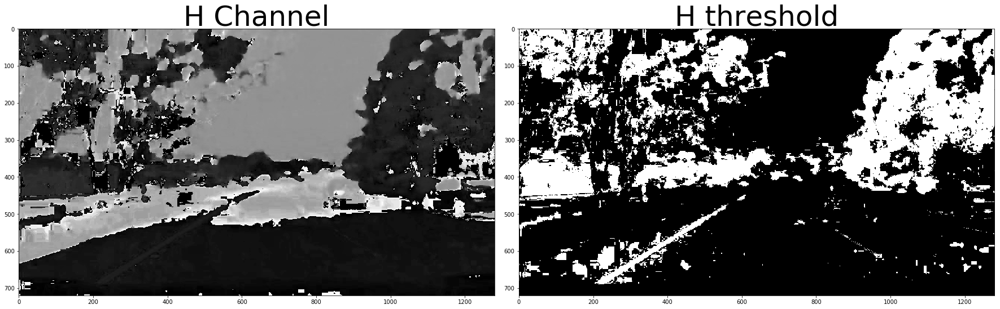

In [19]:
#21 June
#From lesson 15 video 31

# this cell uses the image from the notes nhe above one same values note they work better than above


image = mpimg.imread('test_images/test5.jpg')

hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
H = hls[:,:,0]
L = hls[:,:,1]
S = hls[:,:,2]


thresh = (15, 100)
binary = np.zeros_like(H)
binary[(H > thresh[0]) & (H <= thresh[1])] = 1

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(H,cmap='gray')
ax1.set_title('H Channel', fontsize=50)
ax2.imshow(binary, cmap='gray')
ax2.set_title('H threshold', fontsize=50)


plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

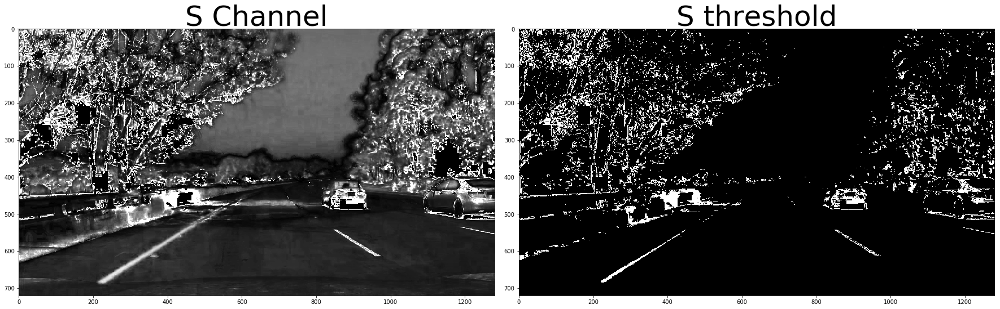

In [20]:
###for comparison I am using another test image number 6
# still good

#thresh = (90, 255)
thresh = (200, 255)

binary = np.zeros_like(S)
binary[(S > thresh[0]) & (S <= thresh[1])] = 1

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(S,cmap='gray')
ax1.set_title('S Channel', fontsize=50)
ax2.imshow(binary, cmap='gray')
ax2.set_title('S threshold', fontsize=50)


plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

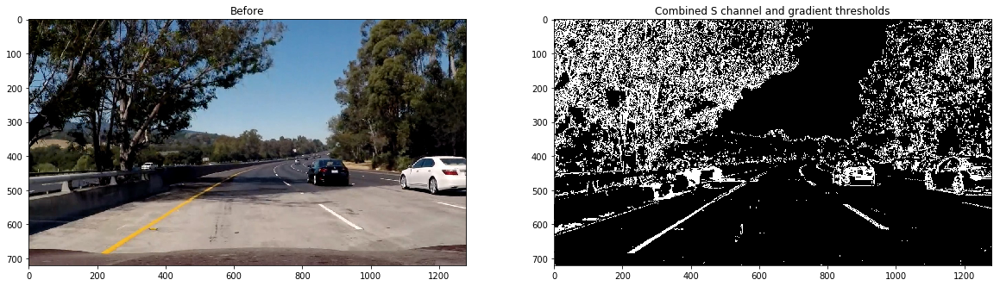

In [21]:
#21 June
#From lesson 15 video 31

# Convert to HLS color space and separate the S channel
# Note: img is the undistorted image
#image = mpimg.imread('test_images/test6.jpg')

def create_binary(image):

    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]

    # Grayscale image
    # NOTE: we already saw that standard grayscaling lost color information for the lane lines
    # Explore gradients in other colors spaces / color channels to see what might work better
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    thresh_min = 20 #20 post review trying new value
    thresh_max = 255
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Threshold color channel
    #s_thresh_min = 170
    #s_thresh_max = 255
    #s_thresh_min = 90 # using my own values here
    s_thresh_min = 170#200 # Post Review using my own values here trying a new high value to help with shade 
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1


    return combined_binary

# Plotting thresholded images
#f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
#ax1.set_title('Stacked thresholds')
#ax1.imshow(color_binary)

image = mpimg.imread('test_images/test5.jpg')

combined_binary = create_binary(image)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Before')
ax1.imshow(image)

ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(combined_binary, cmap='gray')

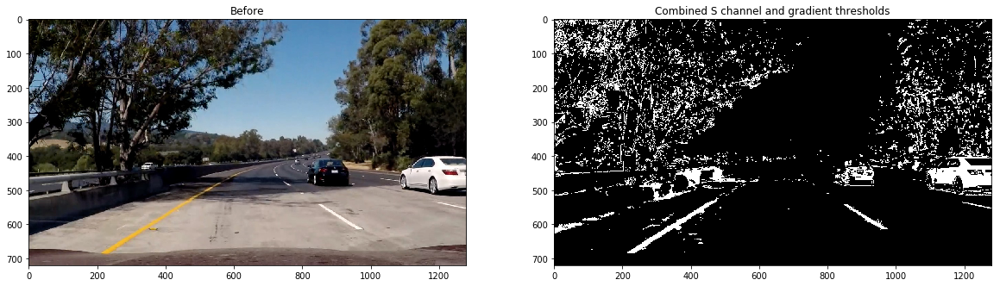

In [22]:
###this is POST REVIEW and another attempt at comnined binary
# 1) trying to make one good for white lines grayscale?
# 2) trying one good for yellow RGB R channel?
# 3) theshold and combine bothe aboove

#image = img
#thresh = (150, 255)
#gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
#binary = np.zeros_like(gray)
#binary[(gray > thresh[0]) & (gray <= thresh[1])] = 1


def create_binary2(image):
    #grayscale to find white lanes
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    gray_thresh = (230, 255)
    gray_binary = np.zeros_like(gray)
    gray_binary[(gray > gray_thresh[0]) & (gray <= gray_thresh[1])] = 1
    
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]

    #image = cv2.cvtColor(image , cv2.COLOR_BGR2RGB)

    R = image[:,:,0]
    G = image[:,:,1]
    B = image[:,:,2]

    thresh = (200, 255)
    R_binary = np.zeros_like(R)
    R_binary[(R > thresh[0]) & (R <= thresh[1])] = 1


    # Grayscale image
    # NOTE: we already saw that standard grayscaling lost color information for the lane lines
    # Explore gradients in other colors spaces / color channels to see what might work better
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    thresh_min = 254 #20 post review trying new value
    thresh_max = 255
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Threshold color channel
    #s_thresh_min = 170
    #s_thresh_max = 255
    #s_thresh_min = 90 # using my own values here
    s_thresh_min = 160#200 # Post Review using my own values here trying a new high value to help with shade 
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    #combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    #combined_binary[(gray_binary == 1) | (sxbinary == 1)] = 1
    combined_binary[(gray_binary == 1) |(s_binary == 1)| (R_binary ==1)] = 1
    
   


    return combined_binary

# Plotting thresholded images
#f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
#ax1.set_title('Stacked thresholds')
#ax1.imshow(color_binary)

image = mpimg.imread('test_images/test5.jpg')

combined_binary2 = create_binary2(image)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Before')
ax1.imshow(image)

ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(combined_binary2, cmap='gray')



In [23]:
##might use generator idea to make pip[eline that can process large movies

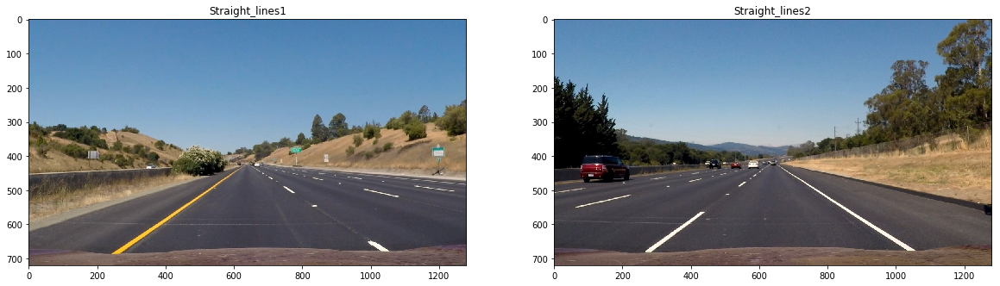

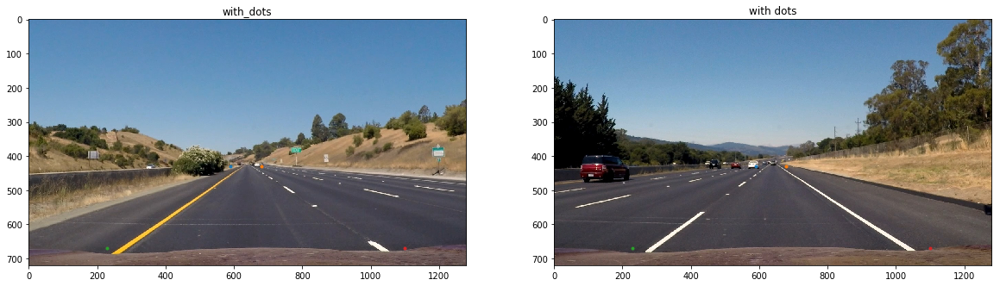

In [24]:
# 21 June
# ROI using straight lines 1 and 2
# ref Lesson 15 video 15

#image = mpimg.imread('test_images/test6.jpg')

straight1 , straight2  = mpimg.imread('test_images/straight_lines1.jpg'),mpimg.imread('test_images/straight_lines2.jpg')



# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Straight_lines1')
ax1.imshow(straight1)

ax2.set_title('Straight_lines2')
ax2.imshow(straight2, cmap='gray')

f,(ax3,ax4) = plt.subplots(1,2, figsize = (20,10))
ax3.set_title('with_dots')
ax3.imshow(straight1)
#plt.imshow(straight1)

ax4.set_title('with dots')
ax4.imshow(straight2)


ax3.plot(590,430,'.') #top_left 
ax3.plot(680,430,'.') #top_right
ax3.plot(230,670,'.') #bottom_left
ax3.plot(1100,670,'.') #bottom_right

plt.imshow(straight2)


ax4.plot(590,430,'.') #top_left 
ax4.plot(680,430,'.') #top_right
ax4.plot(230,670,'.') #bottom_left
ax4.plot(1100,670,'.') #bottom_right

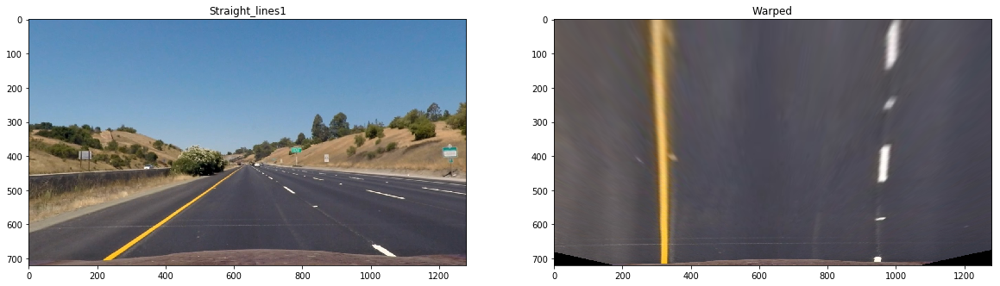

In [25]:
# 21 June
# ref Lesson 15 video 15

def warp(img):

    img_size = (img.shape[1], img.shape[0])
    
    #print(img_size)
    #points from above "dots"
    '''
    srcPixels = np.float32(
        [[680,430], 
        [1100,670],
        [230,670], 
        [590,430]] )
    
    dstPixels = np.float32(
            [[900,0],
            [900,720],
            [500,720],
            [120,0]]  )
    '''
    srcPixels = np.float32(
    [[585,460],
     [203,720],
     [1127,720],
     [695,460]      
    ])
    
    dstPixels = np.float32(
    [[320,0],
     [320,720],
     [960,720],
     [960,0]    
    ])
    

    
    
    M = cv2.getPerspectiveTransform(srcPixels,dstPixels)
    global Minv 
    Minv = cv2.getPerspectiveTransform(dstPixels,srcPixels) #inverse
    
    warped = cv2.warpPerspective(img, M,img_size, flags=cv2.INTER_LINEAR)
    
    return warped
#
#
#note this is not using above undistort for some reason I wonder is it causing probem?
#undistorted = cv2.undistort(straight1, mtx, dist, None, mtx)

#img = cv2.imread('camera_cal/'+filename)
img = straight1
img_size = (img.shape[1], img.shape[0])

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(object_points, image_points, img_size,None,None)


undistorted = cv2.undistort(straight1, mtx, dist, None, mtx)


#undistorted = create_undistorted(mtx, dist,straight1)
warped = warp(undistorted)

# Plotting thresholded imagestx
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Straight_lines1')
ax1.imshow(undistorted)

ax2.set_title('Warped')
ax2.imshow(warped, cmap='gray')


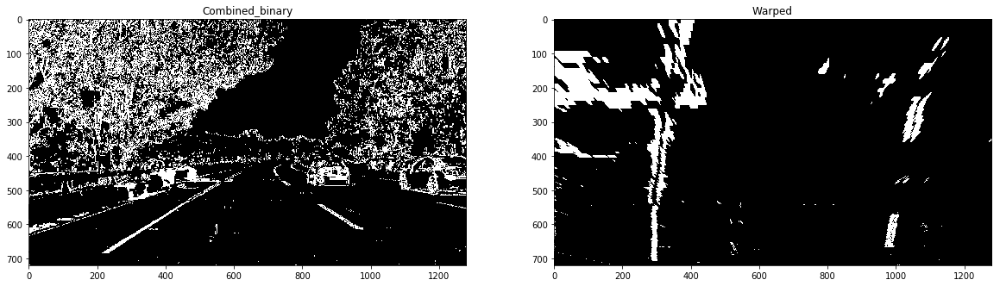

In [26]:
#maybe put above through distortion correction first to get perfect image like demo in template?

# can I calibrate center of vanishing point and calculate trun based on left or right of that?

warped = warp(combined_binary)

# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Combined_binary')
ax1.imshow(combined_binary,cmap='gray')

ax2.set_title('Warped')
ax2.imshow(warped, cmap='gray')

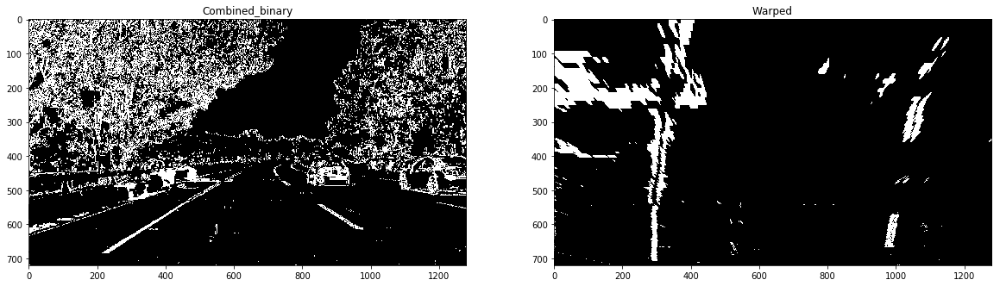

In [27]:

#same as above with testimage1


# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Combined_binary')
ax1.imshow(combined_binary,cmap='gray')

ax2.set_title('Warped')
ax2.imshow(warped, cmap='gray')


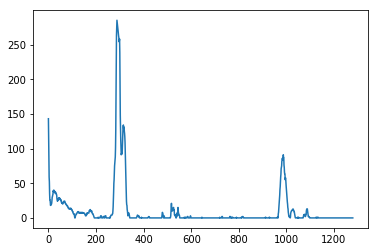

In [28]:
#from lesson 15 video 34

import numpy as np
import matplotlib.pyplot as plt
img = warped

histogram = np.sum(warped[img.shape[0]//2:,:], axis=0)
plt.plot(histogram)

In [29]:
#from lesson 15 video 34 , below histogram diagram
import numpy as np
import cv2
import matplotlib.pyplot as plt

def sliding_windows(combined_binary):
    #POST REVIEW 
    distance_from_center_in_meters = 0 # I was getting an error with some experiments porbably if now distance was calcuated for a frame so default is now 0
    
    
    #arrrgggg I put this in for testing and created a double warp at some stage
    binary_warped = warp(combined_binary)
    
    #binary_warped = combined_binary


    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    #margin = 100
    margin = 140
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    #average postion for center calc
    #assuming the lowest portion of the screen will give the best center of lane value 
    #I use the first good left and good right value to work from jr
    good_flag = False 
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # i think I will put this bit in an if stement so if there is nothing found just use the
        # histogram psotion as a sdefault this will create a polyline that is reasobale
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        #print('good_left_inds:',good_left_inds, 'good_right_inds',good_right_inds)
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
      
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        ######for center of road calculation
        #if good left and good right use value of center cals
          # If you found > minpix pixels, recenter next window on their mean position
        if (good_flag == False) : #I only want to to go in here once per frame
            if (len(good_left_inds) > minpix) & (len(good_right_inds) > minpix ) : 
                #print('leftx_current', leftx_current , 'rightx_current', rightx_current)
                center_of_lane= (leftx_current+ rightx_current) / 2
                center_of_image = 1280/2
                distance_from_center_in_pixels = center_of_image - center_of_lane
                distance_from_center_in_meters = distance_from_center_in_pixels * 3.7/700 #lesson 16 video 36 xm_per_pix = 3.7/700 
                
                    
                
        ###display message if not found
        #if len(good_left_inds) <= minpix:
        #    print("left min not found")
            
        #if len(good_right_inds) <= minpix:
        #    print("right min not found")

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    ######################################
    # trying to get what I need out of this function to skip quitfit
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
 

    return binary_warped ,left_fit , right_fit ,out_img ,nonzerox, nonzeroy, left_lane_inds, right_lane_inds,left_fitx,right_fitx, ploty ,distance_from_center_in_meters

In [30]:
#from advanced Lane lines project Tip and Tricks
# needs to be send plot x and y stuff
def paint_lines(binary_warped,image,left_fitx,right_fitx,ploty):# ??, Minv) #  no plotx ? 
#def paint_lane(binary_warped,image):
    warped = binary_warped

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    #print('left_fitx', left_fitx.shape, 'ploty', ploty.shape)
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), 1, newwarp, 0.3, 0)
   
    return result # changed for video feed
#################################

    
###################



(13891,)
1273
20926
20927
20935
21118
(6809,)
3464
20945
20946
20954
21137
distance_from_center_in_meters -0.15592857142857144


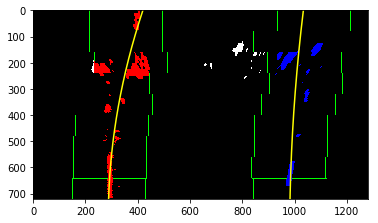

In [31]:



###adding some code to get closer look at a particaulr image
pipeline_test = cv2.imread('test_images/test5.jpg')

image = pipeline_test

undistorted = create_undistorted(object_points, image_points, image)

combined_binary = create_binary2(undistorted)

roi_corners = np.array([[(565,460),(153,720), (1182,720), (750,460)]]) #this is OK for test image 5

ROI = make_ROI_version2(combined_binary,roi_corners)  

#warped = warp(ROI ) #warp now in sldiing windows function

#####....all these returns.....I know I know don't say it.......

binary_warped ,left_fit , right_fit ,out_img ,nonzerox, nonzeroy, left_lane_inds, right_lane_inds, left_fitx,right_fitx, ploty , distance_from_center_in_meters = sliding_windows(ROI)

#painted_lane = paint_lines(binary_warped,undistorted,left_fit,right_fit,ploty)
painted_lane = paint_lines(binary_warped,undistorted,left_fitx,right_fitx,ploty)


#from lesson 15 video 34 , below histogram diagram
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
#trying to figure out how best to use the lane inds here for car position values
print(left_lane_inds.shape)
print(left_lane_inds[-1])
print(left_lane_inds[1])
print(left_lane_inds[2])
print(left_lane_inds[10])
print(left_lane_inds[100])
print(right_lane_inds.shape)
print(right_lane_inds[-1])
print(right_lane_inds[1])
print(right_lane_inds[2])
print(right_lane_inds[10])
print(right_lane_inds[100])
print('distance_from_center_in_meters',distance_from_center_in_meters)



In [32]:
#from lesson 15 video 34 


def quick_fit(binary_warped,   left_fit , right_fit ,out_img ,nonzerox, nonzeroy, left_lane_inds,right_lane_inds):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    

    return binary_warped , left_fitx, right_fitx, ploty
 
#below 3 lines is makings of pipleine to be repeated else where
#image = mpimg.imread('test_images/test5.jpg')
#binary = create_binary(image)
#binary_warped = warp(binary)
#binary_warped = quick_fit(binary_warped,   left_fit , right_fit ,out_img ,nonzerox, nonzeroy, left_lane_inds,right_lane_inds)


In [33]:

#from lesson 15 video 34 

def quick_draw(binary_warped):
    
    ##I put this in from above  quick_fit
    
    margin = 100
    
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    plt.imshow(result)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    
    return result
####################################
# lines to test funciton
#result = quick_draw(binary_warped) # gives this error at the moment ValueError: could not broadcast input array from shape (720,1280) into shape (720)

In [34]:
#plt.imshow(result) #just checking it was working outside of function

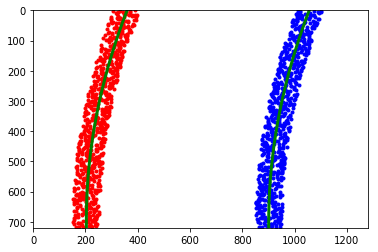

In [35]:

#from lesson 15 video 34 

import numpy as np
import matplotlib.pyplot as plt

def fake_plot():
    # Generate some fake data to represent lane-line pixels
    ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
    quadratic_coeff = 3e-4 # arbitrary quadratic coefficient
    # For each y position generate random x position within +/-50 pix
    # of the line base position in each case (x=200 for left, and x=900 for right)
    leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                  for y in ploty])
    rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                    for y in ploty])

    leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
    rightx = rightx[::-1]  # Reverse to match top-to-bottom in y


    # Fit a second order polynomial to pixel positions in each fake lane line
    left_fit = np.polyfit(ploty, leftx, 2)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fit = np.polyfit(ploty, rightx, 2)
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Plot up the fake data
    mark_size = 3
    plt.plot(leftx, ploty, 'o', color='red', markersize=mark_size)
    plt.plot(rightx, ploty, 'o', color='blue', markersize=mark_size)
    plt.xlim(0, 1280)
    plt.ylim(0, 720)
    plt.plot(left_fitx, ploty, color='green', linewidth=3)
    plt.plot(right_fitx, ploty, color='green', linewidth=3)
    plt.gca().invert_yaxis() # to visualize as we do the images
    
    
    return left_fit, left_fitx,leftx, right_fit, right_fitx,rightx
    
left_fit, left_fitx,leftx, right_fit, right_fitx,rightx = fake_plot()


In [36]:

#from lesson 15 video 34 

def get_radius_in_pixels(left_fit,rigth_fit):
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    #I did this global to fix error in get_radius in metere
    global y_eval
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    print(left_curverad, right_curverad)
    # Example values: 1926.74 1908.48
    
    return left_curverad, right_curverad


#hmmmmmmmmmmmmmmmmm left fit needs to be passed into function here
left_curverad, right_curverad = get_radius_in_pixels(left_fit,right_fit)


1549.74875452 1586.55542456


In [37]:
#def get_radius_in_meters(left_fit,right_fit,leftx,rightx): #more than needed
def get_radius_in_meters(leftx,rightx):

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    #print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m
    
    return left_curverad,right_curverad
#below line maybe causeing not changeing lane in output video    
#leftx,left_curverad, right_curverad = get_radius_in_meters(left_fit,right_fit,leftx,rightx)
#left_curverad, right_curverad = get_radius_in_meters(left_fit,right_fit,leftx,rightx)
left_curverad, right_curverad = get_radius_in_meters(leftx,rightx)

In [38]:

# attempting to just use sliding windows to see how that goes
# ROI adjusted for better left side

def image_pipeline4(image, is_movie = True):
    
    if (is_movie == True):
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 

    undistorted = create_undistorted(object_points, image_points, image)
    combined_binary = create_binary2(undistorted)
    roi_corners = np.array([[(565,460),(153,720), (1182,720), (750,460)]]) #this is OK for test image 5
    ROI = make_ROI_version2(combined_binary,roi_corners)  
       
    #note warp was getting called by sliding windows causeing double warp
    warped = warp(ROI ) # warp is now done in sliding windows this is for below pictures
    
    #binary_warped,image,left_fitx,right_fitx,ploty, Minv)
    binary_warped ,left_fit , right_fit ,out_img ,nonzerox, nonzeroy, left_lane_inds, right_lane_inds, left_fitx,right_fitx, ploty, distance_from_center_in_meters  = sliding_windows(ROI)
        
    #left_curverad, right_curverad = get_radius_in_meters(leftx,rightx)
    left_curverad, right_curverad = get_radius_in_meters(left_fitx,right_fitx)
    average_curve = int((left_curverad + right_curverad) /2 )
                
    painted_lane = paint_lines(binary_warped,undistorted,left_fitx,right_fitx,ploty)
    #below line from https://github.com/liferlisiqi/Advanced-Lane-Finding/blob/master/Advanced-lane-lines.ipynb
    #result = cv2.putText(result, 'radius of curvature:' + str(curvature) + 'm', (40, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 255, 255), 2)
    # and https://docs.opencv.org/3.1.0/dc/da5/tutorial_py_drawing_functions.html
    #my version
    font = cv2.FONT_HERSHEY_SIMPLEX 
    painted_lane_with_text =  cv2.putText(painted_lane,'Curve Radius:' + str(average_curve), (40,50) , font, 1.5, (0, 255,0) , 2)
    painted_lane_with_text =  cv2.putText(painted_lane,'Distance from centre:' + str(round(distance_from_center_in_meters,1)), (40,80) , font, 1.5, (0, 255,0) , 2)
    
    
    # This section printes out the pipeline in a plt great for troubelshooting images but takes huge memnory in a video
    # so I made it optional but I did use it on subclips of video 1 or 2 second long to see what was going on
    if (is_movie == True):
        
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
       
        f, (ax1, ax2, ax3,ax4,ax5) = plt.subplots(1, 5, figsize=(20,10))

        ax1.imshow( combined_binary)
        ax1.set_title('combined_binary', fontsize=10)

        ax2.imshow( ROI)
        ax2.set_title('ROI', fontsize=10)

        ax3.imshow( warped)
        ax3.set_title('warped', fontsize=10)

        ax4.imshow(out_img)
        ax4.set_title('Sliding Windows', fontsize=10)

        #ax5.imshow( painted_lane)
        ax5.imshow( painted_lane_with_text)
        ax5.set_title('painted_lane_with_text', fontsize=10)
    
    #return painted_lane
    return painted_lane_with_text
   
################################################
# test funciton
pipeline_test = cv2.imread('test_images/straight_lines2.jpg')
test = image_pipeline4(pipeline_test,is_movie = False)
#plt.imshow(test )

pipeline_test = cv2.imread('test_images/straight_lines1.jpg')
test = image_pipeline4(pipeline_test,is_movie = False)
#plt.imshow(test )


#pipeline_test = cv2.imread('test_images/signs_vehicles_xygrad.png')
#test = image_pipeline4(pipeline_test,is_movie = False)

pipeline_test = cv2.imread('test_images/test1.jpg')
test = image_pipeline4(pipeline_test,is_movie = False)

pipeline_test = cv2.imread('test_images/test2.jpg')
test = image_pipeline4(pipeline_test,is_movie = False)

pipeline_test = cv2.imread('test_images/test3.jpg')
test = image_pipeline4(pipeline_test,is_movie = False)

pipeline_test = cv2.imread('test_images/test4.jpg')
test = image_pipeline4(pipeline_test,is_movie = False)

pipeline_test = cv2.imread('test_images/test5.jpg')
test = image_pipeline4(pipeline_test,is_movie = False)

pipeline_test = cv2.imread('test_images/test6.jpg')
test = image_pipeline4(pipeline_test,is_movie = False)

In [39]:
#from advanced Lane lines project Tip and Tricks
# Define a class to receive the characteristics of each line detection
class Line():
    
   
    
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        # these are the raidus that go on the output
        # I will discard a line where they are not similar and hense not parallel
        self.left_curve_radius = 0
        self.right_curve_radius = 0
        


In [45]:
# attempting line class ideas here
#pipleine 5 is in another file

global last_good_left_fitx
global last_good_right_fitx
global last_good_ploty
global first_line
first_line = 0
global last_good_left_curverad
global last_good_right_curverad


def image_pipeline6(image,  is_movie = True):
    
    global last_good_left_fitx
    global last_good_right_fitx
    global last_good_ploty
    global first_line
    global last_good_left_curverad
    global last_good_right_curverad
 
    
    if (is_movie == True):
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 

    undistorted = create_undistorted(object_points, image_points, image)
    combined_binary = create_binary2(undistorted)
    roi_corners = np.array([[(565,460),(153,720), (1182,720), (750,460)]]) #this is OK for test image 5
    ROI = make_ROI_version2(combined_binary,roi_corners)  
       
    #note warp was getting called by sliding windows causeing double warp
    warped = warp(ROI ) # warp is now done in sliding windows this is for below pictures
    
    #binary_warped,image,left_fitx,right_fitx,ploty, Minv)
    binary_warped ,left_fit , right_fit ,out_img ,nonzerox, nonzeroy, left_lane_inds, right_lane_inds, left_fitx,right_fitx, ploty, distance_from_center_in_meters  = sliding_windows(ROI)
        
    #left_curverad, right_curverad = get_radius_in_meters(leftx,rightx)
    left_curverad, right_curverad = get_radius_in_meters(left_fitx,right_fitx)
    average_curve = int((left_curverad + right_curverad) /2 )
    
    print('left_curverad:', left_curverad,'right_curverad', right_curverad ,'average_curve',average_curve)
    
  
 
    if (first_line == 0):
        last_good_left_fitx,last_good_right_fitx,last_good_ploty = left_fitx,right_fitx,ploty
        last_good_left_curverad,last_good_right_curverad = left_curverad, right_curverad
        first_line = 10
        print('in first line section')
    #   last_good_left_curved
    # below check that new curve is with in 10% of last good 
    if (left_curverad > (last_good_left_curverad*1.5)) or (left_curverad < (last_good_left_curverad*0.5)) or (left_curverad < 500):
          
        left_fitx = last_good_left_fitx
        print('changed a left', 'left_curverad', left_curverad ,'last_good_left_curverad', last_good_left_curverad)
    else :
        last_good_left_curverad = left_curverad 
        
   
    ##maybe nothing below about 600 curve as that seems to be the smallest
        
    if (right_curverad > (last_good_right_curverad*1.5)) or (right_curverad < (last_good_right_curverad*0.5) ) or (right_curverad < 500):
    
        
        right_fitx = last_good_right_fitx
        print('changed a right', 'right_curverad', right_curverad, 'last_good_right_curverad', last_good_right_curverad)
    else :
        last_good_right_curverad = right_curverad
        
        
        
    painted_lane = paint_lines(binary_warped,undistorted,left_fitx,right_fitx,ploty)
        
    last_good_left_fitx = left_fitx 
        
    last_good_right_fitx = right_fitx 
    

                
    #painted_lane = paint_lines(binary_warped,undistorted,left_fitx,right_fitx,ploty)
    #below line from https://github.com/liferlisiqi/Advanced-Lane-Finding/blob/master/Advanced-lane-lines.ipynb
    #result = cv2.putText(result, 'radius of curvature:' + str(curvature) + 'm', (40, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 255, 255), 2)
    # and https://docs.opencv.org/3.1.0/dc/da5/tutorial_py_drawing_functions.html
    #my version
    font = cv2.FONT_HERSHEY_SIMPLEX 
    painted_lane_with_text =  cv2.putText(painted_lane,'Curve Radius:' + str(average_curve), (40,50) , font, 1.5, (0, 255,0) , 2)
    painted_lane_with_text =  cv2.putText(painted_lane,'Distance from centre:' + str(round(distance_from_center_in_meters,1)), (40,80) , font, 1.5, (0, 255,0) , 2)
    
    
    # This section printes out the pipeline in a plt great for troubelshooting images but takes huge memnory in a video
    # so I made it optional but I did use it on subclips of video 1 or 2 second long to see what was going on
    if (is_movie == False):
        
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
       
        f, (ax1, ax2, ax3,ax4,ax5) = plt.subplots(1, 5, figsize=(20,10))

        ax1.imshow( combined_binary)
        ax1.set_title('combined_binary', fontsize=10)

        ax2.imshow( ROI)
        ax2.set_title('ROI', fontsize=10)

        ax3.imshow( warped)
        ax3.set_title('warped', fontsize=10)

        ax4.imshow(out_img)
        ax4.set_title('Sliding Windows', fontsize=10)

        #ax5.imshow( painted_lane)
        ax5.imshow( painted_lane_with_text)
        ax5.set_title('painted_lane_with_text', fontsize=10)
    
    #return painted_lane
    return painted_lane_with_text
'''   
################################################
# test funciton
pipeline_test = cv2.imread('test_images/straight_lines2.jpg')
test = image_pipeline6(pipeline_test,is_movie = False)
#plt.imshow(test )

pipeline_test = cv2.imread('test_images/straight_lines1.jpg')
test = image_pipeline6(pipeline_test,is_movie = False)
#plt.imshow(test )


#pipeline_test = cv2.imread('test_images/signs_vehicles_xygrad.png')
#test = image_pipeline6(pipeline_test,is_movie = False)

pipeline_test = cv2.imread('test_images/test1.jpg')
test = image_pipeline6(pipeline_test,is_movie = False)

pipeline_test = cv2.imread('test_images/test2.jpg')
test = image_pipeline6(pipeline_test,is_movie = False)

pipeline_test = cv2.imread('test_images/test3.jpg')
test = image_pipeline6(pipeline_test,is_movie = False)

pipeline_test = cv2.imread('test_images/test4.jpg')
test = image_pipeline6(pipeline_test,is_movie = False)

pipeline_test = cv2.imread('test_images/test5.jpg')
test = image_pipeline6(pipeline_test,is_movie = False)

pipeline_test = cv2.imread('test_images/test6.jpg')
test = image_pipeline6(pipeline_test,is_movie = False)
'''

"   \n################################################\n# test funciton\npipeline_test = cv2.imread('test_images/straight_lines2.jpg')\ntest = image_pipeline6(pipeline_test,is_movie = False)\n#plt.imshow(test )\n\npipeline_test = cv2.imread('test_images/straight_lines1.jpg')\ntest = image_pipeline6(pipeline_test,is_movie = False)\n#plt.imshow(test )\n\n\n#pipeline_test = cv2.imread('test_images/signs_vehicles_xygrad.png')\n#test = image_pipeline6(pipeline_test,is_movie = False)\n\npipeline_test = cv2.imread('test_images/test1.jpg')\ntest = image_pipeline6(pipeline_test,is_movie = False)\n\npipeline_test = cv2.imread('test_images/test2.jpg')\ntest = image_pipeline6(pipeline_test,is_movie = False)\n\npipeline_test = cv2.imread('test_images/test3.jpg')\ntest = image_pipeline6(pipeline_test,is_movie = False)\n\npipeline_test = cv2.imread('test_images/test4.jpg')\ntest = image_pipeline6(pipeline_test,is_movie = False)\n\npipeline_test = cv2.imread('test_images/test5.jpg')\ntest = image_pipe

In [41]:
############################## 
# video handling section

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML






output_video = 'Second Submission.mp4'



#input_video = VideoFileClip("project_video.mp4").subclip(40,42)
input_video = VideoFileClip("project_video.mp4")
global first_line
first_line = 0
clip = input_video.fl_image(image_pipeline6)


clip.write_videofile(output_video, audio=False)



left_curverad: 721.710610452 right_curverad 770.297629514 average_curve 746
in first line section
[MoviePy] >>>> Building video Second Submission.mp4
[MoviePy] Writing video Second Submission.mp4


  0%|                                                                     | 0/1261 [00:00<?, ?it/s]

left_curverad: 721.710610452 right_curverad 770.297629514 average_curve 746


  0%|                                                             | 1/1261 [00:01<28:21,  1.35s/it]

left_curverad: 683.476100329 right_curverad 949.471935116 average_curve 816


  0%|                                                             | 2/1261 [00:02<28:18,  1.35s/it]

left_curverad: 669.431040829 right_curverad 797.836619265 average_curve 733


  0%|▏                                                            | 3/1261 [00:04<28:23,  1.35s/it]

left_curverad: 625.982470628 right_curverad 731.7182241 average_curve 678


  0%|▏                                                            | 4/1261 [00:05<28:19,  1.35s/it]

left_curverad: 624.043278968 right_curverad 739.229578452 average_curve 681


  0%|▏                                                            | 5/1261 [00:06<28:25,  1.36s/it]

left_curverad: 627.724906054 right_curverad 766.413186303 average_curve 697


  0%|▎                                                            | 6/1261 [00:08<28:19,  1.35s/it]

left_curverad: 656.832253799 right_curverad 760.106629638 average_curve 708


  1%|▎                                                            | 7/1261 [00:09<28:12,  1.35s/it]

left_curverad: 670.090887832 right_curverad 1894.46252492 average_curve 1282
changed a right right_curverad 1894.46252492 last_good_right_curverad 760.106629638


  1%|▍                                                            | 8/1261 [00:10<28:27,  1.36s/it]

left_curverad: 690.401487923 right_curverad 1629.15978085 average_curve 1159
changed a right right_curverad 1629.15978085 last_good_right_curverad 760.106629638


  1%|▍                                                            | 9/1261 [00:12<28:19,  1.36s/it]

left_curverad: 704.775475317 right_curverad 1765.75416472 average_curve 1235
changed a right right_curverad 1765.75416472 last_good_right_curverad 760.106629638


  1%|▍                                                           | 10/1261 [00:13<28:18,  1.36s/it]

left_curverad: 725.645560268 right_curverad 1377.95182228 average_curve 1051
changed a right right_curverad 1377.95182228 last_good_right_curverad 760.106629638


  1%|▌                                                           | 11/1261 [00:15<30:35,  1.47s/it]

left_curverad: 797.897458269 right_curverad 2179.4317053 average_curve 1488
changed a right right_curverad 2179.4317053 last_good_right_curverad 760.106629638


  1%|▌                                                           | 12/1261 [00:16<30:08,  1.45s/it]

left_curverad: 840.583924735 right_curverad 1385.51955234 average_curve 1113
changed a right right_curverad 1385.51955234 last_good_right_curverad 760.106629638


  1%|▌                                                           | 13/1261 [00:18<29:35,  1.42s/it]

left_curverad: 926.955165789 right_curverad 1245.93113376 average_curve 1086
changed a right right_curverad 1245.93113376 last_good_right_curverad 760.106629638


  1%|▋                                                           | 14/1261 [00:19<29:11,  1.40s/it]

left_curverad: 925.019696827 right_curverad 1807.78645076 average_curve 1366
changed a right right_curverad 1807.78645076 last_good_right_curverad 760.106629638


  1%|▋                                                           | 15/1261 [00:20<29:00,  1.40s/it]

left_curverad: 953.611074712 right_curverad 1014.10291972 average_curve 983


  1%|▊                                                           | 16/1261 [00:22<28:48,  1.39s/it]

left_curverad: 986.550248133 right_curverad 983.3699369 average_curve 984


  1%|▊                                                           | 17/1261 [00:23<28:29,  1.37s/it]

left_curverad: 1010.44672898 right_curverad 1016.27985181 average_curve 1013


  1%|▊                                                           | 18/1261 [00:24<28:16,  1.36s/it]

left_curverad: 1042.11467209 right_curverad 1035.80823828 average_curve 1038


  2%|▉                                                           | 19/1261 [00:26<28:11,  1.36s/it]

left_curverad: 1161.83876907 right_curverad 1049.38675915 average_curve 1105


  2%|▉                                                           | 20/1261 [00:27<28:01,  1.35s/it]

left_curverad: 1264.49879405 right_curverad 1142.73421861 average_curve 1203


  2%|▉                                                           | 21/1261 [00:28<27:51,  1.35s/it]

left_curverad: 1307.96667484 right_curverad 1258.48720096 average_curve 1283


  2%|█                                                           | 22/1261 [00:30<28:35,  1.38s/it]

left_curverad: 1352.13930686 right_curverad 1374.95882323 average_curve 1363


  2%|█                                                           | 23/1261 [00:31<28:19,  1.37s/it]

left_curverad: 1207.95302016 right_curverad 1147.51193344 average_curve 1177


  2%|█▏                                                          | 24/1261 [00:33<28:06,  1.36s/it]

left_curverad: 1085.10229667 right_curverad 874.851070538 average_curve 979


  2%|█▏                                                          | 25/1261 [00:34<28:02,  1.36s/it]

left_curverad: 1068.49722145 right_curverad 942.845326634 average_curve 1005


  2%|█▏                                                          | 26/1261 [00:35<27:52,  1.35s/it]

left_curverad: 978.196658656 right_curverad 778.649424722 average_curve 878


  2%|█▎                                                          | 27/1261 [00:37<27:55,  1.36s/it]

left_curverad: 1061.17892881 right_curverad 807.230887841 average_curve 934


  2%|█▎                                                          | 28/1261 [00:38<27:50,  1.35s/it]

left_curverad: 942.750908489 right_curverad 694.719187032 average_curve 818


  2%|█▍                                                          | 29/1261 [00:39<27:40,  1.35s/it]

left_curverad: 799.068833694 right_curverad 715.920582071 average_curve 757


  2%|█▍                                                          | 30/1261 [00:41<27:40,  1.35s/it]

left_curverad: 748.648572443 right_curverad 745.778040951 average_curve 747


  2%|█▍                                                          | 31/1261 [00:42<27:42,  1.35s/it]

left_curverad: 670.103750502 right_curverad 728.688239372 average_curve 699


  3%|█▌                                                          | 32/1261 [00:43<27:47,  1.36s/it]

left_curverad: 673.609560672 right_curverad 864.49760655 average_curve 769


  3%|█▌                                                          | 33/1261 [00:45<27:58,  1.37s/it]

left_curverad: 636.282370639 right_curverad 1111.06720932 average_curve 873


  3%|█▌                                                          | 34/1261 [00:46<27:58,  1.37s/it]

left_curverad: 609.596877114 right_curverad 1145.06154549 average_curve 877


  3%|█▋                                                          | 35/1261 [00:47<27:56,  1.37s/it]

left_curverad: 583.172467006 right_curverad 1264.16560552 average_curve 923


  3%|█▋                                                          | 36/1261 [00:49<27:49,  1.36s/it]

left_curverad: 572.344527926 right_curverad 667.908205825 average_curve 620


  3%|█▊                                                          | 37/1261 [00:50<28:12,  1.38s/it]

left_curverad: 542.594115503 right_curverad 771.499452398 average_curve 657


  3%|█▊                                                          | 38/1261 [00:52<27:59,  1.37s/it]

left_curverad: 524.795772008 right_curverad 900.871469749 average_curve 712


  3%|█▊                                                          | 39/1261 [00:53<28:00,  1.37s/it]

left_curverad: 522.077800924 right_curverad 612.372163375 average_curve 567


  3%|█▉                                                          | 40/1261 [00:54<27:59,  1.38s/it]

left_curverad: 520.270952594 right_curverad 615.843329136 average_curve 568


  3%|█▉                                                          | 41/1261 [00:56<27:49,  1.37s/it]

left_curverad: 518.177487201 right_curverad 646.091895979 average_curve 582


  3%|█▉                                                          | 42/1261 [00:57<27:42,  1.36s/it]

left_curverad: 515.399945007 right_curverad 647.349700526 average_curve 581


  3%|██                                                          | 43/1261 [00:58<27:45,  1.37s/it]

left_curverad: 530.860174679 right_curverad 679.639861275 average_curve 605


  3%|██                                                          | 44/1261 [01:00<27:42,  1.37s/it]

left_curverad: 540.262753931 right_curverad 667.090902534 average_curve 603


  4%|██▏                                                         | 45/1261 [01:01<27:30,  1.36s/it]

left_curverad: 534.789383906 right_curverad 826.505833294 average_curve 680


  4%|██▏                                                         | 46/1261 [01:02<27:27,  1.36s/it]

left_curverad: 574.630975959 right_curverad 916.201972336 average_curve 745


  4%|██▏                                                         | 47/1261 [01:04<27:47,  1.37s/it]

left_curverad: 588.054391721 right_curverad 861.188413231 average_curve 724


  4%|██▎                                                         | 48/1261 [01:05<28:09,  1.39s/it]

left_curverad: 617.563349582 right_curverad 912.921865411 average_curve 765


  4%|██▎                                                         | 49/1261 [01:07<27:53,  1.38s/it]

left_curverad: 666.076963787 right_curverad 850.132041618 average_curve 758


  4%|██▍                                                         | 50/1261 [01:08<27:34,  1.37s/it]

left_curverad: 715.49091618 right_curverad 739.261027593 average_curve 727


  4%|██▍                                                         | 51/1261 [01:09<27:24,  1.36s/it]

left_curverad: 807.526521351 right_curverad 640.923489136 average_curve 724


  4%|██▍                                                         | 52/1261 [01:11<27:31,  1.37s/it]

left_curverad: 862.091246759 right_curverad 596.390048548 average_curve 729


  4%|██▌                                                         | 53/1261 [01:12<28:10,  1.40s/it]

left_curverad: 906.167263355 right_curverad 655.162479908 average_curve 780


  4%|██▌                                                         | 54/1261 [01:14<27:50,  1.38s/it]

left_curverad: 963.875603991 right_curverad 659.862158526 average_curve 811


  4%|██▌                                                         | 55/1261 [01:15<27:37,  1.37s/it]

left_curverad: 1081.02021784 right_curverad 698.452764657 average_curve 889


  4%|██▋                                                         | 56/1261 [01:16<27:26,  1.37s/it]

left_curverad: 1157.35046028 right_curverad 732.064064916 average_curve 944


  5%|██▋                                                         | 57/1261 [01:18<27:29,  1.37s/it]

left_curverad: 1250.15444112 right_curverad 839.000837839 average_curve 1044


  5%|██▊                                                         | 58/1261 [01:19<27:16,  1.36s/it]

left_curverad: 1157.17563127 right_curverad 1142.35291012 average_curve 1149


  5%|██▊                                                         | 59/1261 [01:20<27:12,  1.36s/it]

left_curverad: 1031.96700322 right_curverad 1245.48940707 average_curve 1138


  5%|██▊                                                         | 60/1261 [01:22<27:20,  1.37s/it]

left_curverad: 926.537551979 right_curverad 1002.09112615 average_curve 964


  5%|██▉                                                         | 61/1261 [01:23<27:19,  1.37s/it]

left_curverad: 874.239541595 right_curverad 915.267105643 average_curve 894


  5%|██▉                                                         | 62/1261 [01:24<27:16,  1.37s/it]

left_curverad: 875.201554444 right_curverad 759.646033346 average_curve 817


  5%|██▉                                                         | 63/1261 [01:26<27:10,  1.36s/it]

left_curverad: 821.238581081 right_curverad 826.259121113 average_curve 823


  5%|███                                                         | 64/1261 [01:27<27:13,  1.36s/it]

left_curverad: 823.359153913 right_curverad 926.949434305 average_curve 875


  5%|███                                                         | 65/1261 [01:29<27:07,  1.36s/it]

left_curverad: 783.847969746 right_curverad 976.743841441 average_curve 880


  5%|███▏                                                        | 66/1261 [01:30<26:53,  1.35s/it]

left_curverad: 764.704841341 right_curverad 944.579247669 average_curve 854


  5%|███▏                                                        | 67/1261 [01:31<26:52,  1.35s/it]

left_curverad: 749.330996868 right_curverad 1025.1592707 average_curve 887


  5%|███▏                                                        | 68/1261 [01:33<26:51,  1.35s/it]

left_curverad: 717.257860817 right_curverad 1000.28269387 average_curve 858


  5%|███▎                                                        | 69/1261 [01:34<26:56,  1.36s/it]

left_curverad: 780.067975592 right_curverad 1091.05116871 average_curve 935


  6%|███▎                                                        | 70/1261 [01:35<26:48,  1.35s/it]

left_curverad: 802.71768181 right_curverad 1959.21827764 average_curve 1380
changed a right right_curverad 1959.21827764 last_good_right_curverad 1091.05116871


  6%|███▍                                                        | 71/1261 [01:37<26:47,  1.35s/it]

left_curverad: 879.160269809 right_curverad 1750.31818296 average_curve 1314
changed a right right_curverad 1750.31818296 last_good_right_curverad 1091.05116871


  6%|███▍                                                        | 72/1261 [01:38<26:46,  1.35s/it]

left_curverad: 945.198129199 right_curverad 2068.05589792 average_curve 1506
changed a right right_curverad 2068.05589792 last_good_right_curverad 1091.05116871


  6%|███▍                                                        | 73/1261 [01:39<26:46,  1.35s/it]

left_curverad: 1068.65942872 right_curverad 1322.15456278 average_curve 1195


  6%|███▌                                                        | 74/1261 [01:41<26:45,  1.35s/it]

left_curverad: 1176.53252326 right_curverad 1372.5126883 average_curve 1274


  6%|███▌                                                        | 75/1261 [01:42<26:35,  1.35s/it]

left_curverad: 1326.31670664 right_curverad 987.925781502 average_curve 1157


  6%|███▌                                                        | 76/1261 [01:43<26:36,  1.35s/it]

left_curverad: 1676.68177525 right_curverad 699.813341693 average_curve 1188


  6%|███▋                                                        | 77/1261 [01:45<26:33,  1.35s/it]

left_curverad: 2013.36250526 right_curverad 1038.54814858 average_curve 1525


  6%|███▋                                                        | 78/1261 [01:46<26:30,  1.34s/it]

left_curverad: 2274.00963866 right_curverad 667.433242028 average_curve 1470


  6%|███▊                                                        | 79/1261 [01:47<26:28,  1.34s/it]

left_curverad: 2163.50370285 right_curverad 716.276209411 average_curve 1439


  6%|███▊                                                        | 80/1261 [01:49<26:26,  1.34s/it]

left_curverad: 2305.32347063 right_curverad 739.453442972 average_curve 1522


  6%|███▊                                                        | 81/1261 [01:50<26:24,  1.34s/it]

left_curverad: 2333.97683385 right_curverad 751.073462892 average_curve 1542


  7%|███▉                                                        | 82/1261 [01:51<26:23,  1.34s/it]

left_curverad: 1722.78639605 right_curverad 866.825374068 average_curve 1294


  7%|███▉                                                        | 83/1261 [01:53<26:18,  1.34s/it]

left_curverad: 1885.14034324 right_curverad 1271.83713352 average_curve 1578


  7%|███▉                                                        | 84/1261 [01:54<26:24,  1.35s/it]

left_curverad: 1771.2263232 right_curverad 1637.64784114 average_curve 1704


  7%|████                                                        | 85/1261 [01:55<26:22,  1.35s/it]

left_curverad: 1314.52335645 right_curverad 1636.29959753 average_curve 1475


  7%|████                                                        | 86/1261 [01:57<26:19,  1.34s/it]

left_curverad: 1043.24757163 right_curverad 1101.76155837 average_curve 1072


  7%|████▏                                                       | 87/1261 [01:58<26:25,  1.35s/it]

left_curverad: 937.484930396 right_curverad 879.59364746 average_curve 908


  7%|████▏                                                       | 88/1261 [02:00<26:20,  1.35s/it]

left_curverad: 821.683896842 right_curverad 960.308205589 average_curve 890


  7%|████▏                                                       | 89/1261 [02:01<26:23,  1.35s/it]

left_curverad: 754.894200713 right_curverad 732.122109715 average_curve 743


  7%|████▎                                                       | 90/1261 [02:02<26:19,  1.35s/it]

left_curverad: 788.524198025 right_curverad 870.74167514 average_curve 829


  7%|████▎                                                       | 91/1261 [02:04<26:22,  1.35s/it]

left_curverad: 813.826269232 right_curverad 824.46586436 average_curve 819


  7%|████▍                                                       | 92/1261 [02:05<26:28,  1.36s/it]

left_curverad: 740.253365659 right_curverad 843.825712078 average_curve 792


  7%|████▍                                                       | 93/1261 [02:06<26:25,  1.36s/it]

left_curverad: 723.5554565 right_curverad 867.522271 average_curve 795


  7%|████▍                                                       | 94/1261 [02:08<26:22,  1.36s/it]

left_curverad: 724.088712791 right_curverad 912.461873761 average_curve 818


  8%|████▌                                                       | 95/1261 [02:09<26:23,  1.36s/it]

left_curverad: 727.354004772 right_curverad 1094.13489981 average_curve 910


  8%|████▌                                                       | 96/1261 [02:10<26:12,  1.35s/it]

left_curverad: 734.054753662 right_curverad 977.696406179 average_curve 855


  8%|████▌                                                       | 97/1261 [02:12<26:08,  1.35s/it]

left_curverad: 760.27449632 right_curverad 1095.89518239 average_curve 928


  8%|████▋                                                       | 98/1261 [02:13<26:05,  1.35s/it]

left_curverad: 768.183462863 right_curverad 910.787310808 average_curve 839


  8%|████▋                                                       | 99/1261 [02:15<29:18,  1.51s/it]

left_curverad: 815.62466661 right_curverad 1020.14348027 average_curve 917


  8%|████▋                                                      | 100/1261 [02:16<28:45,  1.49s/it]

left_curverad: 812.524982128 right_curverad 850.919300204 average_curve 831


  8%|████▋                                                      | 101/1261 [02:18<28:00,  1.45s/it]

left_curverad: 819.944407375 right_curverad 620.48417822 average_curve 720


  8%|████▊                                                      | 102/1261 [02:19<27:25,  1.42s/it]

left_curverad: 810.949080829 right_curverad 626.690240329 average_curve 718


  8%|████▊                                                      | 103/1261 [02:20<27:00,  1.40s/it]

left_curverad: 814.74207585 right_curverad 678.07953335 average_curve 746


  8%|████▊                                                      | 104/1261 [02:22<26:43,  1.39s/it]

left_curverad: 846.486474315 right_curverad 737.165705022 average_curve 791


  8%|████▉                                                      | 105/1261 [02:23<26:22,  1.37s/it]

left_curverad: 884.223199507 right_curverad 778.00355182 average_curve 831


  8%|████▉                                                      | 106/1261 [02:24<26:11,  1.36s/it]

left_curverad: 895.266781804 right_curverad 829.584106163 average_curve 862


  8%|█████                                                      | 107/1261 [02:26<26:07,  1.36s/it]

left_curverad: 786.717317748 right_curverad 833.046536408 average_curve 809


  9%|█████                                                      | 108/1261 [02:27<25:56,  1.35s/it]

left_curverad: 797.91056804 right_curverad 1134.27267696 average_curve 966


  9%|█████                                                      | 109/1261 [02:28<25:52,  1.35s/it]

left_curverad: 769.674830584 right_curverad 1258.4992277 average_curve 1014


  9%|█████▏                                                     | 110/1261 [02:30<25:49,  1.35s/it]

left_curverad: 736.346539517 right_curverad 1377.96274866 average_curve 1057


  9%|█████▏                                                     | 111/1261 [02:31<25:51,  1.35s/it]

left_curverad: 785.768292474 right_curverad 1177.93694199 average_curve 981


  9%|█████▏                                                     | 112/1261 [02:33<25:46,  1.35s/it]

left_curverad: 730.832823773 right_curverad 984.133102529 average_curve 857


  9%|█████▎                                                     | 113/1261 [02:34<25:50,  1.35s/it]

left_curverad: 716.890550448 right_curverad 1052.21521953 average_curve 884


  9%|█████▎                                                     | 114/1261 [02:35<25:42,  1.35s/it]

left_curverad: 671.368905882 right_curverad 781.934108534 average_curve 726


  9%|█████▍                                                     | 115/1261 [02:37<25:41,  1.35s/it]

left_curverad: 652.017600434 right_curverad 567.658697566 average_curve 609


  9%|█████▍                                                     | 116/1261 [02:38<25:38,  1.34s/it]

left_curverad: 659.933078849 right_curverad 588.17459445 average_curve 624


  9%|█████▍                                                     | 117/1261 [02:39<25:39,  1.35s/it]

left_curverad: 650.059609596 right_curverad 591.015198653 average_curve 620


  9%|█████▌                                                     | 118/1261 [02:41<25:43,  1.35s/it]

left_curverad: 639.592882739 right_curverad 605.541475889 average_curve 622


  9%|█████▌                                                     | 119/1261 [02:42<25:45,  1.35s/it]

left_curverad: 605.890099296 right_curverad 574.235356321 average_curve 590


 10%|█████▌                                                     | 120/1261 [02:43<25:39,  1.35s/it]

left_curverad: 606.347921299 right_curverad 633.440843385 average_curve 619


 10%|█████▋                                                     | 121/1261 [02:45<25:38,  1.35s/it]

left_curverad: 607.179849966 right_curverad 733.107229686 average_curve 670


 10%|█████▋                                                     | 122/1261 [02:46<25:34,  1.35s/it]

left_curverad: 582.564118941 right_curverad 601.178229445 average_curve 591


 10%|█████▊                                                     | 123/1261 [02:47<25:31,  1.35s/it]

left_curverad: 600.750585367 right_curverad 652.007837325 average_curve 626


 10%|█████▊                                                     | 124/1261 [02:49<25:28,  1.34s/it]

left_curverad: 604.943074309 right_curverad 621.285095933 average_curve 613


 10%|█████▊                                                     | 125/1261 [02:50<25:30,  1.35s/it]

left_curverad: 640.148371064 right_curverad 663.522780776 average_curve 651


 10%|█████▉                                                     | 126/1261 [02:51<25:30,  1.35s/it]

left_curverad: 631.064127538 right_curverad 643.372750689 average_curve 637


 10%|█████▉                                                     | 127/1261 [02:53<25:30,  1.35s/it]

left_curverad: 640.657094237 right_curverad 590.943229613 average_curve 615


 10%|█████▉                                                     | 128/1261 [02:54<25:26,  1.35s/it]

left_curverad: 646.710136873 right_curverad 596.175038156 average_curve 621


 10%|██████                                                     | 129/1261 [02:55<25:26,  1.35s/it]

left_curverad: 675.446912321 right_curverad 611.160203832 average_curve 643


 10%|██████                                                     | 130/1261 [02:57<25:19,  1.34s/it]

left_curverad: 691.256707007 right_curverad 646.28027538 average_curve 668


 10%|██████▏                                                    | 131/1261 [02:58<25:23,  1.35s/it]

left_curverad: 708.795277776 right_curverad 661.191549552 average_curve 684


 10%|██████▏                                                    | 132/1261 [02:59<25:17,  1.34s/it]

left_curverad: 744.672464618 right_curverad 681.338294756 average_curve 713


 11%|██████▏                                                    | 133/1261 [03:01<25:15,  1.34s/it]

left_curverad: 736.877356849 right_curverad 737.483365657 average_curve 737


 11%|██████▎                                                    | 134/1261 [03:02<25:20,  1.35s/it]

left_curverad: 779.883973767 right_curverad 875.025810736 average_curve 827


 11%|██████▎                                                    | 135/1261 [03:03<25:14,  1.34s/it]

left_curverad: 802.269005808 right_curverad 899.857372777 average_curve 851


 11%|██████▎                                                    | 136/1261 [03:05<25:10,  1.34s/it]

left_curverad: 838.285654354 right_curverad 911.587870618 average_curve 874


 11%|██████▍                                                    | 137/1261 [03:06<25:16,  1.35s/it]

left_curverad: 841.629839741 right_curverad 819.839277319 average_curve 830


 11%|██████▍                                                    | 138/1261 [03:08<25:12,  1.35s/it]

left_curverad: 846.467238296 right_curverad 877.701239933 average_curve 862


 11%|██████▌                                                    | 139/1261 [03:09<25:05,  1.34s/it]

left_curverad: 881.200198819 right_curverad 762.073356748 average_curve 821


 11%|██████▌                                                    | 140/1261 [03:10<25:01,  1.34s/it]

left_curverad: 884.934328988 right_curverad 851.724736257 average_curve 868


 11%|██████▌                                                    | 141/1261 [03:12<25:00,  1.34s/it]

left_curverad: 901.206663966 right_curverad 864.76191473 average_curve 882


 11%|██████▋                                                    | 142/1261 [03:13<25:03,  1.34s/it]

left_curverad: 839.327987546 right_curverad 926.984302452 average_curve 883


 11%|██████▋                                                    | 143/1261 [03:14<25:01,  1.34s/it]

left_curverad: 844.122547168 right_curverad 906.264159007 average_curve 875


 11%|██████▋                                                    | 144/1261 [03:16<25:05,  1.35s/it]

left_curverad: 867.926284915 right_curverad 922.839512693 average_curve 895


 11%|██████▊                                                    | 145/1261 [03:17<25:03,  1.35s/it]

left_curverad: 871.328683773 right_curverad 919.076504114 average_curve 895


 12%|██████▊                                                    | 146/1261 [03:18<24:56,  1.34s/it]

left_curverad: 934.539318191 right_curverad 1626.41805902 average_curve 1280
changed a right right_curverad 1626.41805902 last_good_right_curverad 919.076504114


 12%|██████▉                                                    | 147/1261 [03:20<25:01,  1.35s/it]

left_curverad: 872.456540829 right_curverad 1967.8465038 average_curve 1420
changed a right right_curverad 1967.8465038 last_good_right_curverad 919.076504114


 12%|██████▉                                                    | 148/1261 [03:21<25:08,  1.36s/it]

left_curverad: 917.73949431 right_curverad 1646.7378535 average_curve 1282
changed a right right_curverad 1646.7378535 last_good_right_curverad 919.076504114


 12%|██████▉                                                    | 149/1261 [03:22<25:07,  1.36s/it]

left_curverad: 934.737472141 right_curverad 1277.79756589 average_curve 1106


 12%|███████                                                    | 150/1261 [03:24<25:05,  1.36s/it]

left_curverad: 958.049355715 right_curverad 1147.19318156 average_curve 1052


 12%|███████                                                    | 151/1261 [03:25<25:01,  1.35s/it]

left_curverad: 999.399856037 right_curverad 928.611722652 average_curve 964


 12%|███████                                                    | 152/1261 [03:26<25:01,  1.35s/it]

left_curverad: 978.028909867 right_curverad 711.590878343 average_curve 844


 12%|███████▏                                                   | 153/1261 [03:28<25:00,  1.35s/it]

left_curverad: 1048.83194488 right_curverad 720.310281676 average_curve 884


 12%|███████▏                                                   | 154/1261 [03:29<24:55,  1.35s/it]

left_curverad: 981.850026581 right_curverad 736.139596969 average_curve 858


 12%|███████▎                                                   | 155/1261 [03:30<25:01,  1.36s/it]

left_curverad: 948.512146301 right_curverad 749.567968271 average_curve 849


 12%|███████▎                                                   | 156/1261 [03:32<24:54,  1.35s/it]

left_curverad: 926.344966439 right_curverad 773.634964253 average_curve 849


 12%|███████▎                                                   | 157/1261 [03:33<24:57,  1.36s/it]

left_curverad: 827.740708769 right_curverad 726.167613772 average_curve 776


 13%|███████▍                                                   | 158/1261 [03:35<24:50,  1.35s/it]

left_curverad: 830.996761666 right_curverad 1125.86217308 average_curve 978
changed a right right_curverad 1125.86217308 last_good_right_curverad 726.167613772


 13%|███████▍                                                   | 159/1261 [03:36<24:52,  1.35s/it]

left_curverad: 780.501466088 right_curverad 1093.33069032 average_curve 936
changed a right right_curverad 1093.33069032 last_good_right_curverad 726.167613772


 13%|███████▍                                                   | 160/1261 [03:37<24:53,  1.36s/it]

left_curverad: 771.557515501 right_curverad 1184.19088591 average_curve 977
changed a right right_curverad 1184.19088591 last_good_right_curverad 726.167613772


 13%|███████▌                                                   | 161/1261 [03:39<24:53,  1.36s/it]

left_curverad: 785.380150861 right_curverad 1766.52082687 average_curve 1275
changed a right right_curverad 1766.52082687 last_good_right_curverad 726.167613772


 13%|███████▌                                                   | 162/1261 [03:40<24:51,  1.36s/it]

left_curverad: 780.933383792 right_curverad 1594.64076657 average_curve 1187
changed a right right_curverad 1594.64076657 last_good_right_curverad 726.167613772


 13%|███████▋                                                   | 163/1261 [03:41<24:52,  1.36s/it]

left_curverad: 748.515064513 right_curverad 1242.11077863 average_curve 995
changed a right right_curverad 1242.11077863 last_good_right_curverad 726.167613772


 13%|███████▋                                                   | 164/1261 [03:43<24:47,  1.36s/it]

left_curverad: 735.331286006 right_curverad 781.759913162 average_curve 758


 13%|███████▋                                                   | 165/1261 [03:44<24:38,  1.35s/it]

left_curverad: 758.957790842 right_curverad 846.614242694 average_curve 802


 13%|███████▊                                                   | 166/1261 [03:45<24:38,  1.35s/it]

left_curverad: 743.206148018 right_curverad 876.984334795 average_curve 810


 13%|███████▊                                                   | 167/1261 [03:47<24:34,  1.35s/it]

left_curverad: 816.51086243 right_curverad 927.858101899 average_curve 872


 13%|███████▊                                                   | 168/1261 [03:48<24:27,  1.34s/it]

left_curverad: 850.248706477 right_curverad 886.730414829 average_curve 868


 13%|███████▉                                                   | 169/1261 [03:49<24:33,  1.35s/it]

left_curverad: 925.272370418 right_curverad 889.74920046 average_curve 907


 13%|███████▉                                                   | 170/1261 [03:51<24:33,  1.35s/it]

left_curverad: 959.570658507 right_curverad 839.603705915 average_curve 899


 14%|████████                                                   | 171/1261 [03:52<24:34,  1.35s/it]

left_curverad: 990.761334112 right_curverad 794.550604354 average_curve 892


 14%|████████                                                   | 172/1261 [03:53<24:29,  1.35s/it]

left_curverad: 1051.53520033 right_curverad 722.3908642 average_curve 886


 14%|████████                                                   | 173/1261 [03:55<24:22,  1.34s/it]

left_curverad: 955.809672481 right_curverad 741.456936956 average_curve 848


 14%|████████▏                                                  | 174/1261 [03:56<24:24,  1.35s/it]

left_curverad: 918.190014636 right_curverad 672.947152657 average_curve 795


 14%|████████▏                                                  | 175/1261 [03:58<24:24,  1.35s/it]

left_curverad: 893.259668993 right_curverad 368.159845511 average_curve 630
changed a right right_curverad 368.159845511 last_good_right_curverad 672.947152657


 14%|████████▏                                                  | 176/1261 [03:59<24:32,  1.36s/it]

left_curverad: 1017.93202792 right_curverad 397.400352997 average_curve 707
changed a right right_curverad 397.400352997 last_good_right_curverad 672.947152657


 14%|████████▎                                                  | 177/1261 [04:00<25:07,  1.39s/it]

left_curverad: 1064.75528369 right_curverad 397.457628362 average_curve 731
changed a right right_curverad 397.457628362 last_good_right_curverad 672.947152657


 14%|████████▎                                                  | 178/1261 [04:02<24:55,  1.38s/it]

left_curverad: 1028.75720118 right_curverad 408.040694262 average_curve 718
changed a right right_curverad 408.040694262 last_good_right_curverad 672.947152657


 14%|████████▍                                                  | 179/1261 [04:03<24:49,  1.38s/it]

left_curverad: 968.480588519 right_curverad 429.586062043 average_curve 699
changed a right right_curverad 429.586062043 last_good_right_curverad 672.947152657


 14%|████████▍                                                  | 180/1261 [04:04<24:46,  1.38s/it]

left_curverad: 810.378556216 right_curverad 418.883051782 average_curve 614
changed a right right_curverad 418.883051782 last_good_right_curverad 672.947152657


 14%|████████▍                                                  | 181/1261 [04:06<24:36,  1.37s/it]

left_curverad: 794.993699891 right_curverad 454.580091312 average_curve 624
changed a right right_curverad 454.580091312 last_good_right_curverad 672.947152657


 14%|████████▌                                                  | 182/1261 [04:07<24:32,  1.36s/it]

left_curverad: 708.561885798 right_curverad 451.636567209 average_curve 580
changed a right right_curverad 451.636567209 last_good_right_curverad 672.947152657


 15%|████████▌                                                  | 183/1261 [04:09<24:30,  1.36s/it]

left_curverad: 645.444631046 right_curverad 572.74173566 average_curve 609


 15%|████████▌                                                  | 184/1261 [04:10<24:32,  1.37s/it]

left_curverad: 565.534214967 right_curverad 505.207582812 average_curve 535


 15%|████████▋                                                  | 185/1261 [04:11<24:27,  1.36s/it]

left_curverad: 488.393374448 right_curverad 472.161009908 average_curve 480
changed a left left_curverad 488.393374448 last_good_left_curverad 565.534214967
changed a right right_curverad 472.161009908 last_good_right_curverad 505.207582812


 15%|████████▋                                                  | 186/1261 [04:13<24:32,  1.37s/it]

left_curverad: 477.783782666 right_curverad 508.204352003 average_curve 492
changed a left left_curverad 477.783782666 last_good_left_curverad 565.534214967


 15%|████████▋                                                  | 187/1261 [04:14<24:37,  1.38s/it]

left_curverad: 459.657486594 right_curverad 516.373984365 average_curve 488
changed a left left_curverad 459.657486594 last_good_left_curverad 565.534214967


 15%|████████▊                                                  | 188/1261 [04:15<24:46,  1.39s/it]

left_curverad: 483.652039014 right_curverad 567.924903448 average_curve 525
changed a left left_curverad 483.652039014 last_good_left_curverad 565.534214967


 15%|████████▊                                                  | 189/1261 [04:17<24:51,  1.39s/it]

left_curverad: 479.159821576 right_curverad 556.36605592 average_curve 517
changed a left left_curverad 479.159821576 last_good_left_curverad 565.534214967


 15%|████████▉                                                  | 190/1261 [04:18<24:39,  1.38s/it]

left_curverad: 482.016076268 right_curverad 565.615366976 average_curve 523
changed a left left_curverad 482.016076268 last_good_left_curverad 565.534214967


 15%|████████▉                                                  | 191/1261 [04:20<24:32,  1.38s/it]

left_curverad: 507.288369845 right_curverad 571.854922257 average_curve 539


 15%|████████▉                                                  | 192/1261 [04:21<24:19,  1.36s/it]

left_curverad: 526.620685052 right_curverad 573.585020034 average_curve 550


 15%|█████████                                                  | 193/1261 [04:22<24:10,  1.36s/it]

left_curverad: 558.149487262 right_curverad 575.122304298 average_curve 566


 15%|█████████                                                  | 194/1261 [04:24<24:03,  1.35s/it]

left_curverad: 584.965520111 right_curverad 605.447230335 average_curve 595


 15%|█████████                                                  | 195/1261 [04:25<24:05,  1.36s/it]

left_curverad: 647.252895558 right_curverad 806.727327776 average_curve 726


 16%|█████████▏                                                 | 196/1261 [04:26<23:59,  1.35s/it]

left_curverad: 698.516314522 right_curverad 967.566548465 average_curve 833


 16%|█████████▏                                                 | 197/1261 [04:28<24:05,  1.36s/it]

left_curverad: 765.606059801 right_curverad 975.363629551 average_curve 870


 16%|█████████▎                                                 | 198/1261 [04:29<24:05,  1.36s/it]

left_curverad: 791.034513437 right_curverad 906.76330956 average_curve 848


 16%|█████████▎                                                 | 199/1261 [04:31<24:55,  1.41s/it]

left_curverad: 843.306140211 right_curverad 772.275548034 average_curve 807


 16%|█████████▎                                                 | 200/1261 [04:32<24:36,  1.39s/it]

left_curverad: 882.194457964 right_curverad 831.530205914 average_curve 856


 16%|█████████▍                                                 | 201/1261 [04:33<24:35,  1.39s/it]

left_curverad: 862.927162317 right_curverad 767.721051311 average_curve 815


 16%|█████████▍                                                 | 202/1261 [04:35<24:24,  1.38s/it]

left_curverad: 864.567142934 right_curverad 808.683421516 average_curve 836


 16%|█████████▍                                                 | 203/1261 [04:36<24:10,  1.37s/it]

left_curverad: 799.391663168 right_curverad 651.333586937 average_curve 725


 16%|█████████▌                                                 | 204/1261 [04:37<23:56,  1.36s/it]

left_curverad: 761.634381426 right_curverad 667.133309004 average_curve 714


 16%|█████████▌                                                 | 205/1261 [04:39<23:46,  1.35s/it]

left_curverad: 725.775853471 right_curverad 679.146415919 average_curve 702


 16%|█████████▋                                                 | 206/1261 [04:40<23:42,  1.35s/it]

left_curverad: 665.381602144 right_curverad 610.341330974 average_curve 637


 16%|█████████▋                                                 | 207/1261 [04:41<23:35,  1.34s/it]

left_curverad: 651.097060197 right_curverad 698.853392133 average_curve 674


 16%|█████████▋                                                 | 208/1261 [04:43<23:40,  1.35s/it]

left_curverad: 669.358455178 right_curverad 767.851129978 average_curve 718


 17%|█████████▊                                                 | 209/1261 [04:44<23:40,  1.35s/it]

left_curverad: 672.144753316 right_curverad 731.413798506 average_curve 701


 17%|█████████▊                                                 | 210/1261 [04:45<23:36,  1.35s/it]

left_curverad: 717.518336009 right_curverad 754.73013214 average_curve 736


 17%|█████████▊                                                 | 211/1261 [04:47<23:43,  1.36s/it]

left_curverad: 701.310453979 right_curverad 722.606956605 average_curve 711


 17%|█████████▉                                                 | 212/1261 [04:48<23:43,  1.36s/it]

left_curverad: 672.812147369 right_curverad 683.060522462 average_curve 677


 17%|█████████▉                                                 | 213/1261 [04:49<23:37,  1.35s/it]

left_curverad: 619.916364332 right_curverad 683.836913516 average_curve 651


 17%|██████████                                                 | 214/1261 [04:51<23:37,  1.35s/it]

left_curverad: 580.742949328 right_curverad 569.379176767 average_curve 575


 17%|██████████                                                 | 215/1261 [04:52<23:30,  1.35s/it]

left_curverad: 577.397796754 right_curverad 759.399641329 average_curve 668


 17%|██████████                                                 | 216/1261 [04:53<23:27,  1.35s/it]

left_curverad: 571.972347954 right_curverad 763.330119613 average_curve 667


 17%|██████████▏                                                | 217/1261 [04:55<23:24,  1.35s/it]

left_curverad: 595.528067812 right_curverad 851.387879973 average_curve 723


 17%|██████████▏                                                | 218/1261 [04:56<23:18,  1.34s/it]

left_curverad: 591.57040436 right_curverad 844.77321875 average_curve 718


 17%|██████████▏                                                | 219/1261 [04:58<23:17,  1.34s/it]

left_curverad: 610.066969148 right_curverad 947.874443544 average_curve 778


 17%|██████████▎                                                | 220/1261 [04:59<23:24,  1.35s/it]

left_curverad: 662.668433935 right_curverad 2053.4870393 average_curve 1358
changed a right right_curverad 2053.4870393 last_good_right_curverad 947.874443544


 18%|██████████▎                                                | 221/1261 [05:00<23:26,  1.35s/it]

left_curverad: 709.796648637 right_curverad 1749.10170079 average_curve 1229
changed a right right_curverad 1749.10170079 last_good_right_curverad 947.874443544


 18%|██████████▍                                                | 222/1261 [05:02<23:20,  1.35s/it]

left_curverad: 744.916540756 right_curverad 1882.80826389 average_curve 1313
changed a right right_curverad 1882.80826389 last_good_right_curverad 947.874443544


 18%|██████████▍                                                | 223/1261 [05:03<23:31,  1.36s/it]

left_curverad: 704.559831767 right_curverad 1754.41914295 average_curve 1229
changed a right right_curverad 1754.41914295 last_good_right_curverad 947.874443544


 18%|██████████▍                                                | 224/1261 [05:04<23:27,  1.36s/it]

left_curverad: 724.572058453 right_curverad 3059.90492864 average_curve 1892
changed a right right_curverad 3059.90492864 last_good_right_curverad 947.874443544


 18%|██████████▌                                                | 225/1261 [05:06<23:22,  1.35s/it]

left_curverad: 715.745790841 right_curverad 2860.33287658 average_curve 1788
changed a right right_curverad 2860.33287658 last_good_right_curverad 947.874443544


 18%|██████████▌                                                | 226/1261 [05:07<23:20,  1.35s/it]

left_curverad: 755.157040872 right_curverad 807.803119421 average_curve 781


 18%|██████████▌                                                | 227/1261 [05:08<23:09,  1.34s/it]

left_curverad: 819.197813776 right_curverad 811.81346271 average_curve 815


 18%|██████████▋                                                | 228/1261 [05:10<23:10,  1.35s/it]

left_curverad: 815.720312159 right_curverad 883.766477698 average_curve 849


 18%|██████████▋                                                | 229/1261 [05:11<23:15,  1.35s/it]

left_curverad: 816.751399481 right_curverad 883.239580401 average_curve 849


 18%|██████████▊                                                | 230/1261 [05:12<23:24,  1.36s/it]

left_curverad: 866.434079935 right_curverad 860.125076228 average_curve 863


 18%|██████████▊                                                | 231/1261 [05:14<23:23,  1.36s/it]

left_curverad: 975.524762473 right_curverad 902.375479651 average_curve 938


 18%|██████████▊                                                | 232/1261 [05:15<23:31,  1.37s/it]

left_curverad: 981.578016153 right_curverad 910.810826931 average_curve 946


 18%|██████████▉                                                | 233/1261 [05:17<23:24,  1.37s/it]

left_curverad: 994.533766746 right_curverad 919.402299991 average_curve 956


 19%|██████████▉                                                | 234/1261 [05:18<23:17,  1.36s/it]

left_curverad: 977.696876759 right_curverad 900.862811498 average_curve 939


 19%|██████████▉                                                | 235/1261 [05:19<23:07,  1.35s/it]

left_curverad: 880.364543311 right_curverad 879.729823792 average_curve 880


 19%|███████████                                                | 236/1261 [05:21<23:05,  1.35s/it]

left_curverad: 830.486789582 right_curverad 777.383159364 average_curve 803


 19%|███████████                                                | 237/1261 [05:22<23:09,  1.36s/it]

left_curverad: 855.653937758 right_curverad 600.017932695 average_curve 727


 19%|███████████▏                                               | 238/1261 [05:23<23:01,  1.35s/it]

left_curverad: 863.636791669 right_curverad 494.455737917 average_curve 679
changed a right right_curverad 494.455737917 last_good_right_curverad 600.017932695


 19%|███████████▏                                               | 239/1261 [05:25<22:59,  1.35s/it]

left_curverad: 860.115377127 right_curverad 534.654584697 average_curve 697


 19%|███████████▏                                               | 240/1261 [05:26<22:53,  1.35s/it]

left_curverad: 888.640757423 right_curverad 553.206191607 average_curve 720


 19%|███████████▎                                               | 241/1261 [05:27<22:51,  1.34s/it]

left_curverad: 873.205124329 right_curverad 586.218236605 average_curve 729


 19%|███████████▎                                               | 242/1261 [05:29<22:52,  1.35s/it]

left_curverad: 820.328301843 right_curverad 568.743962408 average_curve 694


 19%|███████████▎                                               | 243/1261 [05:30<22:46,  1.34s/it]

left_curverad: 807.646412949 right_curverad 580.482063744 average_curve 694


 19%|███████████▍                                               | 244/1261 [05:31<22:49,  1.35s/it]

left_curverad: 742.754702285 right_curverad 761.331700481 average_curve 752


 19%|███████████▍                                               | 245/1261 [05:33<22:45,  1.34s/it]

left_curverad: 709.793400844 right_curverad 738.921088466 average_curve 724


 20%|███████████▌                                               | 246/1261 [05:34<22:46,  1.35s/it]

left_curverad: 711.464397799 right_curverad 785.255179149 average_curve 748


 20%|███████████▌                                               | 247/1261 [05:35<22:46,  1.35s/it]

left_curverad: 672.910385343 right_curverad 654.933250321 average_curve 663


 20%|███████████▌                                               | 248/1261 [05:37<22:43,  1.35s/it]

left_curverad: 723.193522698 right_curverad 747.543539238 average_curve 735


 20%|███████████▋                                               | 249/1261 [05:38<22:38,  1.34s/it]

left_curverad: 731.005500542 right_curverad 616.43664425 average_curve 673


 20%|███████████▋                                               | 250/1261 [05:39<22:36,  1.34s/it]

left_curverad: 809.894211767 right_curverad 642.390870865 average_curve 726


 20%|███████████▋                                               | 251/1261 [05:41<22:41,  1.35s/it]

left_curverad: 850.006930909 right_curverad 661.497883499 average_curve 755


 20%|███████████▊                                               | 252/1261 [05:42<22:35,  1.34s/it]

left_curverad: 806.619198346 right_curverad 665.222480919 average_curve 735


 20%|███████████▊                                               | 253/1261 [05:43<22:33,  1.34s/it]

left_curverad: 834.893493675 right_curverad 705.521125567 average_curve 770


 20%|███████████▉                                               | 254/1261 [05:45<22:35,  1.35s/it]

left_curverad: 841.545404952 right_curverad 708.742576983 average_curve 775


 20%|███████████▉                                               | 255/1261 [05:46<22:36,  1.35s/it]

left_curverad: 874.722207077 right_curverad 727.023451937 average_curve 800


 20%|███████████▉                                               | 256/1261 [05:47<22:32,  1.35s/it]

left_curverad: 832.328929931 right_curverad 968.755944736 average_curve 900


 20%|████████████                                               | 257/1261 [05:49<22:27,  1.34s/it]

left_curverad: 873.367646091 right_curverad 1086.170189 average_curve 979


 20%|████████████                                               | 258/1261 [05:50<22:29,  1.34s/it]

left_curverad: 860.772231578 right_curverad 861.433423627 average_curve 861


 21%|████████████                                               | 259/1261 [05:52<22:30,  1.35s/it]

left_curverad: 816.29899509 right_curverad 908.355058749 average_curve 862


 21%|████████████▏                                              | 260/1261 [05:53<22:50,  1.37s/it]

left_curverad: 905.53778659 right_curverad 865.282519634 average_curve 885


 21%|████████████▏                                              | 261/1261 [05:54<22:50,  1.37s/it]

left_curverad: 895.528609866 right_curverad 785.077314926 average_curve 840


 21%|████████████▎                                              | 262/1261 [05:56<22:49,  1.37s/it]

left_curverad: 906.854732666 right_curverad 598.04548263 average_curve 752


 21%|████████████▎                                              | 263/1261 [05:57<22:45,  1.37s/it]

left_curverad: 962.67900203 right_curverad 618.90158327 average_curve 790


 21%|████████████▎                                              | 264/1261 [05:58<22:39,  1.36s/it]

left_curverad: 913.499335638 right_curverad 658.925704625 average_curve 786


 21%|████████████▍                                              | 265/1261 [06:00<22:31,  1.36s/it]

left_curverad: 897.907334702 right_curverad 718.702433136 average_curve 808


 21%|████████████▍                                              | 266/1261 [06:01<22:22,  1.35s/it]

left_curverad: 886.386641477 right_curverad 722.333787642 average_curve 804


 21%|████████████▍                                              | 267/1261 [06:03<22:53,  1.38s/it]

left_curverad: 934.824633821 right_curverad 731.320841811 average_curve 833


 21%|████████████▌                                              | 268/1261 [06:04<22:57,  1.39s/it]

left_curverad: 910.927268583 right_curverad 760.878020174 average_curve 835


 21%|████████████▌                                              | 269/1261 [06:05<22:44,  1.38s/it]

left_curverad: 920.148418922 right_curverad 991.930170359 average_curve 956


 21%|████████████▋                                              | 270/1261 [06:07<22:37,  1.37s/it]

left_curverad: 909.272071114 right_curverad 1028.73407342 average_curve 969


 21%|████████████▋                                              | 271/1261 [06:08<22:26,  1.36s/it]

left_curverad: 890.938278286 right_curverad 896.760236859 average_curve 893


 22%|████████████▋                                              | 272/1261 [06:09<22:16,  1.35s/it]

left_curverad: 876.093343523 right_curverad 884.697737997 average_curve 880


 22%|████████████▊                                              | 273/1261 [06:11<22:06,  1.34s/it]

left_curverad: 885.190896125 right_curverad 731.186229107 average_curve 808


 22%|████████████▊                                              | 274/1261 [06:12<22:08,  1.35s/it]

left_curverad: 950.861117474 right_curverad 823.043448137 average_curve 886


 22%|████████████▊                                              | 275/1261 [06:13<22:05,  1.34s/it]

left_curverad: 971.427597882 right_curverad 830.059618373 average_curve 900


 22%|████████████▉                                              | 276/1261 [06:15<22:30,  1.37s/it]

left_curverad: 925.34787173 right_curverad 812.876058666 average_curve 869


 22%|████████████▉                                              | 277/1261 [06:16<23:34,  1.44s/it]

left_curverad: 998.129995072 right_curverad 890.578948112 average_curve 944


 22%|█████████████                                              | 278/1261 [06:18<23:06,  1.41s/it]

left_curverad: 946.364939718 right_curverad 893.780002661 average_curve 920


 22%|█████████████                                              | 279/1261 [06:19<22:47,  1.39s/it]

left_curverad: 966.200675551 right_curverad 842.428565976 average_curve 904


 22%|█████████████                                              | 280/1261 [06:20<22:28,  1.37s/it]

left_curverad: 1001.50217763 right_curverad 1161.01741984 average_curve 1081


 22%|█████████████▏                                             | 281/1261 [06:22<22:18,  1.37s/it]

left_curverad: 956.177264603 right_curverad 1190.19504418 average_curve 1073


 22%|█████████████▏                                             | 282/1261 [06:23<22:10,  1.36s/it]

left_curverad: 1091.93741633 right_curverad 1267.58275813 average_curve 1179


 22%|█████████████▏                                             | 283/1261 [06:24<22:00,  1.35s/it]

left_curverad: 1084.47768008 right_curverad 1284.88100474 average_curve 1184


 23%|█████████████▎                                             | 284/1261 [06:26<21:57,  1.35s/it]

left_curverad: 1244.00098441 right_curverad 1115.06009325 average_curve 1179


 23%|█████████████▎                                             | 285/1261 [06:27<21:50,  1.34s/it]

left_curverad: 1319.32035578 right_curverad 1254.0222278 average_curve 1286


 23%|█████████████▍                                             | 286/1261 [06:28<21:46,  1.34s/it]

left_curverad: 1451.84244758 right_curverad 2058.25518025 average_curve 1755
changed a right right_curverad 2058.25518025 last_good_right_curverad 1254.0222278


 23%|█████████████▍                                             | 287/1261 [06:30<21:53,  1.35s/it]

left_curverad: 1562.41882916 right_curverad 1022.81404253 average_curve 1292


 23%|█████████████▍                                             | 288/1261 [06:31<21:48,  1.34s/it]

left_curverad: 1559.27678342 right_curverad 1059.89471995 average_curve 1309


 23%|█████████████▌                                             | 289/1261 [06:32<21:46,  1.34s/it]

left_curverad: 1611.52256873 right_curverad 1091.61089972 average_curve 1351


 23%|█████████████▌                                             | 290/1261 [06:34<21:44,  1.34s/it]

left_curverad: 1396.91972915 right_curverad 1135.06666219 average_curve 1265


 23%|█████████████▌                                             | 291/1261 [06:35<21:42,  1.34s/it]

left_curverad: 1498.52617755 right_curverad 1084.00596168 average_curve 1291


 23%|█████████████▋                                             | 292/1261 [06:36<21:37,  1.34s/it]

left_curverad: 1651.60340459 right_curverad 1181.71779955 average_curve 1416


 23%|█████████████▋                                             | 293/1261 [06:38<21:34,  1.34s/it]

left_curverad: 1572.14960945 right_curverad 1282.62778927 average_curve 1427


 23%|█████████████▊                                             | 294/1261 [06:39<21:34,  1.34s/it]

left_curverad: 1623.73160883 right_curverad 1644.46699246 average_curve 1634


 23%|█████████████▊                                             | 295/1261 [06:40<21:34,  1.34s/it]

left_curverad: 1646.29762393 right_curverad 1615.01260423 average_curve 1630


 23%|█████████████▊                                             | 296/1261 [06:42<21:33,  1.34s/it]

left_curverad: 1727.67834635 right_curverad 1238.08718404 average_curve 1482


 24%|█████████████▉                                             | 297/1261 [06:43<21:29,  1.34s/it]

left_curverad: 1759.89774307 right_curverad 1159.78459102 average_curve 1459


 24%|█████████████▉                                             | 298/1261 [06:45<21:29,  1.34s/it]

left_curverad: 2058.39082037 right_curverad 920.77243224 average_curve 1489


 24%|█████████████▉                                             | 299/1261 [06:46<21:29,  1.34s/it]

left_curverad: 2025.52474732 right_curverad 1108.05249133 average_curve 1566


 24%|██████████████                                             | 300/1261 [06:47<21:28,  1.34s/it]

left_curverad: 1894.12115373 right_curverad 1152.3256954 average_curve 1523


 24%|██████████████                                             | 301/1261 [06:49<21:27,  1.34s/it]

left_curverad: 2218.67130292 right_curverad 1191.69533255 average_curve 1705


 24%|██████████████▏                                            | 302/1261 [06:50<21:23,  1.34s/it]

left_curverad: 2320.0931858 right_curverad 1292.9173154 average_curve 1806


 24%|██████████████▏                                            | 303/1261 [06:51<21:20,  1.34s/it]

left_curverad: 2517.6211597 right_curverad 1352.52344672 average_curve 1935


 24%|██████████████▏                                            | 304/1261 [06:53<21:26,  1.34s/it]

left_curverad: 2337.34880208 right_curverad 3242.74071969 average_curve 2790
changed a right right_curverad 3242.74071969 last_good_right_curverad 1352.52344672


 24%|██████████████▎                                            | 305/1261 [06:54<21:28,  1.35s/it]

left_curverad: 2610.00790732 right_curverad 3053.51798987 average_curve 2831
changed a right right_curverad 3053.51798987 last_good_right_curverad 1352.52344672


 24%|██████████████▎                                            | 306/1261 [06:55<21:26,  1.35s/it]

left_curverad: 3307.14580826 right_curverad 12392.9918692 average_curve 7850
changed a right right_curverad 12392.9918692 last_good_right_curverad 1352.52344672


 24%|██████████████▎                                            | 307/1261 [06:57<21:24,  1.35s/it]

left_curverad: 3037.11818893 right_curverad 492398.659862 average_curve 247717
changed a right right_curverad 492398.659862 last_good_right_curverad 1352.52344672


 24%|██████████████▍                                            | 308/1261 [06:58<21:25,  1.35s/it]

left_curverad: 3128.65577952 right_curverad 6131.60181059 average_curve 4630
changed a right right_curverad 6131.60181059 last_good_right_curverad 1352.52344672


 25%|██████████████▍                                            | 309/1261 [06:59<21:34,  1.36s/it]

left_curverad: 3324.07364273 right_curverad 27271.4380461 average_curve 15297
changed a right right_curverad 27271.4380461 last_good_right_curverad 1352.52344672


 25%|██████████████▌                                            | 310/1261 [07:01<21:26,  1.35s/it]

left_curverad: 3603.56981698 right_curverad 5269.29667468 average_curve 4436
changed a right right_curverad 5269.29667468 last_good_right_curverad 1352.52344672


 25%|██████████████▌                                            | 311/1261 [07:02<21:21,  1.35s/it]

left_curverad: 6507.8861193 right_curverad 5460.35974246 average_curve 5984
changed a left left_curverad 6507.8861193 last_good_left_curverad 3603.56981698
changed a right right_curverad 5460.35974246 last_good_right_curverad 1352.52344672


 25%|██████████████▌                                            | 312/1261 [07:03<21:26,  1.36s/it]

left_curverad: 3737.40194907 right_curverad 6111.44376634 average_curve 4924
changed a right right_curverad 6111.44376634 last_good_right_curverad 1352.52344672


 25%|██████████████▋                                            | 313/1261 [07:05<21:23,  1.35s/it]

left_curverad: 3993.14864613 right_curverad 9545.40163486 average_curve 6769
changed a right right_curverad 9545.40163486 last_good_right_curverad 1352.52344672


 25%|██████████████▋                                            | 314/1261 [07:06<21:24,  1.36s/it]

left_curverad: 5108.28568251 right_curverad 10480.5767255 average_curve 7794
changed a right right_curverad 10480.5767255 last_good_right_curverad 1352.52344672


 25%|██████████████▋                                            | 315/1261 [07:07<21:19,  1.35s/it]

left_curverad: 7427.42086534 right_curverad 6939.49960604 average_curve 7183
changed a right right_curverad 6939.49960604 last_good_right_curverad 1352.52344672


 25%|██████████████▊                                            | 316/1261 [07:09<21:22,  1.36s/it]

left_curverad: 7948.67931414 right_curverad 7149.06226808 average_curve 7548
changed a right right_curverad 7149.06226808 last_good_right_curverad 1352.52344672


 25%|██████████████▊                                            | 317/1261 [07:10<21:21,  1.36s/it]

left_curverad: 8935.23921222 right_curverad 8697.18588785 average_curve 8816
changed a right right_curverad 8697.18588785 last_good_right_curverad 1352.52344672


 25%|██████████████▉                                            | 318/1261 [07:12<21:19,  1.36s/it]

left_curverad: 6921.15045349 right_curverad 10375.6325951 average_curve 8648
changed a right right_curverad 10375.6325951 last_good_right_curverad 1352.52344672


 25%|██████████████▉                                            | 319/1261 [07:13<21:22,  1.36s/it]

left_curverad: 11551.9311646 right_curverad 6761.55079191 average_curve 9156
changed a left left_curverad 11551.9311646 last_good_left_curverad 6921.15045349
changed a right right_curverad 6761.55079191 last_good_right_curverad 1352.52344672


 25%|██████████████▉                                            | 320/1261 [07:14<21:21,  1.36s/it]

left_curverad: 30072.0159516 right_curverad 10918.4309741 average_curve 20495
changed a left left_curverad 30072.0159516 last_good_left_curverad 6921.15045349
changed a right right_curverad 10918.4309741 last_good_right_curverad 1352.52344672


 25%|███████████████                                            | 321/1261 [07:16<21:23,  1.37s/it]

left_curverad: 44131.5394612 right_curverad 1704.84131928 average_curve 22918
changed a left left_curverad 44131.5394612 last_good_left_curverad 6921.15045349


 26%|███████████████                                            | 322/1261 [07:17<21:17,  1.36s/it]

left_curverad: 148437.608524 right_curverad 1586.42795732 average_curve 75012
changed a left left_curverad 148437.608524 last_good_left_curverad 6921.15045349


 26%|███████████████                                            | 323/1261 [07:18<21:10,  1.35s/it]

left_curverad: 10728.6486743 right_curverad 1753.76030046 average_curve 6241
changed a left left_curverad 10728.6486743 last_good_left_curverad 6921.15045349


 26%|███████████████▏                                           | 324/1261 [07:20<21:05,  1.35s/it]

left_curverad: 7064.90784319 right_curverad 1758.38811557 average_curve 4411


 26%|███████████████▏                                           | 325/1261 [07:21<21:11,  1.36s/it]

left_curverad: 7610.2500236 right_curverad 1872.50476111 average_curve 4741


 26%|███████████████▎                                           | 326/1261 [07:22<21:09,  1.36s/it]

left_curverad: 8528.97624323 right_curverad 1780.28705418 average_curve 5154


 26%|███████████████▎                                           | 327/1261 [07:24<21:06,  1.36s/it]

left_curverad: 8537.28086678 right_curverad 2038.21635301 average_curve 5287


 26%|███████████████▎                                           | 328/1261 [07:25<20:58,  1.35s/it]

left_curverad: 11491.3059811 right_curverad 10763.0504876 average_curve 11127
changed a right right_curverad 10763.0504876 last_good_right_curverad 2038.21635301


 26%|███████████████▍                                           | 329/1261 [07:26<20:55,  1.35s/it]

left_curverad: 9654.33621662 right_curverad 431022.366797 average_curve 220338
changed a right right_curverad 431022.366797 last_good_right_curverad 2038.21635301


 26%|███████████████▍                                           | 330/1261 [07:28<20:58,  1.35s/it]

left_curverad: 15271.6921424 right_curverad 38399.6183331 average_curve 26835
changed a left left_curverad 15271.6921424 last_good_left_curverad 9654.33621662
changed a right right_curverad 38399.6183331 last_good_right_curverad 2038.21635301


 26%|███████████████▍                                           | 331/1261 [07:29<21:00,  1.36s/it]

left_curverad: 43604.2645026 right_curverad 3919.69810401 average_curve 23761
changed a left left_curverad 43604.2645026 last_good_left_curverad 9654.33621662
changed a right right_curverad 3919.69810401 last_good_right_curverad 2038.21635301


 26%|███████████████▌                                           | 332/1261 [07:31<21:05,  1.36s/it]

left_curverad: 57361.3424572 right_curverad 2911.84600798 average_curve 30136
changed a left left_curverad 57361.3424572 last_good_left_curverad 9654.33621662


 26%|███████████████▌                                           | 333/1261 [07:32<21:01,  1.36s/it]

left_curverad: 112750.175126 right_curverad 2825.74238543 average_curve 57787
changed a left left_curverad 112750.175126 last_good_left_curverad 9654.33621662


 26%|███████████████▋                                           | 334/1261 [07:33<21:01,  1.36s/it]

left_curverad: 58065.0517693 right_curverad 3475.45257385 average_curve 30770
changed a left left_curverad 58065.0517693 last_good_left_curverad 9654.33621662


 27%|███████████████▋                                           | 335/1261 [07:35<20:54,  1.35s/it]

left_curverad: 14634.4893295 right_curverad 4165.33651319 average_curve 9399
changed a left left_curverad 14634.4893295 last_good_left_curverad 9654.33621662


 27%|███████████████▋                                           | 336/1261 [07:36<20:52,  1.35s/it]

left_curverad: 8291.28343604 right_curverad 4649.60059992 average_curve 6470


 27%|███████████████▊                                           | 337/1261 [07:37<20:51,  1.35s/it]

left_curverad: 8118.46422705 right_curverad 5188.98468876 average_curve 6653


 27%|███████████████▊                                           | 338/1261 [07:39<20:44,  1.35s/it]

left_curverad: 9027.46089912 right_curverad 10421.0789766 average_curve 9724
changed a right right_curverad 10421.0789766 last_good_right_curverad 5188.98468876


 27%|███████████████▊                                           | 339/1261 [07:40<20:48,  1.35s/it]

left_curverad: 5352.00302382 right_curverad 11197.430381 average_curve 8274
changed a right right_curverad 11197.430381 last_good_right_curverad 5188.98468876


 27%|███████████████▉                                           | 340/1261 [07:41<20:44,  1.35s/it]

left_curverad: 12309.9274581 right_curverad 4739.75213763 average_curve 8524
changed a left left_curverad 12309.9274581 last_good_left_curverad 5352.00302382


 27%|███████████████▉                                           | 341/1261 [07:43<20:37,  1.35s/it]

left_curverad: 13503.0223664 right_curverad 3429.74385847 average_curve 8466
changed a left left_curverad 13503.0223664 last_good_left_curverad 5352.00302382


 27%|████████████████                                           | 342/1261 [07:44<20:38,  1.35s/it]

left_curverad: 11704.4607029 right_curverad 3035.4399303 average_curve 7369
changed a left left_curverad 11704.4607029 last_good_left_curverad 5352.00302382


 27%|████████████████                                           | 343/1261 [07:45<20:40,  1.35s/it]

left_curverad: 7495.44587775 right_curverad 3892.41943876 average_curve 5693


 27%|████████████████                                           | 344/1261 [07:47<20:36,  1.35s/it]

left_curverad: 6789.50042961 right_curverad 2260.94076752 average_curve 4525


 27%|████████████████▏                                          | 345/1261 [07:48<20:30,  1.34s/it]

left_curverad: 4558.23872493 right_curverad 3432.1625576 average_curve 3995
changed a right right_curverad 3432.1625576 last_good_right_curverad 2260.94076752


 27%|████████████████▏                                          | 346/1261 [07:49<20:32,  1.35s/it]

left_curverad: 4396.54596631 right_curverad 3038.49438506 average_curve 3717


 28%|████████████████▏                                          | 347/1261 [07:51<20:29,  1.34s/it]

left_curverad: 4848.47067038 right_curverad 5748.91811484 average_curve 5298
changed a right right_curverad 5748.91811484 last_good_right_curverad 3038.49438506


 28%|████████████████▎                                          | 348/1261 [07:52<20:27,  1.34s/it]

left_curverad: 6458.40320943 right_curverad 6217.86867946 average_curve 6338
changed a right right_curverad 6217.86867946 last_good_right_curverad 3038.49438506


 28%|████████████████▎                                          | 349/1261 [07:53<20:28,  1.35s/it]

left_curverad: 9914.16088736 right_curverad 6754.04462788 average_curve 8334
changed a left left_curverad 9914.16088736 last_good_left_curverad 6458.40320943
changed a right right_curverad 6754.04462788 last_good_right_curverad 3038.49438506


 28%|████████████████▍                                          | 350/1261 [07:55<20:35,  1.36s/it]

left_curverad: 21593.2452631 right_curverad 9080.52917041 average_curve 15336
changed a left left_curverad 21593.2452631 last_good_left_curverad 6458.40320943
changed a right right_curverad 9080.52917041 last_good_right_curverad 3038.49438506


 28%|████████████████▍                                          | 351/1261 [07:56<20:36,  1.36s/it]

left_curverad: 66021.5308553 right_curverad 18767.9470391 average_curve 42394
changed a left left_curverad 66021.5308553 last_good_left_curverad 6458.40320943
changed a right right_curverad 18767.9470391 last_good_right_curverad 3038.49438506


 28%|████████████████▍                                          | 352/1261 [07:58<20:34,  1.36s/it]

left_curverad: 5658.01189774 right_curverad 32951.1688519 average_curve 19304
changed a right right_curverad 32951.1688519 last_good_right_curverad 3038.49438506


 28%|████████████████▌                                          | 353/1261 [07:59<20:40,  1.37s/it]

left_curverad: 3153.88889858 right_curverad 3389.02504597 average_curve 3271


 28%|████████████████▌                                          | 354/1261 [08:00<20:27,  1.35s/it]

left_curverad: 2856.18685631 right_curverad 3114.79281519 average_curve 2985


 28%|████████████████▌                                          | 355/1261 [08:02<20:23,  1.35s/it]

left_curverad: 2319.41651517 right_curverad 4371.89384431 average_curve 3345


 28%|████████████████▋                                          | 356/1261 [08:03<20:20,  1.35s/it]

left_curverad: 1848.40751166 right_curverad 8109.43340548 average_curve 4978
changed a right right_curverad 8109.43340548 last_good_right_curverad 4371.89384431


 28%|████████████████▋                                          | 357/1261 [08:06<27:43,  1.84s/it]

left_curverad: 1866.80973212 right_curverad 4328.79109732 average_curve 3097


 28%|████████████████▊                                          | 358/1261 [08:07<25:27,  1.69s/it]

left_curverad: 1866.17038464 right_curverad 2334.0612013 average_curve 2100


 28%|████████████████▊                                          | 359/1261 [08:09<23:48,  1.58s/it]

left_curverad: 1687.14273348 right_curverad 2981.32637391 average_curve 2334


 29%|████████████████▊                                          | 360/1261 [08:10<22:41,  1.51s/it]

left_curverad: 2796.0732577 right_curverad 2654.64604027 average_curve 2725
changed a left left_curverad 2796.0732577 last_good_left_curverad 1687.14273348


 29%|████████████████▉                                          | 361/1261 [08:11<21:59,  1.47s/it]

left_curverad: 3001.66833298 right_curverad 3410.30092355 average_curve 3205
changed a left left_curverad 3001.66833298 last_good_left_curverad 1687.14273348


 29%|████████████████▉                                          | 362/1261 [08:13<21:26,  1.43s/it]

left_curverad: 21090.6197766 right_curverad 3773.62482394 average_curve 12432
changed a left left_curverad 21090.6197766 last_good_left_curverad 1687.14273348


 29%|████████████████▉                                          | 363/1261 [08:14<21:28,  1.43s/it]

left_curverad: 40915.4379689 right_curverad 3169.52951259 average_curve 22042
changed a left left_curverad 40915.4379689 last_good_left_curverad 1687.14273348


 29%|█████████████████                                          | 364/1261 [08:15<21:07,  1.41s/it]

left_curverad: 14920.1683562 right_curverad 10300.2132553 average_curve 12610
changed a left left_curverad 14920.1683562 last_good_left_curverad 1687.14273348
changed a right right_curverad 10300.2132553 last_good_right_curverad 3169.52951259


 29%|█████████████████                                          | 365/1261 [08:17<21:03,  1.41s/it]

left_curverad: 4060.36701908 right_curverad 50603.2426833 average_curve 27331
changed a left left_curverad 4060.36701908 last_good_left_curverad 1687.14273348
changed a right right_curverad 50603.2426833 last_good_right_curverad 3169.52951259


 29%|█████████████████                                          | 366/1261 [08:18<20:50,  1.40s/it]

left_curverad: 2226.29772026 right_curverad 9999.85324573 average_curve 6113
changed a right right_curverad 9999.85324573 last_good_right_curverad 3169.52951259


 29%|█████████████████▏                                         | 367/1261 [08:20<20:39,  1.39s/it]

left_curverad: 1457.89869386 right_curverad 37407.0880777 average_curve 19432
changed a right right_curverad 37407.0880777 last_good_right_curverad 3169.52951259


 29%|█████████████████▏                                         | 368/1261 [08:21<20:28,  1.38s/it]

left_curverad: 1124.53748511 right_curverad 280454.665428 average_curve 140789
changed a right right_curverad 280454.665428 last_good_right_curverad 3169.52951259


 29%|█████████████████▎                                         | 369/1261 [08:22<20:24,  1.37s/it]

left_curverad: 950.351199316 right_curverad 13262.9062189 average_curve 7106
changed a right right_curverad 13262.9062189 last_good_right_curverad 3169.52951259


 29%|█████████████████▎                                         | 370/1261 [08:24<20:16,  1.37s/it]

left_curverad: 930.140854149 right_curverad 3356.70987717 average_curve 2143


 29%|█████████████████▎                                         | 371/1261 [08:25<20:07,  1.36s/it]

left_curverad: 930.969805465 right_curverad 5172.01012895 average_curve 3051
changed a right right_curverad 5172.01012895 last_good_right_curverad 3356.70987717


 30%|█████████████████▍                                         | 372/1261 [08:26<20:07,  1.36s/it]

left_curverad: 1038.77419342 right_curverad 8262.57224246 average_curve 4650
changed a right right_curverad 8262.57224246 last_good_right_curverad 3356.70987717


 30%|█████████████████▍                                         | 373/1261 [08:28<20:03,  1.36s/it]

left_curverad: 1563.25078953 right_curverad 11237.9553487 average_curve 6400
changed a left left_curverad 1563.25078953 last_good_left_curverad 1038.77419342
changed a right right_curverad 11237.9553487 last_good_right_curverad 3356.70987717


 30%|█████████████████▍                                         | 374/1261 [08:29<20:04,  1.36s/it]

left_curverad: 1835.60012995 right_curverad 16922.0289372 average_curve 9378
changed a left left_curverad 1835.60012995 last_good_left_curverad 1038.77419342
changed a right right_curverad 16922.0289372 last_good_right_curverad 3356.70987717


 30%|█████████████████▌                                         | 375/1261 [08:30<20:16,  1.37s/it]

left_curverad: 2022.37622758 right_curverad 337874.138693 average_curve 169948
changed a left left_curverad 2022.37622758 last_good_left_curverad 1038.77419342
changed a right right_curverad 337874.138693 last_good_right_curverad 3356.70987717


 30%|█████████████████▌                                         | 376/1261 [08:32<20:14,  1.37s/it]

left_curverad: 2671.66760683 right_curverad 2115.12054096 average_curve 2393
changed a left left_curverad 2671.66760683 last_good_left_curverad 1038.77419342


 30%|█████████████████▋                                         | 377/1261 [08:33<20:09,  1.37s/it]

left_curverad: 5350.77001409 right_curverad 2438.2429514 average_curve 3894
changed a left left_curverad 5350.77001409 last_good_left_curverad 1038.77419342


 30%|█████████████████▋                                         | 378/1261 [08:35<20:04,  1.36s/it]

left_curverad: 96149.0998197 right_curverad 2194.71082589 average_curve 49171
changed a left left_curverad 96149.0998197 last_good_left_curverad 1038.77419342


 30%|█████████████████▋                                         | 379/1261 [08:36<19:57,  1.36s/it]

left_curverad: 7937.51470912 right_curverad 2321.34051746 average_curve 5129
changed a left left_curverad 7937.51470912 last_good_left_curverad 1038.77419342


 30%|█████████████████▊                                         | 380/1261 [08:37<19:52,  1.35s/it]

left_curverad: 6005.83135934 right_curverad 2149.1601762 average_curve 4077
changed a left left_curverad 6005.83135934 last_good_left_curverad 1038.77419342


 30%|█████████████████▊                                         | 381/1261 [08:39<19:51,  1.35s/it]

left_curverad: 4267.15562967 right_curverad 3127.63562279 average_curve 3697
changed a left left_curverad 4267.15562967 last_good_left_curverad 1038.77419342


 30%|█████████████████▊                                         | 382/1261 [08:40<19:53,  1.36s/it]

left_curverad: 3777.7814561 right_curverad 5526.52303615 average_curve 4652
changed a left left_curverad 3777.7814561 last_good_left_curverad 1038.77419342
changed a right right_curverad 5526.52303615 last_good_right_curverad 3127.63562279


 30%|█████████████████▉                                         | 383/1261 [08:41<19:55,  1.36s/it]

left_curverad: 3800.64565076 right_curverad 67170.4484518 average_curve 35485
changed a left left_curverad 3800.64565076 last_good_left_curverad 1038.77419342
changed a right right_curverad 67170.4484518 last_good_right_curverad 3127.63562279


 30%|█████████████████▉                                         | 384/1261 [08:43<19:55,  1.36s/it]

left_curverad: 4707.17055978 right_curverad 25434.1727908 average_curve 15070
changed a left left_curverad 4707.17055978 last_good_left_curverad 1038.77419342
changed a right right_curverad 25434.1727908 last_good_right_curverad 3127.63562279


 31%|██████████████████                                         | 385/1261 [08:44<19:51,  1.36s/it]

left_curverad: 3624.77743799 right_curverad 86443.3293946 average_curve 45034
changed a left left_curverad 3624.77743799 last_good_left_curverad 1038.77419342
changed a right right_curverad 86443.3293946 last_good_right_curverad 3127.63562279


 31%|██████████████████                                         | 386/1261 [08:45<19:52,  1.36s/it]

left_curverad: 4532.86435667 right_curverad 48788.0148706 average_curve 26660
changed a left left_curverad 4532.86435667 last_good_left_curverad 1038.77419342
changed a right right_curverad 48788.0148706 last_good_right_curverad 3127.63562279


 31%|██████████████████                                         | 387/1261 [08:47<19:49,  1.36s/it]

left_curverad: 4964.11369373 right_curverad 17925.6674748 average_curve 11444
changed a left left_curverad 4964.11369373 last_good_left_curverad 1038.77419342
changed a right right_curverad 17925.6674748 last_good_right_curverad 3127.63562279


 31%|██████████████████▏                                        | 388/1261 [08:48<19:47,  1.36s/it]

left_curverad: 8597.00780088 right_curverad 9037.83665608 average_curve 8817
changed a left left_curverad 8597.00780088 last_good_left_curverad 1038.77419342
changed a right right_curverad 9037.83665608 last_good_right_curverad 3127.63562279


 31%|██████████████████▏                                        | 389/1261 [08:50<19:48,  1.36s/it]

left_curverad: 8611.833863 right_curverad 2761.36810092 average_curve 5686
changed a left left_curverad 8611.833863 last_good_left_curverad 1038.77419342


 31%|██████████████████▏                                        | 390/1261 [08:51<19:48,  1.36s/it]

left_curverad: 31533.4373661 right_curverad 2493.3669089 average_curve 17013
changed a left left_curverad 31533.4373661 last_good_left_curverad 1038.77419342


 31%|██████████████████▎                                        | 391/1261 [08:52<19:42,  1.36s/it]

left_curverad: 57738.0592035 right_curverad 3791.92337975 average_curve 30764
changed a left left_curverad 57738.0592035 last_good_left_curverad 1038.77419342
changed a right right_curverad 3791.92337975 last_good_right_curverad 2493.3669089


 31%|██████████████████▎                                        | 392/1261 [08:54<19:43,  1.36s/it]

left_curverad: 10307.4756768 right_curverad 2803.33603822 average_curve 6555
changed a left left_curverad 10307.4756768 last_good_left_curverad 1038.77419342


 31%|██████████████████▍                                        | 393/1261 [08:55<19:42,  1.36s/it]

left_curverad: 26620.3307325 right_curverad 7682.48017192 average_curve 17151
changed a left left_curverad 26620.3307325 last_good_left_curverad 1038.77419342
changed a right right_curverad 7682.48017192 last_good_right_curverad 2803.33603822


 31%|██████████████████▍                                        | 394/1261 [08:56<19:38,  1.36s/it]

left_curverad: 20746.6851785 right_curverad 3636.51994693 average_curve 12191
changed a left left_curverad 20746.6851785 last_good_left_curverad 1038.77419342


 31%|██████████████████▍                                        | 395/1261 [08:58<19:43,  1.37s/it]

left_curverad: 12920.2064632 right_curverad 14294.8176809 average_curve 13607
changed a left left_curverad 12920.2064632 last_good_left_curverad 1038.77419342
changed a right right_curverad 14294.8176809 last_good_right_curverad 3636.51994693


 31%|██████████████████▌                                        | 396/1261 [08:59<19:41,  1.37s/it]

left_curverad: 13283.5027786 right_curverad 7088.17762941 average_curve 10185
changed a left left_curverad 13283.5027786 last_good_left_curverad 1038.77419342
changed a right right_curverad 7088.17762941 last_good_right_curverad 3636.51994693


 31%|██████████████████▌                                        | 397/1261 [09:00<19:41,  1.37s/it]

left_curverad: 3672.24278618 right_curverad 13620.7551148 average_curve 8646
changed a left left_curverad 3672.24278618 last_good_left_curverad 1038.77419342
changed a right right_curverad 13620.7551148 last_good_right_curverad 3636.51994693


 32%|██████████████████▌                                        | 398/1261 [09:02<19:39,  1.37s/it]

left_curverad: 4038.5963557 right_curverad 9281.33288557 average_curve 6659
changed a left left_curverad 4038.5963557 last_good_left_curverad 1038.77419342
changed a right right_curverad 9281.33288557 last_good_right_curverad 3636.51994693


 32%|██████████████████▋                                        | 399/1261 [09:03<19:36,  1.37s/it]

left_curverad: 3672.47867454 right_curverad 9245.22339522 average_curve 6458
changed a left left_curverad 3672.47867454 last_good_left_curverad 1038.77419342
changed a right right_curverad 9245.22339522 last_good_right_curverad 3636.51994693


 32%|██████████████████▋                                        | 400/1261 [09:05<19:38,  1.37s/it]

left_curverad: 3279.04411452 right_curverad 5618.56879534 average_curve 4448
changed a left left_curverad 3279.04411452 last_good_left_curverad 1038.77419342
changed a right right_curverad 5618.56879534 last_good_right_curverad 3636.51994693


 32%|██████████████████▊                                        | 401/1261 [09:06<19:38,  1.37s/it]

left_curverad: 2464.87250609 right_curverad 2148.47175761 average_curve 2306
changed a left left_curverad 2464.87250609 last_good_left_curverad 1038.77419342


 32%|██████████████████▊                                        | 402/1261 [09:07<19:35,  1.37s/it]

left_curverad: 4449.50850545 right_curverad 2215.81231799 average_curve 3332
changed a left left_curverad 4449.50850545 last_good_left_curverad 1038.77419342


 32%|██████████████████▊                                        | 403/1261 [09:09<19:29,  1.36s/it]

left_curverad: 4512.51660619 right_curverad 2412.08467218 average_curve 3462
changed a left left_curverad 4512.51660619 last_good_left_curverad 1038.77419342


 32%|██████████████████▉                                        | 404/1261 [09:10<19:25,  1.36s/it]

left_curverad: 4788.81050007 right_curverad 2614.89013047 average_curve 3701
changed a left left_curverad 4788.81050007 last_good_left_curverad 1038.77419342


 32%|██████████████████▉                                        | 405/1261 [09:11<19:22,  1.36s/it]

left_curverad: 11398.7772339 right_curverad 1694.35000084 average_curve 6546
changed a left left_curverad 11398.7772339 last_good_left_curverad 1038.77419342


 32%|██████████████████▉                                        | 406/1261 [09:13<19:20,  1.36s/it]

left_curverad: 25041.0547523 right_curverad 3857.17241872 average_curve 14449
changed a left left_curverad 25041.0547523 last_good_left_curverad 1038.77419342
changed a right right_curverad 3857.17241872 last_good_right_curverad 1694.35000084


 32%|███████████████████                                        | 407/1261 [09:14<19:24,  1.36s/it]

left_curverad: 135694.070349 right_curverad 8076.33982338 average_curve 71885
changed a left left_curverad 135694.070349 last_good_left_curverad 1038.77419342
changed a right right_curverad 8076.33982338 last_good_right_curverad 1694.35000084


 32%|███████████████████                                        | 408/1261 [09:15<19:23,  1.36s/it]

left_curverad: 12248.3574977 right_curverad 4687.96854845 average_curve 8468
changed a left left_curverad 12248.3574977 last_good_left_curverad 1038.77419342
changed a right right_curverad 4687.96854845 last_good_right_curverad 1694.35000084


 32%|███████████████████▏                                       | 409/1261 [09:17<19:22,  1.36s/it]

left_curverad: 7158.26977079 right_curverad 12339.7987214 average_curve 9749
changed a left left_curverad 7158.26977079 last_good_left_curverad 1038.77419342
changed a right right_curverad 12339.7987214 last_good_right_curverad 1694.35000084


 33%|███████████████████▏                                       | 410/1261 [09:18<19:22,  1.37s/it]

left_curverad: 7521.01083495 right_curverad 17266.0162683 average_curve 12393
changed a left left_curverad 7521.01083495 last_good_left_curverad 1038.77419342
changed a right right_curverad 17266.0162683 last_good_right_curverad 1694.35000084


 33%|███████████████████▏                                       | 411/1261 [09:20<19:15,  1.36s/it]

left_curverad: 13708.2440729 right_curverad 61556.3743454 average_curve 37632
changed a left left_curverad 13708.2440729 last_good_left_curverad 1038.77419342
changed a right right_curverad 61556.3743454 last_good_right_curverad 1694.35000084


 33%|███████████████████▎                                       | 412/1261 [09:21<19:24,  1.37s/it]

left_curverad: 22569.5061993 right_curverad 10955.8134874 average_curve 16762
changed a left left_curverad 22569.5061993 last_good_left_curverad 1038.77419342
changed a right right_curverad 10955.8134874 last_good_right_curverad 1694.35000084


 33%|███████████████████▎                                       | 413/1261 [09:22<19:19,  1.37s/it]

left_curverad: 88368.5881862 right_curverad 1813.35867088 average_curve 45090
changed a left left_curverad 88368.5881862 last_good_left_curverad 1038.77419342


 33%|███████████████████▎                                       | 414/1261 [09:24<19:16,  1.37s/it]

left_curverad: 13665.3415739 right_curverad 2663.27985831 average_curve 8164
changed a left left_curverad 13665.3415739 last_good_left_curverad 1038.77419342


 33%|███████████████████▍                                       | 415/1261 [09:25<19:14,  1.36s/it]

left_curverad: 15403.6475827 right_curverad 2224.77584114 average_curve 8814
changed a left left_curverad 15403.6475827 last_good_left_curverad 1038.77419342


 33%|███████████████████▍                                       | 416/1261 [09:26<19:11,  1.36s/it]

left_curverad: 10293.5864322 right_curverad 2720.52921677 average_curve 6507
changed a left left_curverad 10293.5864322 last_good_left_curverad 1038.77419342


 33%|███████████████████▌                                       | 417/1261 [09:28<19:11,  1.36s/it]

left_curverad: 7031.76443271 right_curverad 2248.75142412 average_curve 4640
changed a left left_curverad 7031.76443271 last_good_left_curverad 1038.77419342


 33%|███████████████████▌                                       | 418/1261 [09:29<19:07,  1.36s/it]

left_curverad: 5090.59152792 right_curverad 1824.50145554 average_curve 3457
changed a left left_curverad 5090.59152792 last_good_left_curverad 1038.77419342


 33%|███████████████████▌                                       | 419/1261 [09:30<19:03,  1.36s/it]

left_curverad: 4324.76409293 right_curverad 6368.13754007 average_curve 5346
changed a left left_curverad 4324.76409293 last_good_left_curverad 1038.77419342
changed a right right_curverad 6368.13754007 last_good_right_curverad 1824.50145554


 33%|███████████████████▋                                       | 420/1261 [09:32<19:04,  1.36s/it]

left_curverad: 3956.68098577 right_curverad 2215.29744756 average_curve 3085
changed a left left_curverad 3956.68098577 last_good_left_curverad 1038.77419342


 33%|███████████████████▋                                       | 421/1261 [09:33<19:01,  1.36s/it]

left_curverad: 4210.40591637 right_curverad 38706.736052 average_curve 21458
changed a left left_curverad 4210.40591637 last_good_left_curverad 1038.77419342
changed a right right_curverad 38706.736052 last_good_right_curverad 2215.29744756


 33%|███████████████████▋                                       | 422/1261 [09:35<18:58,  1.36s/it]

left_curverad: 3406.11796978 right_curverad 14062.5656434 average_curve 8734
changed a left left_curverad 3406.11796978 last_good_left_curverad 1038.77419342
changed a right right_curverad 14062.5656434 last_good_right_curverad 2215.29744756


 34%|███████████████████▊                                       | 423/1261 [09:36<19:01,  1.36s/it]

left_curverad: 3323.45677561 right_curverad 13897.1190869 average_curve 8610
changed a left left_curverad 3323.45677561 last_good_left_curverad 1038.77419342
changed a right right_curverad 13897.1190869 last_good_right_curverad 2215.29744756


 34%|███████████████████▊                                       | 424/1261 [09:37<18:58,  1.36s/it]

left_curverad: 3702.54848036 right_curverad 4199.38480023 average_curve 3950
changed a left left_curverad 3702.54848036 last_good_left_curverad 1038.77419342
changed a right right_curverad 4199.38480023 last_good_right_curverad 2215.29744756


 34%|███████████████████▉                                       | 425/1261 [09:39<18:52,  1.35s/it]

left_curverad: 3683.32403602 right_curverad 3021.35856145 average_curve 3352
changed a left left_curverad 3683.32403602 last_good_left_curverad 1038.77419342


 34%|███████████████████▉                                       | 426/1261 [09:40<18:54,  1.36s/it]

left_curverad: 3500.06017824 right_curverad 2689.72572592 average_curve 3094
changed a left left_curverad 3500.06017824 last_good_left_curverad 1038.77419342


 34%|███████████████████▉                                       | 427/1261 [09:41<18:47,  1.35s/it]

left_curverad: 6349.59256458 right_curverad 2788.04476742 average_curve 4568
changed a left left_curverad 6349.59256458 last_good_left_curverad 1038.77419342


 34%|████████████████████                                       | 428/1261 [09:43<18:47,  1.35s/it]

left_curverad: 6141.36045632 right_curverad 3897.33156443 average_curve 5019
changed a left left_curverad 6141.36045632 last_good_left_curverad 1038.77419342


 34%|████████████████████                                       | 429/1261 [09:44<18:48,  1.36s/it]

left_curverad: 6319.63195709 right_curverad 3799.31090338 average_curve 5059
changed a left left_curverad 6319.63195709 last_good_left_curverad 1038.77419342


 34%|████████████████████                                       | 430/1261 [09:45<18:47,  1.36s/it]

left_curverad: 12519.7152517 right_curverad 3131.63157002 average_curve 7825
changed a left left_curverad 12519.7152517 last_good_left_curverad 1038.77419342


 34%|████████████████████▏                                      | 431/1261 [09:47<18:47,  1.36s/it]

left_curverad: 14202.4927663 right_curverad 15440.6346176 average_curve 14821
changed a left left_curverad 14202.4927663 last_good_left_curverad 1038.77419342
changed a right right_curverad 15440.6346176 last_good_right_curverad 3131.63157002


 34%|████████████████████▏                                      | 432/1261 [09:48<18:47,  1.36s/it]

left_curverad: 24836.7437484 right_curverad 26094.3847982 average_curve 25465
changed a left left_curverad 24836.7437484 last_good_left_curverad 1038.77419342
changed a right right_curverad 26094.3847982 last_good_right_curverad 3131.63157002


 34%|████████████████████▎                                      | 433/1261 [09:49<18:53,  1.37s/it]

left_curverad: 23698.3817973 right_curverad 5112.16183704 average_curve 14405
changed a left left_curverad 23698.3817973 last_good_left_curverad 1038.77419342
changed a right right_curverad 5112.16183704 last_good_right_curverad 3131.63157002


 34%|████████████████████▎                                      | 434/1261 [09:51<18:51,  1.37s/it]

left_curverad: 89015.1594602 right_curverad 6555.442881 average_curve 47785
changed a left left_curverad 89015.1594602 last_good_left_curverad 1038.77419342
changed a right right_curverad 6555.442881 last_good_right_curverad 3131.63157002


 34%|████████████████████▎                                      | 435/1261 [09:52<18:46,  1.36s/it]

left_curverad: 51264.0555782 right_curverad 9929.19468119 average_curve 30596
changed a left left_curverad 51264.0555782 last_good_left_curverad 1038.77419342
changed a right right_curverad 9929.19468119 last_good_right_curverad 3131.63157002


 35%|████████████████████▍                                      | 436/1261 [09:54<18:41,  1.36s/it]

left_curverad: 9115.56255354 right_curverad 5248.00107688 average_curve 7181
changed a left left_curverad 9115.56255354 last_good_left_curverad 1038.77419342
changed a right right_curverad 5248.00107688 last_good_right_curverad 3131.63157002


 35%|████████████████████▍                                      | 437/1261 [09:55<18:38,  1.36s/it]

left_curverad: 13846.0047634 right_curverad 7722.24372384 average_curve 10784
changed a left left_curverad 13846.0047634 last_good_left_curverad 1038.77419342
changed a right right_curverad 7722.24372384 last_good_right_curverad 3131.63157002


 35%|████████████████████▍                                      | 438/1261 [09:56<18:40,  1.36s/it]

left_curverad: 6440.19091792 right_curverad 6240.37079493 average_curve 6340
changed a left left_curverad 6440.19091792 last_good_left_curverad 1038.77419342
changed a right right_curverad 6240.37079493 last_good_right_curverad 3131.63157002


 35%|████████████████████▌                                      | 439/1261 [09:58<18:43,  1.37s/it]

left_curverad: 4153.74366809 right_curverad 9806.59999502 average_curve 6980
changed a left left_curverad 4153.74366809 last_good_left_curverad 1038.77419342
changed a right right_curverad 9806.59999502 last_good_right_curverad 3131.63157002


 35%|████████████████████▌                                      | 440/1261 [09:59<18:48,  1.37s/it]

left_curverad: 4049.87689015 right_curverad 11546.1197877 average_curve 7797
changed a left left_curverad 4049.87689015 last_good_left_curverad 1038.77419342
changed a right right_curverad 11546.1197877 last_good_right_curverad 3131.63157002


 35%|████████████████████▋                                      | 441/1261 [10:00<18:45,  1.37s/it]

left_curverad: 2945.03685662 right_curverad 187400.668915 average_curve 95172
changed a left left_curverad 2945.03685662 last_good_left_curverad 1038.77419342
changed a right right_curverad 187400.668915 last_good_right_curverad 3131.63157002


 35%|████████████████████▋                                      | 442/1261 [10:02<18:44,  1.37s/it]

left_curverad: 2990.23918042 right_curverad 26288.7058223 average_curve 14639
changed a left left_curverad 2990.23918042 last_good_left_curverad 1038.77419342
changed a right right_curverad 26288.7058223 last_good_right_curverad 3131.63157002


 35%|████████████████████▋                                      | 443/1261 [10:03<18:39,  1.37s/it]

left_curverad: 2259.50596031 right_curverad 9750.28547459 average_curve 6004
changed a left left_curverad 2259.50596031 last_good_left_curverad 1038.77419342
changed a right right_curverad 9750.28547459 last_good_right_curverad 3131.63157002


 35%|████████████████████▊                                      | 444/1261 [10:04<18:34,  1.36s/it]

left_curverad: 2618.06073543 right_curverad 3552.64502982 average_curve 3085
changed a left left_curverad 2618.06073543 last_good_left_curverad 1038.77419342


 35%|████████████████████▊                                      | 445/1261 [10:06<18:29,  1.36s/it]

left_curverad: 3194.40519173 right_curverad 4230.75531183 average_curve 3712
changed a left left_curverad 3194.40519173 last_good_left_curverad 1038.77419342


 35%|████████████████████▊                                      | 446/1261 [10:07<18:26,  1.36s/it]

left_curverad: 2548.70348596 right_curverad 4498.42443351 average_curve 3523
changed a left left_curverad 2548.70348596 last_good_left_curverad 1038.77419342


 35%|████████████████████▉                                      | 447/1261 [10:09<18:26,  1.36s/it]

left_curverad: 3038.26266726 right_curverad 4638.37867569 average_curve 3838
changed a left left_curverad 3038.26266726 last_good_left_curverad 1038.77419342


 36%|████████████████████▉                                      | 448/1261 [10:10<18:23,  1.36s/it]

left_curverad: 3500.41090102 right_curverad 4675.16383752 average_curve 4087
changed a left left_curverad 3500.41090102 last_good_left_curverad 1038.77419342


 36%|█████████████████████                                      | 449/1261 [10:11<18:28,  1.37s/it]

left_curverad: 3468.36692104 right_curverad 6250.38846555 average_curve 4859
changed a left left_curverad 3468.36692104 last_good_left_curverad 1038.77419342


 36%|█████████████████████                                      | 450/1261 [10:13<18:22,  1.36s/it]

left_curverad: 3648.39331842 right_curverad 3846.38804729 average_curve 3747
changed a left left_curverad 3648.39331842 last_good_left_curverad 1038.77419342


 36%|█████████████████████                                      | 451/1261 [10:14<18:51,  1.40s/it]

left_curverad: 3917.52308636 right_curverad 9908.01133229 average_curve 6912
changed a left left_curverad 3917.52308636 last_good_left_curverad 1038.77419342
changed a right right_curverad 9908.01133229 last_good_right_curverad 3846.38804729


 36%|█████████████████████▏                                     | 452/1261 [10:16<18:51,  1.40s/it]

left_curverad: 4872.51014426 right_curverad 6812.76626861 average_curve 5842
changed a left left_curverad 4872.51014426 last_good_left_curverad 1038.77419342
changed a right right_curverad 6812.76626861 last_good_right_curverad 3846.38804729


 36%|█████████████████████▏                                     | 453/1261 [10:17<18:53,  1.40s/it]

left_curverad: 5612.91716611 right_curverad 91798839.73 average_curve 45902226
changed a left left_curverad 5612.91716611 last_good_left_curverad 1038.77419342
changed a right right_curverad 91798839.73 last_good_right_curverad 3846.38804729


 36%|█████████████████████▏                                     | 454/1261 [10:18<18:41,  1.39s/it]

left_curverad: 6921.97480831 right_curverad 49139.490637 average_curve 28030
changed a left left_curverad 6921.97480831 last_good_left_curverad 1038.77419342
changed a right right_curverad 49139.490637 last_good_right_curverad 3846.38804729


 36%|█████████████████████▎                                     | 455/1261 [10:20<18:35,  1.38s/it]

left_curverad: 4670.84537871 right_curverad 4169.89343476 average_curve 4420
changed a left left_curverad 4670.84537871 last_good_left_curverad 1038.77419342


 36%|█████████████████████▎                                     | 456/1261 [10:21<18:22,  1.37s/it]

left_curverad: 4214.43829039 right_curverad 6286.32818329 average_curve 5250
changed a left left_curverad 4214.43829039 last_good_left_curverad 1038.77419342
changed a right right_curverad 6286.32818329 last_good_right_curverad 4169.89343476


 36%|█████████████████████▍                                     | 457/1261 [10:22<18:20,  1.37s/it]

left_curverad: 6127.76655451 right_curverad 6249.70127557 average_curve 6188
changed a left left_curverad 6127.76655451 last_good_left_curverad 1038.77419342


 36%|█████████████████████▍                                     | 458/1261 [10:24<18:12,  1.36s/it]

left_curverad: 7630.59892934 right_curverad 9144.36266175 average_curve 8387
changed a left left_curverad 7630.59892934 last_good_left_curverad 1038.77419342


 36%|█████████████████████▍                                     | 459/1261 [10:25<18:12,  1.36s/it]

left_curverad: 17922.8893326 right_curverad 17324.4147358 average_curve 17623
changed a left left_curverad 17922.8893326 last_good_left_curverad 1038.77419342
changed a right right_curverad 17324.4147358 last_good_right_curverad 9144.36266175


 36%|█████████████████████▌                                     | 460/1261 [10:26<18:12,  1.36s/it]

left_curverad: 58608.3628528 right_curverad 5258.70331316 average_curve 31933
changed a left left_curverad 58608.3628528 last_good_left_curverad 1038.77419342


 37%|█████████████████████▌                                     | 461/1261 [10:28<18:09,  1.36s/it]

left_curverad: 29340.2157458 right_curverad 3421.42070746 average_curve 16380
changed a left left_curverad 29340.2157458 last_good_left_curverad 1038.77419342


 37%|█████████████████████▌                                     | 462/1261 [10:29<18:04,  1.36s/it]

left_curverad: 7999.66338267 right_curverad 3189.74636467 average_curve 5594
changed a left left_curverad 7999.66338267 last_good_left_curverad 1038.77419342


 37%|█████████████████████▋                                     | 463/1261 [10:30<17:58,  1.35s/it]

left_curverad: 4395.45366123 right_curverad 3030.46376604 average_curve 3712
changed a left left_curverad 4395.45366123 last_good_left_curverad 1038.77419342


 37%|█████████████████████▋                                     | 464/1261 [10:32<17:57,  1.35s/it]

left_curverad: 3206.59911525 right_curverad 4602.65020581 average_curve 3904
changed a left left_curverad 3206.59911525 last_good_left_curverad 1038.77419342
changed a right right_curverad 4602.65020581 last_good_right_curverad 3030.46376604


 37%|█████████████████████▊                                     | 465/1261 [10:33<18:01,  1.36s/it]

left_curverad: 2639.35999963 right_curverad 4495.45732308 average_curve 3567
changed a left left_curverad 2639.35999963 last_good_left_curverad 1038.77419342


 37%|█████████████████████▊                                     | 466/1261 [10:35<18:00,  1.36s/it]

left_curverad: 2217.80915192 right_curverad 2751.62823965 average_curve 2484
changed a left left_curverad 2217.80915192 last_good_left_curverad 1038.77419342


 37%|█████████████████████▊                                     | 467/1261 [10:36<17:58,  1.36s/it]

left_curverad: 2819.50376551 right_curverad 2506.84779346 average_curve 2663
changed a left left_curverad 2819.50376551 last_good_left_curverad 1038.77419342


 37%|█████████████████████▉                                     | 468/1261 [10:37<17:57,  1.36s/it]

left_curverad: 2861.91155163 right_curverad 3991.56164032 average_curve 3426
changed a left left_curverad 2861.91155163 last_good_left_curverad 1038.77419342
changed a right right_curverad 3991.56164032 last_good_right_curverad 2506.84779346


 37%|█████████████████████▉                                     | 469/1261 [10:39<17:56,  1.36s/it]

left_curverad: 2597.23117447 right_curverad 3032.97610242 average_curve 2815
changed a left left_curverad 2597.23117447 last_good_left_curverad 1038.77419342


 37%|█████████████████████▉                                     | 470/1261 [10:40<17:50,  1.35s/it]

left_curverad: 2730.45152157 right_curverad 3211.17380465 average_curve 2970
changed a left left_curverad 2730.45152157 last_good_left_curverad 1038.77419342


 37%|██████████████████████                                     | 471/1261 [10:41<17:50,  1.36s/it]

left_curverad: 2689.50455388 right_curverad 3198.03184163 average_curve 2943
changed a left left_curverad 2689.50455388 last_good_left_curverad 1038.77419342


 37%|██████████████████████                                     | 472/1261 [10:43<17:46,  1.35s/it]

left_curverad: 4376.47299245 right_curverad 2193.12603203 average_curve 3284
changed a left left_curverad 4376.47299245 last_good_left_curverad 1038.77419342


 38%|██████████████████████▏                                    | 473/1261 [10:44<17:46,  1.35s/it]

left_curverad: 7546.31560039 right_curverad 2643.96660791 average_curve 5095
changed a left left_curverad 7546.31560039 last_good_left_curverad 1038.77419342


 38%|██████████████████████▏                                    | 474/1261 [10:45<17:44,  1.35s/it]

left_curverad: 8114.02549002 right_curverad 2852.48239191 average_curve 5483
changed a left left_curverad 8114.02549002 last_good_left_curverad 1038.77419342


 38%|██████████████████████▏                                    | 475/1261 [10:47<17:42,  1.35s/it]

left_curverad: 11167.5091459 right_curverad 2270.37136928 average_curve 6718
changed a left left_curverad 11167.5091459 last_good_left_curverad 1038.77419342


 38%|██████████████████████▎                                    | 476/1261 [10:48<17:42,  1.35s/it]

left_curverad: 1399955.98186 right_curverad 3604.03013167 average_curve 701780
changed a left left_curverad 1399955.98186 last_good_left_curverad 1038.77419342
changed a right right_curverad 3604.03013167 last_good_right_curverad 2270.37136928


 38%|██████████████████████▎                                    | 477/1261 [10:49<17:46,  1.36s/it]

left_curverad: 15694.886762 right_curverad 4704.5675479 average_curve 10199
changed a left left_curverad 15694.886762 last_good_left_curverad 1038.77419342
changed a right right_curverad 4704.5675479 last_good_right_curverad 2270.37136928


 38%|██████████████████████▎                                    | 478/1261 [10:51<17:49,  1.37s/it]

left_curverad: 21295.9230911 right_curverad 10721.7533694 average_curve 16008
changed a left left_curverad 21295.9230911 last_good_left_curverad 1038.77419342
changed a right right_curverad 10721.7533694 last_good_right_curverad 2270.37136928


 38%|██████████████████████▍                                    | 479/1261 [10:52<17:50,  1.37s/it]

left_curverad: 9546.96423316 right_curverad 6033.51113125 average_curve 7790
changed a left left_curverad 9546.96423316 last_good_left_curverad 1038.77419342
changed a right right_curverad 6033.51113125 last_good_right_curverad 2270.37136928


 38%|██████████████████████▍                                    | 480/1261 [10:54<17:47,  1.37s/it]

left_curverad: 18193.0501671 right_curverad 161467.488701 average_curve 89830
changed a left left_curverad 18193.0501671 last_good_left_curverad 1038.77419342
changed a right right_curverad 161467.488701 last_good_right_curverad 2270.37136928


 38%|██████████████████████▌                                    | 481/1261 [10:55<17:47,  1.37s/it]

left_curverad: 19327.2056809 right_curverad 24014.7865722 average_curve 21670
changed a left left_curverad 19327.2056809 last_good_left_curverad 1038.77419342
changed a right right_curverad 24014.7865722 last_good_right_curverad 2270.37136928


 38%|██████████████████████▌                                    | 482/1261 [10:56<17:44,  1.37s/it]

left_curverad: 7374.08675101 right_curverad 5576.16111691 average_curve 6475
changed a left left_curverad 7374.08675101 last_good_left_curverad 1038.77419342
changed a right right_curverad 5576.16111691 last_good_right_curverad 2270.37136928


 38%|██████████████████████▌                                    | 483/1261 [10:58<17:41,  1.37s/it]

left_curverad: 24777.1964072 right_curverad 11787.5739837 average_curve 18282
changed a left left_curverad 24777.1964072 last_good_left_curverad 1038.77419342
changed a right right_curverad 11787.5739837 last_good_right_curverad 2270.37136928


 38%|██████████████████████▋                                    | 484/1261 [10:59<17:39,  1.36s/it]

left_curverad: 9616.35677402 right_curverad 80841.0408636 average_curve 45228
changed a left left_curverad 9616.35677402 last_good_left_curverad 1038.77419342
changed a right right_curverad 80841.0408636 last_good_right_curverad 2270.37136928


 38%|██████████████████████▋                                    | 485/1261 [11:00<17:38,  1.36s/it]

left_curverad: 9756.00426454 right_curverad 7031.4462415 average_curve 8393
changed a left left_curverad 9756.00426454 last_good_left_curverad 1038.77419342
changed a right right_curverad 7031.4462415 last_good_right_curverad 2270.37136928


 39%|██████████████████████▋                                    | 486/1261 [11:02<17:38,  1.37s/it]

left_curverad: 9620708.41753 right_curverad 10032.5802772 average_curve 4815370
changed a left left_curverad 9620708.41753 last_good_left_curverad 1038.77419342
changed a right right_curverad 10032.5802772 last_good_right_curverad 2270.37136928


 39%|██████████████████████▊                                    | 487/1261 [11:03<17:37,  1.37s/it]

left_curverad: 34012.9139564 right_curverad 15962.6189791 average_curve 24987
changed a left left_curverad 34012.9139564 last_good_left_curverad 1038.77419342
changed a right right_curverad 15962.6189791 last_good_right_curverad 2270.37136928


 39%|██████████████████████▊                                    | 488/1261 [11:05<17:31,  1.36s/it]

left_curverad: 100479.320901 right_curverad 5856.61551363 average_curve 53167
changed a left left_curverad 100479.320901 last_good_left_curverad 1038.77419342
changed a right right_curverad 5856.61551363 last_good_right_curverad 2270.37136928


 39%|██████████████████████▉                                    | 489/1261 [11:06<17:33,  1.36s/it]

left_curverad: 74246.3536224 right_curverad 4784.53969078 average_curve 39515
changed a left left_curverad 74246.3536224 last_good_left_curverad 1038.77419342
changed a right right_curverad 4784.53969078 last_good_right_curverad 2270.37136928


 39%|██████████████████████▉                                    | 490/1261 [11:07<17:28,  1.36s/it]

left_curverad: 236035.041279 right_curverad 4959.93010295 average_curve 120497
changed a left left_curverad 236035.041279 last_good_left_curverad 1038.77419342
changed a right right_curverad 4959.93010295 last_good_right_curverad 2270.37136928


 39%|██████████████████████▉                                    | 491/1261 [11:09<17:26,  1.36s/it]

left_curverad: 20641.799513 right_curverad 3835.32335207 average_curve 12238
changed a left left_curverad 20641.799513 last_good_left_curverad 1038.77419342
changed a right right_curverad 3835.32335207 last_good_right_curverad 2270.37136928


 39%|███████████████████████                                    | 492/1261 [11:10<17:28,  1.36s/it]

left_curverad: 14046.1145752 right_curverad 3813.45525802 average_curve 8929
changed a left left_curverad 14046.1145752 last_good_left_curverad 1038.77419342
changed a right right_curverad 3813.45525802 last_good_right_curverad 2270.37136928


 39%|███████████████████████                                    | 493/1261 [11:11<17:28,  1.36s/it]

left_curverad: 19625.2849905 right_curverad 3959.3936578 average_curve 11792
changed a left left_curverad 19625.2849905 last_good_left_curverad 1038.77419342
changed a right right_curverad 3959.3936578 last_good_right_curverad 2270.37136928


 39%|███████████████████████                                    | 494/1261 [11:13<17:26,  1.36s/it]

left_curverad: 68794.7847126 right_curverad 5056.83366991 average_curve 36925
changed a left left_curverad 68794.7847126 last_good_left_curverad 1038.77419342
changed a right right_curverad 5056.83366991 last_good_right_curverad 2270.37136928


 39%|███████████████████████▏                                   | 495/1261 [11:14<17:25,  1.36s/it]

left_curverad: 49959.6383949 right_curverad 5496.61537032 average_curve 27728
changed a left left_curverad 49959.6383949 last_good_left_curverad 1038.77419342
changed a right right_curverad 5496.61537032 last_good_right_curverad 2270.37136928


 39%|███████████████████████▏                                   | 496/1261 [11:15<17:21,  1.36s/it]

left_curverad: 46625.1070338 right_curverad 9084.6447606 average_curve 27854
changed a left left_curverad 46625.1070338 last_good_left_curverad 1038.77419342
changed a right right_curverad 9084.6447606 last_good_right_curverad 2270.37136928


 39%|███████████████████████▎                                   | 497/1261 [11:17<17:22,  1.36s/it]

left_curverad: 223577.745858 right_curverad 7623.03979718 average_curve 115600
changed a left left_curverad 223577.745858 last_good_left_curverad 1038.77419342
changed a right right_curverad 7623.03979718 last_good_right_curverad 2270.37136928


 39%|███████████████████████▎                                   | 498/1261 [11:18<17:21,  1.36s/it]

left_curverad: 32253.4176788 right_curverad 7799.18128875 average_curve 20026
changed a left left_curverad 32253.4176788 last_good_left_curverad 1038.77419342
changed a right right_curverad 7799.18128875 last_good_right_curverad 2270.37136928


 40%|███████████████████████▎                                   | 499/1261 [11:20<17:20,  1.36s/it]

left_curverad: 58163.3033387 right_curverad 8780.00632959 average_curve 33471
changed a left left_curverad 58163.3033387 last_good_left_curverad 1038.77419342
changed a right right_curverad 8780.00632959 last_good_right_curverad 2270.37136928


 40%|███████████████████████▍                                   | 500/1261 [11:21<17:15,  1.36s/it]

left_curverad: 41887.3650813 right_curverad 16482.2665618 average_curve 29184
changed a left left_curverad 41887.3650813 last_good_left_curverad 1038.77419342
changed a right right_curverad 16482.2665618 last_good_right_curverad 2270.37136928


 40%|███████████████████████▍                                   | 501/1261 [11:22<17:14,  1.36s/it]

left_curverad: 209647.804411 right_curverad 3689.4591963 average_curve 106668
changed a left left_curverad 209647.804411 last_good_left_curverad 1038.77419342
changed a right right_curverad 3689.4591963 last_good_right_curverad 2270.37136928


 40%|███████████████████████▍                                   | 502/1261 [11:24<17:12,  1.36s/it]

left_curverad: 26026.871673 right_curverad 16836.1604322 average_curve 21431
changed a left left_curverad 26026.871673 last_good_left_curverad 1038.77419342
changed a right right_curverad 16836.1604322 last_good_right_curverad 2270.37136928


 40%|███████████████████████▌                                   | 503/1261 [11:25<17:15,  1.37s/it]

left_curverad: 12439.8100516 right_curverad 16108.492863 average_curve 14274
changed a left left_curverad 12439.8100516 last_good_left_curverad 1038.77419342
changed a right right_curverad 16108.492863 last_good_right_curverad 2270.37136928


 40%|███████████████████████▌                                   | 504/1261 [11:26<17:12,  1.36s/it]

left_curverad: 5744.5567055 right_curverad 3011.01284827 average_curve 4377
changed a left left_curverad 5744.5567055 last_good_left_curverad 1038.77419342


 40%|███████████████████████▋                                   | 505/1261 [11:28<17:07,  1.36s/it]

left_curverad: 10418.2320902 right_curverad 4937.96177477 average_curve 7678
changed a left left_curverad 10418.2320902 last_good_left_curverad 1038.77419342
changed a right right_curverad 4937.96177477 last_good_right_curverad 3011.01284827


 40%|███████████████████████▋                                   | 506/1261 [11:29<17:08,  1.36s/it]

left_curverad: 6125.2008242 right_curverad 13188.5371251 average_curve 9656
changed a left left_curverad 6125.2008242 last_good_left_curverad 1038.77419342
changed a right right_curverad 13188.5371251 last_good_right_curverad 3011.01284827


 40%|███████████████████████▋                                   | 507/1261 [11:30<17:10,  1.37s/it]

left_curverad: 5082.41466448 right_curverad 13818.8507457 average_curve 9450
changed a left left_curverad 5082.41466448 last_good_left_curverad 1038.77419342
changed a right right_curverad 13818.8507457 last_good_right_curverad 3011.01284827


 40%|███████████████████████▊                                   | 508/1261 [11:32<17:12,  1.37s/it]

left_curverad: 4489.36869132 right_curverad 2643.23197941 average_curve 3566
changed a left left_curverad 4489.36869132 last_good_left_curverad 1038.77419342


 40%|███████████████████████▊                                   | 509/1261 [11:33<17:07,  1.37s/it]

left_curverad: 4838.47277825 right_curverad 4004.25004283 average_curve 4421
changed a left left_curverad 4838.47277825 last_good_left_curverad 1038.77419342
changed a right right_curverad 4004.25004283 last_good_right_curverad 2643.23197941


 40%|███████████████████████▊                                   | 510/1261 [11:35<17:05,  1.37s/it]

left_curverad: 5170.24874182 right_curverad 3340.33915167 average_curve 4255
changed a left left_curverad 5170.24874182 last_good_left_curverad 1038.77419342


 41%|███████████████████████▉                                   | 511/1261 [11:36<17:00,  1.36s/it]

left_curverad: 5510.80672787 right_curverad 4062.47001863 average_curve 4786
changed a left left_curverad 5510.80672787 last_good_left_curverad 1038.77419342


 41%|███████████████████████▉                                   | 512/1261 [11:37<16:55,  1.36s/it]

left_curverad: 7216.59610774 right_curverad 5703.60612169 average_curve 6460
changed a left left_curverad 7216.59610774 last_good_left_curverad 1038.77419342


 41%|████████████████████████                                   | 513/1261 [11:39<16:51,  1.35s/it]

left_curverad: 17127.4516553 right_curverad 37517.0466064 average_curve 27322
changed a left left_curverad 17127.4516553 last_good_left_curverad 1038.77419342
changed a right right_curverad 37517.0466064 last_good_right_curverad 5703.60612169


 41%|████████████████████████                                   | 514/1261 [11:40<16:53,  1.36s/it]

left_curverad: 15062.3437754 right_curverad 5178.14070604 average_curve 10120
changed a left left_curverad 15062.3437754 last_good_left_curverad 1038.77419342


 41%|████████████████████████                                   | 515/1261 [11:41<16:54,  1.36s/it]

left_curverad: 8671.78309851 right_curverad 20409.3398704 average_curve 14540
changed a left left_curverad 8671.78309851 last_good_left_curverad 1038.77419342
changed a right right_curverad 20409.3398704 last_good_right_curverad 5178.14070604


 41%|████████████████████████▏                                  | 516/1261 [11:43<16:54,  1.36s/it]

left_curverad: 52855.1849114 right_curverad 2638.51872154 average_curve 27746
changed a left left_curverad 52855.1849114 last_good_left_curverad 1038.77419342


 41%|████████████████████████▏                                  | 517/1261 [11:44<16:50,  1.36s/it]

left_curverad: 4156.31323382 right_curverad 2034.12561879 average_curve 3095
changed a left left_curverad 4156.31323382 last_good_left_curverad 1038.77419342


 41%|████████████████████████▏                                  | 518/1261 [11:45<16:50,  1.36s/it]

left_curverad: 4465.76758061 right_curverad 3029.14368936 average_curve 3747
changed a left left_curverad 4465.76758061 last_good_left_curverad 1038.77419342


 41%|████████████████████████▎                                  | 519/1261 [11:47<16:43,  1.35s/it]

left_curverad: 5586.62420645 right_curverad 4314.29548519 average_curve 4950
changed a left left_curverad 5586.62420645 last_good_left_curverad 1038.77419342


 41%|████████████████████████▎                                  | 520/1261 [11:48<16:45,  1.36s/it]

left_curverad: 6670.62691902 right_curverad 18582.743078 average_curve 12626
changed a left left_curverad 6670.62691902 last_good_left_curverad 1038.77419342
changed a right right_curverad 18582.743078 last_good_right_curverad 4314.29548519


 41%|████████████████████████▍                                  | 521/1261 [11:49<16:47,  1.36s/it]

left_curverad: 4498005.91796 right_curverad 17683.8169882 average_curve 2257844
changed a left left_curverad 4498005.91796 last_good_left_curverad 1038.77419342
changed a right right_curverad 17683.8169882 last_good_right_curverad 4314.29548519


 41%|████████████████████████▍                                  | 522/1261 [11:51<16:47,  1.36s/it]

left_curverad: 2629.14763571 right_curverad 4317.53079041 average_curve 3473
changed a left left_curverad 2629.14763571 last_good_left_curverad 1038.77419342


 41%|████████████████████████▍                                  | 523/1261 [11:52<16:44,  1.36s/it]

left_curverad: 2484.90282797 right_curverad 5227.40225351 average_curve 3856
changed a left left_curverad 2484.90282797 last_good_left_curverad 1038.77419342


 42%|████████████████████████▌                                  | 524/1261 [11:54<16:41,  1.36s/it]

left_curverad: 6310.28459236 right_curverad 5476.41716976 average_curve 5893
changed a left left_curverad 6310.28459236 last_good_left_curverad 1038.77419342


 42%|████████████████████████▌                                  | 525/1261 [11:55<16:35,  1.35s/it]

left_curverad: 27006.8857828 right_curverad 17425.9780922 average_curve 22216
changed a left left_curverad 27006.8857828 last_good_left_curverad 1038.77419342
changed a right right_curverad 17425.9780922 last_good_right_curverad 5476.41716976


 42%|████████████████████████▌                                  | 526/1261 [11:56<16:35,  1.35s/it]

left_curverad: 121850.058708 right_curverad 8526.68353449 average_curve 65188
changed a left left_curverad 121850.058708 last_good_left_curverad 1038.77419342
changed a right right_curverad 8526.68353449 last_good_right_curverad 5476.41716976


 42%|████████████████████████▋                                  | 527/1261 [11:58<16:38,  1.36s/it]

left_curverad: 15419.620012 right_curverad 13489.1817263 average_curve 14454
changed a left left_curverad 15419.620012 last_good_left_curverad 1038.77419342
changed a right right_curverad 13489.1817263 last_good_right_curverad 5476.41716976


 42%|████████████████████████▋                                  | 528/1261 [11:59<16:43,  1.37s/it]

left_curverad: 14705.1276423 right_curverad 4071.03326656 average_curve 9388
changed a left left_curverad 14705.1276423 last_good_left_curverad 1038.77419342


 42%|████████████████████████▊                                  | 529/1261 [12:00<16:39,  1.37s/it]

left_curverad: 20109.4213487 right_curverad 3545.30815258 average_curve 11827
changed a left left_curverad 20109.4213487 last_good_left_curverad 1038.77419342


 42%|████████████████████████▊                                  | 530/1261 [12:02<16:33,  1.36s/it]

left_curverad: 9684.77396111 right_curverad 3110.06933496 average_curve 6397
changed a left left_curverad 9684.77396111 last_good_left_curverad 1038.77419342


 42%|████████████████████████▊                                  | 531/1261 [12:03<16:30,  1.36s/it]

left_curverad: 33811.6640405 right_curverad 3747.44685724 average_curve 18779
changed a left left_curverad 33811.6640405 last_good_left_curverad 1038.77419342


 42%|████████████████████████▉                                  | 532/1261 [12:04<16:29,  1.36s/it]

left_curverad: 3610.82096938 right_curverad 13887.8253663 average_curve 8749
changed a left left_curverad 3610.82096938 last_good_left_curverad 1038.77419342
changed a right right_curverad 13887.8253663 last_good_right_curverad 3747.44685724


 42%|████████████████████████▉                                  | 533/1261 [12:06<16:25,  1.35s/it]

left_curverad: 1126.76090118 right_curverad 11128.2779343 average_curve 6127
changed a right right_curverad 11128.2779343 last_good_right_curverad 3747.44685724


 42%|████████████████████████▉                                  | 534/1261 [12:07<16:22,  1.35s/it]

left_curverad: 1453.13657453 right_curverad 9024.21988735 average_curve 5238
changed a right right_curverad 9024.21988735 last_good_right_curverad 3747.44685724


 42%|█████████████████████████                                  | 535/1261 [12:08<16:21,  1.35s/it]

left_curverad: 3484.02261301 right_curverad 34115.1755083 average_curve 18799
changed a left left_curverad 3484.02261301 last_good_left_curverad 1453.13657453
changed a right right_curverad 34115.1755083 last_good_right_curverad 3747.44685724


 43%|█████████████████████████                                  | 536/1261 [12:10<16:22,  1.36s/it]

left_curverad: 2137.48819451 right_curverad 25302.3768786 average_curve 13719
changed a right right_curverad 25302.3768786 last_good_right_curverad 3747.44685724


 43%|█████████████████████████▏                                 | 537/1261 [12:11<16:22,  1.36s/it]

left_curverad: 3426.32107177 right_curverad 6037.5213442 average_curve 4731
changed a left left_curverad 3426.32107177 last_good_left_curverad 2137.48819451
changed a right right_curverad 6037.5213442 last_good_right_curverad 3747.44685724


 43%|█████████████████████████▏                                 | 538/1261 [12:13<16:24,  1.36s/it]

left_curverad: 3935.28489759 right_curverad 2894.00209597 average_curve 3414
changed a left left_curverad 3935.28489759 last_good_left_curverad 2137.48819451


 43%|█████████████████████████▏                                 | 539/1261 [12:14<16:36,  1.38s/it]

left_curverad: 1695.78706552 right_curverad 3335.31121909 average_curve 2515


 43%|█████████████████████████▎                                 | 540/1261 [12:15<16:44,  1.39s/it]

left_curverad: 4388.0064115 right_curverad 2598.81258527 average_curve 3493
changed a left left_curverad 4388.0064115 last_good_left_curverad 1695.78706552


 43%|█████████████████████████▎                                 | 541/1261 [12:17<17:07,  1.43s/it]

left_curverad: 2644.93571282 right_curverad 2620.71114141 average_curve 2632
changed a left left_curverad 2644.93571282 last_good_left_curverad 1695.78706552


 43%|█████████████████████████▎                                 | 542/1261 [12:18<16:50,  1.41s/it]

left_curverad: 4217.91867393 right_curverad 2426.90721854 average_curve 3322
changed a left left_curverad 4217.91867393 last_good_left_curverad 1695.78706552


 43%|█████████████████████████▍                                 | 543/1261 [12:20<16:39,  1.39s/it]

left_curverad: 1784.13618078 right_curverad 2434.62043159 average_curve 2109


 43%|█████████████████████████▍                                 | 544/1261 [12:21<16:27,  1.38s/it]

left_curverad: 1418.17083107 right_curverad 1289.61453098 average_curve 1353


 43%|█████████████████████████▍                                 | 545/1261 [12:22<16:16,  1.36s/it]

left_curverad: 1454.00725897 right_curverad 1885.72866566 average_curve 1669


 43%|█████████████████████████▌                                 | 546/1261 [12:24<16:26,  1.38s/it]

left_curverad: 2636.22065974 right_curverad 1046.76921934 average_curve 1841
changed a left left_curverad 2636.22065974 last_good_left_curverad 1454.00725897


 43%|█████████████████████████▌                                 | 547/1261 [12:25<16:20,  1.37s/it]

left_curverad: 8254.84309045 right_curverad 996.71935326 average_curve 4625
changed a left left_curverad 8254.84309045 last_good_left_curverad 1454.00725897


 43%|█████████████████████████▋                                 | 548/1261 [12:26<16:16,  1.37s/it]

left_curverad: 3569.7264845 right_curverad 1206.036255 average_curve 2387
changed a left left_curverad 3569.7264845 last_good_left_curverad 1454.00725897


 44%|█████████████████████████▋                                 | 549/1261 [12:28<16:11,  1.36s/it]

left_curverad: 25839.6446014 right_curverad 1469.14425091 average_curve 13654
changed a left left_curverad 25839.6446014 last_good_left_curverad 1454.00725897


 44%|█████████████████████████▋                                 | 550/1261 [12:29<16:05,  1.36s/it]

left_curverad: 69685.6945561 right_curverad 5014.74713615 average_curve 37350
changed a left left_curverad 69685.6945561 last_good_left_curverad 1454.00725897
changed a right right_curverad 5014.74713615 last_good_right_curverad 1469.14425091


 44%|█████████████████████████▊                                 | 551/1261 [12:30<16:05,  1.36s/it]

left_curverad: 4676.16409431 right_curverad 18542.9072184 average_curve 11609
changed a left left_curverad 4676.16409431 last_good_left_curverad 1454.00725897
changed a right right_curverad 18542.9072184 last_good_right_curverad 1469.14425091


 44%|█████████████████████████▊                                 | 552/1261 [12:32<16:03,  1.36s/it]

left_curverad: 2787.4598096 right_curverad 43361.4442152 average_curve 23074
changed a left left_curverad 2787.4598096 last_good_left_curverad 1454.00725897
changed a right right_curverad 43361.4442152 last_good_right_curverad 1469.14425091


 44%|█████████████████████████▊                                 | 553/1261 [12:33<16:03,  1.36s/it]

left_curverad: 3861.06297862 right_curverad 70375.6866168 average_curve 37118
changed a left left_curverad 3861.06297862 last_good_left_curverad 1454.00725897
changed a right right_curverad 70375.6866168 last_good_right_curverad 1469.14425091


 44%|█████████████████████████▉                                 | 554/1261 [12:35<16:03,  1.36s/it]

left_curverad: 2204.78392514 right_curverad 6299.26920502 average_curve 4252
changed a left left_curverad 2204.78392514 last_good_left_curverad 1454.00725897
changed a right right_curverad 6299.26920502 last_good_right_curverad 1469.14425091


 44%|█████████████████████████▉                                 | 555/1261 [12:36<16:04,  1.37s/it]

left_curverad: 2797.03582059 right_curverad 3123.93828969 average_curve 2960
changed a left left_curverad 2797.03582059 last_good_left_curverad 1454.00725897
changed a right right_curverad 3123.93828969 last_good_right_curverad 1469.14425091


 44%|██████████████████████████                                 | 556/1261 [12:37<16:10,  1.38s/it]

left_curverad: 5086.71983452 right_curverad 3835.66848007 average_curve 4461
changed a left left_curverad 5086.71983452 last_good_left_curverad 1454.00725897
changed a right right_curverad 3835.66848007 last_good_right_curverad 1469.14425091


 44%|██████████████████████████                                 | 557/1261 [12:39<16:03,  1.37s/it]

left_curverad: 3094.28686658 right_curverad 1684.84886063 average_curve 2389
changed a left left_curverad 3094.28686658 last_good_left_curverad 1454.00725897


 44%|██████████████████████████                                 | 558/1261 [12:40<15:56,  1.36s/it]

left_curverad: 3190.22313809 right_curverad 2738.59820056 average_curve 2964
changed a left left_curverad 3190.22313809 last_good_left_curverad 1454.00725897
changed a right right_curverad 2738.59820056 last_good_right_curverad 1684.84886063


 44%|██████████████████████████▏                                | 559/1261 [12:41<15:58,  1.37s/it]

left_curverad: 6127.61809398 right_curverad 2658.43384031 average_curve 4393
changed a left left_curverad 6127.61809398 last_good_left_curverad 1454.00725897
changed a right right_curverad 2658.43384031 last_good_right_curverad 1684.84886063


 44%|██████████████████████████▏                                | 560/1261 [12:43<16:09,  1.38s/it]

left_curverad: 26965.8840548 right_curverad 3113.69429045 average_curve 15039
changed a left left_curverad 26965.8840548 last_good_left_curverad 1454.00725897
changed a right right_curverad 3113.69429045 last_good_right_curverad 1684.84886063


 44%|██████████████████████████▏                                | 561/1261 [12:44<16:04,  1.38s/it]

left_curverad: 5835.75849197 right_curverad 4636.75538682 average_curve 5236
changed a left left_curverad 5835.75849197 last_good_left_curverad 1454.00725897
changed a right right_curverad 4636.75538682 last_good_right_curverad 1684.84886063


 45%|██████████████████████████▎                                | 562/1261 [12:46<16:01,  1.38s/it]

left_curverad: 3534.88565384 right_curverad 2362.97186833 average_curve 2948
changed a left left_curverad 3534.88565384 last_good_left_curverad 1454.00725897


 45%|██████████████████████████▎                                | 563/1261 [12:47<15:56,  1.37s/it]

left_curverad: 3417.36796204 right_curverad 40987.9138117 average_curve 22202
changed a left left_curverad 3417.36796204 last_good_left_curverad 1454.00725897
changed a right right_curverad 40987.9138117 last_good_right_curverad 2362.97186833


 45%|██████████████████████████▍                                | 564/1261 [12:48<15:54,  1.37s/it]

left_curverad: 2873.81965241 right_curverad 3646.14005459 average_curve 3259
changed a left left_curverad 2873.81965241 last_good_left_curverad 1454.00725897
changed a right right_curverad 3646.14005459 last_good_right_curverad 2362.97186833


 45%|██████████████████████████▍                                | 565/1261 [12:50<15:52,  1.37s/it]

left_curverad: 1614.07781613 right_curverad 2430.81317183 average_curve 2022


 45%|██████████████████████████▍                                | 566/1261 [12:51<15:45,  1.36s/it]

left_curverad: 7030.50484837 right_curverad 2888.9719636 average_curve 4959
changed a left left_curverad 7030.50484837 last_good_left_curverad 1614.07781613


 45%|██████████████████████████▌                                | 567/1261 [12:52<15:39,  1.35s/it]

left_curverad: 5000.95780406 right_curverad 4803.5296356 average_curve 4902
changed a left left_curverad 5000.95780406 last_good_left_curverad 1614.07781613
changed a right right_curverad 4803.5296356 last_good_right_curverad 2888.9719636


 45%|██████████████████████████▌                                | 568/1261 [12:54<15:45,  1.36s/it]

left_curverad: 20330.6035707 right_curverad 6050.13839057 average_curve 13190
changed a left left_curverad 20330.6035707 last_good_left_curverad 1614.07781613
changed a right right_curverad 6050.13839057 last_good_right_curverad 2888.9719636


 45%|██████████████████████████▌                                | 569/1261 [12:55<15:43,  1.36s/it]

left_curverad: 3231.52813834 right_curverad 6389.98731293 average_curve 4810
changed a left left_curverad 3231.52813834 last_good_left_curverad 1614.07781613
changed a right right_curverad 6389.98731293 last_good_right_curverad 2888.9719636


 45%|██████████████████████████▋                                | 570/1261 [12:56<15:42,  1.36s/it]

left_curverad: 39078.8683144 right_curverad 17049.0848974 average_curve 28063
changed a left left_curverad 39078.8683144 last_good_left_curverad 1614.07781613
changed a right right_curverad 17049.0848974 last_good_right_curverad 2888.9719636


 45%|██████████████████████████▋                                | 571/1261 [12:58<15:40,  1.36s/it]

left_curverad: 5140.58742861 right_curverad 6691.89826346 average_curve 5916
changed a left left_curverad 5140.58742861 last_good_left_curverad 1614.07781613
changed a right right_curverad 6691.89826346 last_good_right_curverad 2888.9719636


 45%|██████████████████████████▊                                | 572/1261 [12:59<15:38,  1.36s/it]

left_curverad: 73430.4023168 right_curverad 6930.49014788 average_curve 40180
changed a left left_curverad 73430.4023168 last_good_left_curverad 1614.07781613
changed a right right_curverad 6930.49014788 last_good_right_curverad 2888.9719636


 45%|██████████████████████████▊                                | 573/1261 [13:01<15:41,  1.37s/it]

left_curverad: 1798.11520254 right_curverad 1435.17727473 average_curve 1616
changed a right right_curverad 1435.17727473 last_good_right_curverad 2888.9719636


 46%|██████████████████████████▊                                | 574/1261 [13:02<15:35,  1.36s/it]

left_curverad: 1270.8833423 right_curverad 1583.04051202 average_curve 1426


 46%|██████████████████████████▉                                | 575/1261 [13:03<15:26,  1.35s/it]

left_curverad: 2527.80693594 right_curverad 1839.94993199 average_curve 2183
changed a left left_curverad 2527.80693594 last_good_left_curverad 1270.8833423


 46%|██████████████████████████▉                                | 576/1261 [13:05<15:25,  1.35s/it]

left_curverad: 9432.05067029 right_curverad 5600.86448385 average_curve 7516
changed a left left_curverad 9432.05067029 last_good_left_curverad 1270.8833423
changed a right right_curverad 5600.86448385 last_good_right_curverad 1839.94993199


 46%|██████████████████████████▉                                | 577/1261 [13:06<15:25,  1.35s/it]

left_curverad: 1222.13526012 right_curverad 6542.70218632 average_curve 3882
changed a right right_curverad 6542.70218632 last_good_right_curverad 1839.94993199


 46%|███████████████████████████                                | 578/1261 [13:07<15:26,  1.36s/it]

left_curverad: 4250.88534042 right_curverad 4123.32565304 average_curve 4187
changed a left left_curverad 4250.88534042 last_good_left_curverad 1222.13526012
changed a right right_curverad 4123.32565304 last_good_right_curverad 1839.94993199


 46%|███████████████████████████                                | 579/1261 [13:09<15:24,  1.36s/it]

left_curverad: 1437.35636019 right_curverad 5100.03677257 average_curve 3268
changed a right right_curverad 5100.03677257 last_good_right_curverad 1839.94993199


 46%|███████████████████████████▏                               | 580/1261 [13:10<15:21,  1.35s/it]

left_curverad: 1563.69396875 right_curverad 5257.25776235 average_curve 3410
changed a right right_curverad 5257.25776235 last_good_right_curverad 1839.94993199


 46%|███████████████████████████▏                               | 581/1261 [13:11<15:19,  1.35s/it]

left_curverad: 2747.37104328 right_curverad 101327.708702 average_curve 52037
changed a left left_curverad 2747.37104328 last_good_left_curverad 1563.69396875
changed a right right_curverad 101327.708702 last_good_right_curverad 1839.94993199


 46%|███████████████████████████▏                               | 582/1261 [13:13<15:21,  1.36s/it]

left_curverad: 3578.87574667 right_curverad 16554.4908546 average_curve 10066
changed a left left_curverad 3578.87574667 last_good_left_curverad 1563.69396875
changed a right right_curverad 16554.4908546 last_good_right_curverad 1839.94993199


 46%|███████████████████████████▎                               | 583/1261 [13:14<15:25,  1.37s/it]

left_curverad: 3765.37366402 right_curverad 2316.38346196 average_curve 3040
changed a left left_curverad 3765.37366402 last_good_left_curverad 1563.69396875


 46%|███████████████████████████▎                               | 584/1261 [13:15<15:25,  1.37s/it]

left_curverad: 53423.4365706 right_curverad 2673.23146511 average_curve 28048
changed a left left_curverad 53423.4365706 last_good_left_curverad 1563.69396875


 46%|███████████████████████████▎                               | 585/1261 [13:17<15:20,  1.36s/it]

left_curverad: 2155.71317866 right_curverad 2289.35283029 average_curve 2222


 46%|███████████████████████████▍                               | 586/1261 [13:18<15:13,  1.35s/it]

left_curverad: 3815.17993217 right_curverad 1920.37479568 average_curve 2867
changed a left left_curverad 3815.17993217 last_good_left_curverad 2155.71317866


 47%|███████████████████████████▍                               | 587/1261 [13:20<15:15,  1.36s/it]

left_curverad: 7064.66843463 right_curverad 1760.93440577 average_curve 4412
changed a left left_curverad 7064.66843463 last_good_left_curverad 2155.71317866


 47%|███████████████████████████▌                               | 588/1261 [13:21<15:13,  1.36s/it]

left_curverad: 2303.76600197 right_curverad 1102.22477392 average_curve 1702


 47%|███████████████████████████▌                               | 589/1261 [13:22<15:05,  1.35s/it]

left_curverad: 754.764240095 right_curverad 1444.05782296 average_curve 1099
changed a left left_curverad 754.764240095 last_good_left_curverad 2303.76600197


 47%|███████████████████████████▌                               | 590/1261 [13:24<15:02,  1.35s/it]

left_curverad: 4244.7147075 right_curverad 1257.05347095 average_curve 2750
changed a left left_curverad 4244.7147075 last_good_left_curverad 2303.76600197


 47%|███████████████████████████▋                               | 591/1261 [13:25<15:00,  1.34s/it]

left_curverad: 1528.68738715 right_curverad 1364.06007501 average_curve 1446


 47%|███████████████████████████▋                               | 592/1261 [13:26<14:57,  1.34s/it]

left_curverad: 1242.47581392 right_curverad 2633.80139285 average_curve 1938
changed a right right_curverad 2633.80139285 last_good_right_curverad 1364.06007501


 47%|███████████████████████████▋                               | 593/1261 [13:28<14:57,  1.34s/it]

left_curverad: 989.923140292 right_curverad 1744.08719512 average_curve 1367


 47%|███████████████████████████▊                               | 594/1261 [13:29<14:55,  1.34s/it]

left_curverad: 1134.79864999 right_curverad 1378.14547226 average_curve 1256


 47%|███████████████████████████▊                               | 595/1261 [13:30<15:24,  1.39s/it]

left_curverad: 2446.89287694 right_curverad 1557.25019223 average_curve 2002
changed a left left_curverad 2446.89287694 last_good_left_curverad 1134.79864999


 47%|███████████████████████████▉                               | 596/1261 [13:32<15:19,  1.38s/it]

left_curverad: 2882.78507345 right_curverad 1409.92055378 average_curve 2146
changed a left left_curverad 2882.78507345 last_good_left_curverad 1134.79864999


 47%|███████████████████████████▉                               | 597/1261 [13:33<15:15,  1.38s/it]

left_curverad: 11964.8716977 right_curverad 1454.835026 average_curve 6709
changed a left left_curverad 11964.8716977 last_good_left_curverad 1134.79864999


 47%|███████████████████████████▉                               | 598/1261 [13:35<15:10,  1.37s/it]

left_curverad: 15374.5419396 right_curverad 1929.3498141 average_curve 8651
changed a left left_curverad 15374.5419396 last_good_left_curverad 1134.79864999


 48%|████████████████████████████                               | 599/1261 [13:36<15:10,  1.38s/it]

left_curverad: 4618.23198206 right_curverad 2184.04828528 average_curve 3401
changed a left left_curverad 4618.23198206 last_good_left_curverad 1134.79864999


 48%|████████████████████████████                               | 600/1261 [13:37<14:59,  1.36s/it]

left_curverad: 13053.5558305 right_curverad 1458.02081692 average_curve 7255
changed a left left_curverad 13053.5558305 last_good_left_curverad 1134.79864999


 48%|████████████████████████████                               | 601/1261 [13:39<14:58,  1.36s/it]

left_curverad: 2065.22606765 right_curverad 12028.5646484 average_curve 7046
changed a left left_curverad 2065.22606765 last_good_left_curverad 1134.79864999
changed a right right_curverad 12028.5646484 last_good_right_curverad 1458.02081692


 48%|████████████████████████████▏                              | 602/1261 [13:40<14:57,  1.36s/it]

left_curverad: 4329.2546761 right_curverad 4088.89026289 average_curve 4209
changed a left left_curverad 4329.2546761 last_good_left_curverad 1134.79864999
changed a right right_curverad 4088.89026289 last_good_right_curverad 1458.02081692


 48%|████████████████████████████▏                              | 603/1261 [13:41<14:53,  1.36s/it]

left_curverad: 4907.44954641 right_curverad 8104.38154316 average_curve 6505
changed a left left_curverad 4907.44954641 last_good_left_curverad 1134.79864999
changed a right right_curverad 8104.38154316 last_good_right_curverad 1458.02081692


 48%|████████████████████████████▎                              | 604/1261 [13:43<14:48,  1.35s/it]

left_curverad: 3783.72023918 right_curverad 1254.84811232 average_curve 2519
changed a left left_curverad 3783.72023918 last_good_left_curverad 1134.79864999


 48%|████████████████████████████▎                              | 605/1261 [13:44<14:47,  1.35s/it]

left_curverad: 1829.37464265 right_curverad 672.798524122 average_curve 1251
changed a left left_curverad 1829.37464265 last_good_left_curverad 1134.79864999


 48%|████████████████████████████▎                              | 606/1261 [13:45<14:52,  1.36s/it]

left_curverad: 737.160702424 right_curverad 704.774513816 average_curve 720


 48%|████████████████████████████▍                              | 607/1261 [13:47<14:45,  1.35s/it]

left_curverad: 638.230033816 right_curverad 756.731175564 average_curve 697


 48%|████████████████████████████▍                              | 608/1261 [13:48<14:46,  1.36s/it]

left_curverad: 2535.79631542 right_curverad 611.635982181 average_curve 1573
changed a left left_curverad 2535.79631542 last_good_left_curverad 638.230033816


 48%|████████████████████████████▍                              | 609/1261 [13:49<14:44,  1.36s/it]

left_curverad: 777.230657967 right_curverad 642.930540718 average_curve 710


 48%|████████████████████████████▌                              | 610/1261 [13:51<14:38,  1.35s/it]

left_curverad: 1319.40336397 right_curverad 566.432072579 average_curve 942
changed a left left_curverad 1319.40336397 last_good_left_curverad 777.230657967


 48%|████████████████████████████▌                              | 611/1261 [13:52<14:36,  1.35s/it]

left_curverad: 23783.4439681 right_curverad 472.297560551 average_curve 12127
changed a left left_curverad 23783.4439681 last_good_left_curverad 777.230657967
changed a right right_curverad 472.297560551 last_good_right_curverad 566.432072579


 49%|████████████████████████████▋                              | 612/1261 [13:53<14:39,  1.36s/it]

left_curverad: 5050.71508263 right_curverad 725.638582073 average_curve 2888
changed a left left_curverad 5050.71508263 last_good_left_curverad 777.230657967


 49%|████████████████████████████▋                              | 613/1261 [13:55<14:35,  1.35s/it]

left_curverad: 7197.72351114 right_curverad 643.713229444 average_curve 3920
changed a left left_curverad 7197.72351114 last_good_left_curverad 777.230657967


 49%|████████████████████████████▋                              | 614/1261 [13:56<14:34,  1.35s/it]

left_curverad: 845.540611663 right_curverad 675.779760251 average_curve 760


 49%|████████████████████████████▊                              | 615/1261 [13:57<14:26,  1.34s/it]

left_curverad: 3508.47978999 right_curverad 623.603967056 average_curve 2066
changed a left left_curverad 3508.47978999 last_good_left_curverad 845.540611663


 49%|████████████████████████████▊                              | 616/1261 [13:59<14:28,  1.35s/it]

left_curverad: 42883.9259414 right_curverad 640.999692232 average_curve 21762
changed a left left_curverad 42883.9259414 last_good_left_curverad 845.540611663


 49%|████████████████████████████▊                              | 617/1261 [14:00<14:29,  1.35s/it]

left_curverad: 189.972777491 right_curverad 660.223536293 average_curve 425
changed a left left_curverad 189.972777491 last_good_left_curverad 845.540611663


 49%|████████████████████████████▉                              | 618/1261 [14:02<14:27,  1.35s/it]

left_curverad: 158.406905103 right_curverad 652.482305786 average_curve 405
changed a left left_curverad 158.406905103 last_good_left_curverad 845.540611663


 49%|████████████████████████████▉                              | 619/1261 [14:03<14:23,  1.35s/it]

left_curverad: 149.052667635 right_curverad 688.729926078 average_curve 418
changed a left left_curverad 149.052667635 last_good_left_curverad 845.540611663


 49%|█████████████████████████████                              | 620/1261 [14:04<14:24,  1.35s/it]

left_curverad: 196.698082376 right_curverad 615.684790942 average_curve 406
changed a left left_curverad 196.698082376 last_good_left_curverad 845.540611663


 49%|█████████████████████████████                              | 621/1261 [14:06<14:32,  1.36s/it]

left_curverad: 464.797317794 right_curverad 857.564024727 average_curve 661
changed a left left_curverad 464.797317794 last_good_left_curverad 845.540611663


 49%|█████████████████████████████                              | 622/1261 [14:07<14:31,  1.36s/it]

left_curverad: 3621.30259918 right_curverad 928.067293052 average_curve 2274
changed a left left_curverad 3621.30259918 last_good_left_curverad 845.540611663


 49%|█████████████████████████████▏                             | 623/1261 [14:08<14:26,  1.36s/it]

left_curverad: 572.262787783 right_curverad 1482.14382114 average_curve 1027
changed a right right_curverad 1482.14382114 last_good_right_curverad 928.067293052


 49%|█████████████████████████████▏                             | 624/1261 [14:10<14:27,  1.36s/it]

left_curverad: 500.699435137 right_curverad 1240.85262972 average_curve 870


 50%|█████████████████████████████▏                             | 625/1261 [14:11<14:21,  1.35s/it]

left_curverad: 3445.37430469 right_curverad 1307.32617037 average_curve 2376
changed a left left_curverad 3445.37430469 last_good_left_curverad 500.699435137


 50%|█████████████████████████████▎                             | 626/1261 [14:12<14:20,  1.35s/it]

left_curverad: 312.15795901 right_curverad 1261.60564718 average_curve 786
changed a left left_curverad 312.15795901 last_good_left_curverad 500.699435137


 50%|█████████████████████████████▎                             | 627/1261 [14:14<14:21,  1.36s/it]

left_curverad: 231.087415462 right_curverad 1195.6913703 average_curve 713
changed a left left_curverad 231.087415462 last_good_left_curverad 500.699435137


 50%|█████████████████████████████▍                             | 628/1261 [14:16<16:31,  1.57s/it]

left_curverad: 225.260565233 right_curverad 816.279124159 average_curve 520
changed a left left_curverad 225.260565233 last_good_left_curverad 500.699435137


 50%|█████████████████████████████▍                             | 629/1261 [14:17<15:58,  1.52s/it]

left_curverad: 317.22366969 right_curverad 918.204826398 average_curve 617
changed a left left_curverad 317.22366969 last_good_left_curverad 500.699435137


 50%|█████████████████████████████▍                             | 630/1261 [14:19<15:23,  1.46s/it]

left_curverad: 452.769506969 right_curverad 1131.27352293 average_curve 792
changed a left left_curverad 452.769506969 last_good_left_curverad 500.699435137


 50%|█████████████████████████████▌                             | 631/1261 [14:20<15:00,  1.43s/it]

left_curverad: 637.478866133 right_curverad 970.568431553 average_curve 804


 50%|█████████████████████████████▌                             | 632/1261 [14:21<14:40,  1.40s/it]

left_curverad: 767.440799203 right_curverad 1151.76321401 average_curve 959


 50%|█████████████████████████████▌                             | 633/1261 [14:23<14:26,  1.38s/it]

left_curverad: 1081.58423711 right_curverad 931.039200626 average_curve 1006


 50%|█████████████████████████████▋                             | 634/1261 [14:24<14:17,  1.37s/it]

left_curverad: 1151.77889073 right_curverad 938.662792559 average_curve 1045


 50%|█████████████████████████████▋                             | 635/1261 [14:25<14:09,  1.36s/it]

left_curverad: 767.525719879 right_curverad 779.293513832 average_curve 773


 50%|█████████████████████████████▊                             | 636/1261 [14:27<14:05,  1.35s/it]

left_curverad: 493.608295446 right_curverad 664.11038226 average_curve 578
changed a left left_curverad 493.608295446 last_good_left_curverad 767.525719879


 51%|█████████████████████████████▊                             | 637/1261 [14:28<14:03,  1.35s/it]

left_curverad: 525.726925321 right_curverad 668.444418392 average_curve 597


 51%|█████████████████████████████▊                             | 638/1261 [14:29<13:58,  1.35s/it]

left_curverad: 572.247507056 right_curverad 710.607665781 average_curve 641


 51%|█████████████████████████████▉                             | 639/1261 [14:31<13:56,  1.35s/it]

left_curverad: 679.178371111 right_curverad 822.621913463 average_curve 750


 51%|█████████████████████████████▉                             | 640/1261 [14:32<13:53,  1.34s/it]

left_curverad: 958.856297296 right_curverad 905.618675737 average_curve 932


 51%|█████████████████████████████▉                             | 641/1261 [14:33<13:49,  1.34s/it]

left_curverad: 1198.81719976 right_curverad 718.078487763 average_curve 958


 51%|██████████████████████████████                             | 642/1261 [14:35<13:52,  1.34s/it]

left_curverad: 1057.3179077 right_curverad 753.302485657 average_curve 905


 51%|██████████████████████████████                             | 643/1261 [14:36<13:47,  1.34s/it]

left_curverad: 1031.77327472 right_curverad 725.271989416 average_curve 878


 51%|██████████████████████████████▏                            | 644/1261 [14:37<13:46,  1.34s/it]

left_curverad: 1122.00030609 right_curverad 771.729676179 average_curve 946


 51%|██████████████████████████████▏                            | 645/1261 [14:39<13:43,  1.34s/it]

left_curverad: 1140.70049357 right_curverad 733.849223506 average_curve 937


 51%|██████████████████████████████▏                            | 646/1261 [14:40<13:41,  1.34s/it]

left_curverad: 1048.54301575 right_curverad 719.030282702 average_curve 883


 51%|██████████████████████████████▎                            | 647/1261 [14:41<13:39,  1.33s/it]

left_curverad: 1382.74887631 right_curverad 844.46989517 average_curve 1113


 51%|██████████████████████████████▎                            | 648/1261 [14:43<13:39,  1.34s/it]

left_curverad: 1667.06299205 right_curverad 851.257721472 average_curve 1259


 51%|██████████████████████████████▎                            | 649/1261 [14:44<13:39,  1.34s/it]

left_curverad: 1703.19047288 right_curverad 885.976211359 average_curve 1294


 52%|██████████████████████████████▍                            | 650/1261 [14:45<13:38,  1.34s/it]

left_curverad: 1754.59341329 right_curverad 835.921547862 average_curve 1295


 52%|██████████████████████████████▍                            | 651/1261 [14:47<13:39,  1.34s/it]

left_curverad: 1359.13714324 right_curverad 834.891037414 average_curve 1097


 52%|██████████████████████████████▌                            | 652/1261 [14:48<13:37,  1.34s/it]

left_curverad: 1921.25011643 right_curverad 774.438829911 average_curve 1347


 52%|██████████████████████████████▌                            | 653/1261 [14:49<13:38,  1.35s/it]

left_curverad: 1471.78207576 right_curverad 649.409492564 average_curve 1060


 52%|██████████████████████████████▌                            | 654/1261 [14:51<13:36,  1.34s/it]

left_curverad: 1193.66562417 right_curverad 730.459122143 average_curve 962


 52%|██████████████████████████████▋                            | 655/1261 [14:52<13:32,  1.34s/it]

left_curverad: 966.267992582 right_curverad 639.256336237 average_curve 802


 52%|██████████████████████████████▋                            | 656/1261 [14:53<13:29,  1.34s/it]

left_curverad: 851.556876148 right_curverad 740.934703393 average_curve 796


 52%|██████████████████████████████▋                            | 657/1261 [14:55<13:28,  1.34s/it]

left_curverad: 847.748273041 right_curverad 649.818746052 average_curve 748


 52%|██████████████████████████████▊                            | 658/1261 [14:56<13:26,  1.34s/it]

left_curverad: 785.954415891 right_curverad 934.460439986 average_curve 860


 52%|██████████████████████████████▊                            | 659/1261 [14:57<13:24,  1.34s/it]

left_curverad: 762.706014485 right_curverad 984.594944409 average_curve 873


 52%|██████████████████████████████▉                            | 660/1261 [14:59<13:22,  1.34s/it]

left_curverad: 709.320044967 right_curverad 1238.79615868 average_curve 974


 52%|██████████████████████████████▉                            | 661/1261 [15:00<13:20,  1.33s/it]

left_curverad: 681.520853722 right_curverad 1230.58769463 average_curve 956


 52%|██████████████████████████████▉                            | 662/1261 [15:01<13:20,  1.34s/it]

left_curverad: 674.275660706 right_curverad 1179.27444474 average_curve 926


 53%|███████████████████████████████                            | 663/1261 [15:03<13:18,  1.34s/it]

left_curverad: 641.448634592 right_curverad 1196.26553184 average_curve 918


 53%|███████████████████████████████                            | 664/1261 [15:04<13:16,  1.33s/it]

left_curverad: 610.108975187 right_curverad 1171.03103728 average_curve 890


 53%|███████████████████████████████                            | 665/1261 [15:05<13:16,  1.34s/it]

left_curverad: 655.976844901 right_curverad 1146.44427032 average_curve 901


 53%|███████████████████████████████▏                           | 666/1261 [15:07<13:14,  1.34s/it]

left_curverad: 658.928934226 right_curverad 775.187756794 average_curve 717


 53%|███████████████████████████████▏                           | 667/1261 [15:08<13:12,  1.33s/it]

left_curverad: 709.398414761 right_curverad 915.210707042 average_curve 812


 53%|███████████████████████████████▎                           | 668/1261 [15:09<13:15,  1.34s/it]

left_curverad: 821.03972055 right_curverad 814.98894054 average_curve 818


 53%|███████████████████████████████▎                           | 669/1261 [15:11<13:17,  1.35s/it]

left_curverad: 816.0309951 right_curverad 918.348094516 average_curve 867


 53%|███████████████████████████████▎                           | 670/1261 [15:12<13:12,  1.34s/it]

left_curverad: 900.155854482 right_curverad 1151.45239594 average_curve 1025


 53%|███████████████████████████████▍                           | 671/1261 [15:13<13:09,  1.34s/it]

left_curverad: 815.857489864 right_curverad 1397.20501302 average_curve 1106


 53%|███████████████████████████████▍                           | 672/1261 [15:15<13:08,  1.34s/it]

left_curverad: 907.703889664 right_curverad 1172.17378346 average_curve 1039


 53%|███████████████████████████████▍                           | 673/1261 [15:16<13:06,  1.34s/it]

left_curverad: 927.637296643 right_curverad 1160.86053682 average_curve 1044


 53%|███████████████████████████████▌                           | 674/1261 [15:17<13:05,  1.34s/it]

left_curverad: 896.99792425 right_curverad 1096.05963843 average_curve 996


 54%|███████████████████████████████▌                           | 675/1261 [15:19<13:05,  1.34s/it]

left_curverad: 939.002940015 right_curverad 1063.57859561 average_curve 1001


 54%|███████████████████████████████▋                           | 676/1261 [15:20<13:02,  1.34s/it]

left_curverad: 1009.07347055 right_curverad 987.085877773 average_curve 998


 54%|███████████████████████████████▋                           | 677/1261 [15:21<13:01,  1.34s/it]

left_curverad: 1198.22315858 right_curverad 976.846259051 average_curve 1087


 54%|███████████████████████████████▋                           | 678/1261 [15:23<13:01,  1.34s/it]

left_curverad: 1283.29441029 right_curverad 718.915656992 average_curve 1001


 54%|███████████████████████████████▊                           | 679/1261 [15:24<13:03,  1.35s/it]

left_curverad: 1359.63454862 right_curverad 762.964774313 average_curve 1061


 54%|███████████████████████████████▊                           | 680/1261 [15:26<12:58,  1.34s/it]

left_curverad: 1338.5239795 right_curverad 730.957678323 average_curve 1034


 54%|███████████████████████████████▊                           | 681/1261 [15:27<13:02,  1.35s/it]

left_curverad: 1314.33262595 right_curverad 678.137020701 average_curve 996


 54%|███████████████████████████████▉                           | 682/1261 [15:28<12:58,  1.34s/it]

left_curverad: 1368.35267182 right_curverad 740.539950856 average_curve 1054


 54%|███████████████████████████████▉                           | 683/1261 [15:30<12:56,  1.34s/it]

left_curverad: 1308.28705762 right_curverad 665.198534578 average_curve 986


 54%|████████████████████████████████                           | 684/1261 [15:31<12:58,  1.35s/it]

left_curverad: 1355.62459025 right_curverad 765.392176464 average_curve 1060


 54%|████████████████████████████████                           | 685/1261 [15:32<12:54,  1.34s/it]

left_curverad: 1221.412136 right_curverad 986.902606217 average_curve 1104


 54%|████████████████████████████████                           | 686/1261 [15:34<12:50,  1.34s/it]

left_curverad: 1293.02695439 right_curverad 999.586361964 average_curve 1146


 54%|████████████████████████████████▏                          | 687/1261 [15:35<12:54,  1.35s/it]

left_curverad: 1230.32118524 right_curverad 967.875049149 average_curve 1099


 55%|████████████████████████████████▏                          | 688/1261 [15:36<12:54,  1.35s/it]

left_curverad: 1106.08658509 right_curverad 1050.42081511 average_curve 1078


 55%|████████████████████████████████▏                          | 689/1261 [15:38<12:49,  1.35s/it]

left_curverad: 1147.10162895 right_curverad 970.966524927 average_curve 1059


 55%|████████████████████████████████▎                          | 690/1261 [15:39<12:47,  1.34s/it]

left_curverad: 1250.8611832 right_curverad 972.532618424 average_curve 1111


 55%|████████████████████████████████▎                          | 691/1261 [15:40<12:42,  1.34s/it]

left_curverad: 1317.97861732 right_curverad 903.03563237 average_curve 1110


 55%|████████████████████████████████▍                          | 692/1261 [15:42<12:46,  1.35s/it]

left_curverad: 1167.74663725 right_curverad 944.08999314 average_curve 1055


 55%|████████████████████████████████▍                          | 693/1261 [15:43<12:43,  1.34s/it]

left_curverad: 1125.23145249 right_curverad 865.594698535 average_curve 995


 55%|████████████████████████████████▍                          | 694/1261 [15:44<12:39,  1.34s/it]

left_curverad: 880.213404636 right_curverad 930.67798453 average_curve 905


 55%|████████████████████████████████▌                          | 695/1261 [15:46<12:43,  1.35s/it]

left_curverad: 845.350489126 right_curverad 1073.69466337 average_curve 959


 55%|████████████████████████████████▌                          | 696/1261 [15:47<12:37,  1.34s/it]

left_curverad: 759.520925784 right_curverad 1676.31115291 average_curve 1217
changed a right right_curverad 1676.31115291 last_good_right_curverad 1073.69466337


 55%|████████████████████████████████▌                          | 697/1261 [15:48<12:38,  1.35s/it]

left_curverad: 669.273191139 right_curverad 1074.69889935 average_curve 871


 55%|████████████████████████████████▋                          | 698/1261 [15:50<12:36,  1.34s/it]

left_curverad: 606.089959186 right_curverad 996.336497557 average_curve 801


 55%|████████████████████████████████▋                          | 699/1261 [15:51<12:33,  1.34s/it]

left_curverad: 548.602806001 right_curverad 924.800192382 average_curve 736


 56%|████████████████████████████████▊                          | 700/1261 [15:52<12:30,  1.34s/it]

left_curverad: 520.846662451 right_curverad 931.064310631 average_curve 725


 56%|████████████████████████████████▊                          | 701/1261 [15:54<12:28,  1.34s/it]

left_curverad: 509.71172819 right_curverad 926.668562869 average_curve 718


 56%|████████████████████████████████▊                          | 702/1261 [15:55<12:27,  1.34s/it]

left_curverad: 567.079595509 right_curverad 874.404371829 average_curve 720


 56%|████████████████████████████████▉                          | 703/1261 [15:56<12:27,  1.34s/it]

left_curverad: 665.205442124 right_curverad 605.754138101 average_curve 635


 56%|████████████████████████████████▉                          | 704/1261 [15:58<12:24,  1.34s/it]

left_curverad: 696.96979217 right_curverad 638.868687016 average_curve 667


 56%|████████████████████████████████▉                          | 705/1261 [15:59<12:22,  1.34s/it]

left_curverad: 775.670694038 right_curverad 608.344730373 average_curve 692


 56%|█████████████████████████████████                          | 706/1261 [16:00<12:20,  1.33s/it]

left_curverad: 801.411616211 right_curverad 642.21381737 average_curve 721


 56%|█████████████████████████████████                          | 707/1261 [16:02<12:20,  1.34s/it]

left_curverad: 854.563991952 right_curverad 628.601806017 average_curve 741


 56%|█████████████████████████████████▏                         | 708/1261 [16:03<12:20,  1.34s/it]

left_curverad: 832.073528268 right_curverad 803.797258512 average_curve 817


 56%|█████████████████████████████████▏                         | 709/1261 [16:04<12:17,  1.34s/it]

left_curverad: 816.780270344 right_curverad 758.78864064 average_curve 787


 56%|█████████████████████████████████▏                         | 710/1261 [16:06<12:17,  1.34s/it]

left_curverad: 899.708112717 right_curverad 801.910188621 average_curve 850


 56%|█████████████████████████████████▎                         | 711/1261 [16:07<12:14,  1.34s/it]

left_curverad: 936.354646706 right_curverad 811.39897319 average_curve 873


 56%|█████████████████████████████████▎                         | 712/1261 [16:08<12:16,  1.34s/it]

left_curverad: 827.763036459 right_curverad 794.527430127 average_curve 811


 57%|█████████████████████████████████▎                         | 713/1261 [16:10<12:14,  1.34s/it]

left_curverad: 798.791470621 right_curverad 794.156715842 average_curve 796


 57%|█████████████████████████████████▍                         | 714/1261 [16:11<12:13,  1.34s/it]

left_curverad: 833.483825993 right_curverad 760.215146467 average_curve 796


 57%|█████████████████████████████████▍                         | 715/1261 [16:12<12:12,  1.34s/it]

left_curverad: 795.254194703 right_curverad 661.176729612 average_curve 728


 57%|█████████████████████████████████▌                         | 716/1261 [16:14<12:14,  1.35s/it]

left_curverad: 883.681953983 right_curverad 626.449465072 average_curve 755


 57%|█████████████████████████████████▌                         | 717/1261 [16:16<14:35,  1.61s/it]

left_curverad: 1103.92029259 right_curverad 651.375373418 average_curve 877


 57%|█████████████████████████████████▌                         | 718/1261 [16:18<14:17,  1.58s/it]

left_curverad: 988.745730808 right_curverad 612.53674631 average_curve 800


 57%|█████████████████████████████████▋                         | 719/1261 [16:19<13:36,  1.51s/it]

left_curverad: 1083.8701828 right_curverad 654.083718631 average_curve 868


 57%|█████████████████████████████████▋                         | 720/1261 [16:20<13:08,  1.46s/it]

left_curverad: 1060.71738503 right_curverad 687.064887031 average_curve 873


 57%|█████████████████████████████████▋                         | 721/1261 [16:22<12:48,  1.42s/it]

left_curverad: 1032.19151071 right_curverad 627.472393579 average_curve 829


 57%|█████████████████████████████████▊                         | 722/1261 [16:23<12:34,  1.40s/it]

left_curverad: 1056.9667513 right_curverad 1000.32778172 average_curve 1028
changed a right right_curverad 1000.32778172 last_good_right_curverad 627.472393579


 57%|█████████████████████████████████▊                         | 723/1261 [16:24<12:23,  1.38s/it]

left_curverad: 1036.39010227 right_curverad 1011.27215457 average_curve 1023
changed a right right_curverad 1011.27215457 last_good_right_curverad 627.472393579


 57%|█████████████████████████████████▊                         | 724/1261 [16:26<12:20,  1.38s/it]

left_curverad: 973.319894444 right_curverad 974.645516587 average_curve 973
changed a right right_curverad 974.645516587 last_good_right_curverad 627.472393579


 57%|█████████████████████████████████▉                         | 725/1261 [16:27<12:20,  1.38s/it]

left_curverad: 982.276569993 right_curverad 1003.80049287 average_curve 993
changed a right right_curverad 1003.80049287 last_good_right_curverad 627.472393579


 58%|█████████████████████████████████▉                         | 726/1261 [16:28<12:14,  1.37s/it]

left_curverad: 897.133320307 right_curverad 955.020885035 average_curve 926
changed a right right_curverad 955.020885035 last_good_right_curverad 627.472393579


 58%|██████████████████████████████████                         | 727/1261 [16:30<12:09,  1.37s/it]

left_curverad: 954.711724819 right_curverad 844.287296982 average_curve 899


 58%|██████████████████████████████████                         | 728/1261 [16:31<12:06,  1.36s/it]

left_curverad: 899.643517905 right_curverad 738.186007274 average_curve 818


 58%|██████████████████████████████████                         | 729/1261 [16:32<12:02,  1.36s/it]

left_curverad: 901.529177799 right_curverad 850.940742086 average_curve 876


 58%|██████████████████████████████████▏                        | 730/1261 [16:34<11:58,  1.35s/it]

left_curverad: 843.778088259 right_curverad 778.630272461 average_curve 811


 58%|██████████████████████████████████▏                        | 731/1261 [16:35<11:53,  1.35s/it]

left_curverad: 740.475828005 right_curverad 722.8343781 average_curve 731


 58%|██████████████████████████████████▏                        | 732/1261 [16:36<11:49,  1.34s/it]

left_curverad: 720.250165486 right_curverad 1091.55443841 average_curve 905
changed a right right_curverad 1091.55443841 last_good_right_curverad 722.8343781


 58%|██████████████████████████████████▎                        | 733/1261 [16:38<11:48,  1.34s/it]

left_curverad: 672.744097061 right_curverad 970.834137773 average_curve 821


 58%|██████████████████████████████████▎                        | 734/1261 [16:39<11:47,  1.34s/it]

left_curverad: 698.740849419 right_curverad 899.208600376 average_curve 798


 58%|██████████████████████████████████▍                        | 735/1261 [16:40<11:49,  1.35s/it]

left_curverad: 664.325837456 right_curverad 876.48752274 average_curve 770


 58%|██████████████████████████████████▍                        | 736/1261 [16:42<11:47,  1.35s/it]

left_curverad: 679.718375348 right_curverad 910.864003637 average_curve 795


 58%|██████████████████████████████████▍                        | 737/1261 [16:43<11:49,  1.35s/it]

left_curverad: 673.063508063 right_curverad 851.318288047 average_curve 762


 59%|██████████████████████████████████▌                        | 738/1261 [16:45<11:44,  1.35s/it]

left_curverad: 681.285841253 right_curverad 847.943441345 average_curve 764


 59%|██████████████████████████████████▌                        | 739/1261 [16:46<11:42,  1.35s/it]

left_curverad: 744.091978295 right_curverad 542.833465463 average_curve 643


 59%|██████████████████████████████████▌                        | 740/1261 [16:47<11:37,  1.34s/it]

left_curverad: 699.769767136 right_curverad 598.091136871 average_curve 648


 59%|██████████████████████████████████▋                        | 741/1261 [16:49<11:35,  1.34s/it]

left_curverad: 699.68348967 right_curverad 545.036808974 average_curve 622


 59%|██████████████████████████████████▋                        | 742/1261 [16:50<11:35,  1.34s/it]

left_curverad: 706.105042391 right_curverad 544.863021131 average_curve 625


 59%|██████████████████████████████████▊                        | 743/1261 [16:51<11:32,  1.34s/it]

left_curverad: 734.458252755 right_curverad 576.506382661 average_curve 655


 59%|██████████████████████████████████▊                        | 744/1261 [16:53<11:28,  1.33s/it]

left_curverad: 761.610478774 right_curverad 655.824647968 average_curve 708


 59%|██████████████████████████████████▊                        | 745/1261 [16:54<11:27,  1.33s/it]

left_curverad: 809.739514288 right_curverad 765.747141075 average_curve 787


 59%|██████████████████████████████████▉                        | 746/1261 [16:55<11:26,  1.33s/it]

left_curverad: 948.673580338 right_curverad 785.262474922 average_curve 866


 59%|██████████████████████████████████▉                        | 747/1261 [16:57<11:26,  1.34s/it]

left_curverad: 890.061077635 right_curverad 797.474032544 average_curve 843


 59%|██████████████████████████████████▉                        | 748/1261 [16:58<11:26,  1.34s/it]

left_curverad: 930.156469174 right_curverad 775.991291763 average_curve 853


 59%|███████████████████████████████████                        | 749/1261 [16:59<11:22,  1.33s/it]

left_curverad: 885.691802221 right_curverad 765.314797108 average_curve 825


 59%|███████████████████████████████████                        | 750/1261 [17:01<11:20,  1.33s/it]

left_curverad: 961.612082701 right_curverad 747.900026561 average_curve 854


 60%|███████████████████████████████████▏                       | 751/1261 [17:02<11:19,  1.33s/it]

left_curverad: 953.488885296 right_curverad 612.721067547 average_curve 783


 60%|███████████████████████████████████▏                       | 752/1261 [17:03<11:19,  1.34s/it]

left_curverad: 1035.64334316 right_curverad 649.952094915 average_curve 842


 60%|███████████████████████████████████▏                       | 753/1261 [17:05<11:17,  1.33s/it]

left_curverad: 1087.90165588 right_curverad 552.527063269 average_curve 820


 60%|███████████████████████████████████▎                       | 754/1261 [17:06<11:16,  1.33s/it]

left_curverad: 1025.60931204 right_curverad 551.304576967 average_curve 788


 60%|███████████████████████████████████▎                       | 755/1261 [17:07<11:16,  1.34s/it]

left_curverad: 1040.96038715 right_curverad 607.254870934 average_curve 824


 60%|███████████████████████████████████▎                       | 756/1261 [17:09<11:12,  1.33s/it]

left_curverad: 1135.80699222 right_curverad 652.205590184 average_curve 894


 60%|███████████████████████████████████▍                       | 757/1261 [17:10<11:12,  1.33s/it]

left_curverad: 1117.48774928 right_curverad 633.351122489 average_curve 875


 60%|███████████████████████████████████▍                       | 758/1261 [17:11<11:10,  1.33s/it]

left_curverad: 1107.43251824 right_curverad 1113.88863568 average_curve 1110
changed a right right_curverad 1113.88863568 last_good_right_curverad 633.351122489


 60%|███████████████████████████████████▌                       | 759/1261 [17:13<11:12,  1.34s/it]

left_curverad: 1086.8846703 right_curverad 1112.99186221 average_curve 1099
changed a right right_curverad 1112.99186221 last_good_right_curverad 633.351122489


 60%|███████████████████████████████████▌                       | 760/1261 [17:14<11:13,  1.34s/it]

left_curverad: 1031.06954682 right_curverad 1064.06727386 average_curve 1047
changed a right right_curverad 1064.06727386 last_good_right_curverad 633.351122489


 60%|███████████████████████████████████▌                       | 761/1261 [17:15<11:15,  1.35s/it]

left_curverad: 1093.5937969 right_curverad 1165.49596494 average_curve 1129
changed a right right_curverad 1165.49596494 last_good_right_curverad 633.351122489


 60%|███████████████████████████████████▋                       | 762/1261 [17:17<11:14,  1.35s/it]

left_curverad: 1026.15333996 right_curverad 1078.28135237 average_curve 1052
changed a right right_curverad 1078.28135237 last_good_right_curverad 633.351122489


 61%|███████████████████████████████████▋                       | 763/1261 [17:18<11:15,  1.36s/it]

left_curverad: 939.24439087 right_curverad 984.26440617 average_curve 961
changed a right right_curverad 984.26440617 last_good_right_curverad 633.351122489


 61%|███████████████████████████████████▋                       | 764/1261 [17:19<11:16,  1.36s/it]

left_curverad: 880.430071081 right_curverad 979.537638053 average_curve 929
changed a right right_curverad 979.537638053 last_good_right_curverad 633.351122489


 61%|███████████████████████████████████▊                       | 765/1261 [17:21<11:15,  1.36s/it]

left_curverad: 799.405127983 right_curverad 1037.66278104 average_curve 918
changed a right right_curverad 1037.66278104 last_good_right_curverad 633.351122489


 61%|███████████████████████████████████▊                       | 766/1261 [17:22<11:17,  1.37s/it]

left_curverad: 785.187431637 right_curverad 1520.77364394 average_curve 1152
changed a right right_curverad 1520.77364394 last_good_right_curverad 633.351122489


 61%|███████████████████████████████████▉                       | 767/1261 [17:23<11:15,  1.37s/it]

left_curverad: 708.711705946 right_curverad 1828.35743114 average_curve 1268
changed a right right_curverad 1828.35743114 last_good_right_curverad 633.351122489


 61%|███████████████████████████████████▉                       | 768/1261 [17:25<11:17,  1.37s/it]

left_curverad: 651.813864635 right_curverad 1376.0345606 average_curve 1013
changed a right right_curverad 1376.0345606 last_good_right_curverad 633.351122489


 61%|███████████████████████████████████▉                       | 769/1261 [17:26<11:22,  1.39s/it]

left_curverad: 646.902245507 right_curverad 1527.20719933 average_curve 1087
changed a right right_curverad 1527.20719933 last_good_right_curverad 633.351122489


 61%|████████████████████████████████████                       | 770/1261 [17:28<11:32,  1.41s/it]

left_curverad: 620.545047381 right_curverad 1558.71266254 average_curve 1089
changed a right right_curverad 1558.71266254 last_good_right_curverad 633.351122489


 61%|████████████████████████████████████                       | 771/1261 [17:29<11:46,  1.44s/it]

left_curverad: 659.056158387 right_curverad 1755.11054131 average_curve 1207
changed a right right_curverad 1755.11054131 last_good_right_curverad 633.351122489


 61%|████████████████████████████████████                       | 772/1261 [17:31<13:01,  1.60s/it]

left_curverad: 687.87907819 right_curverad 1505.34268469 average_curve 1096
changed a right right_curverad 1505.34268469 last_good_right_curverad 633.351122489


 61%|████████████████████████████████████▏                      | 773/1261 [17:33<13:46,  1.69s/it]

left_curverad: 724.337385959 right_curverad 1118.83492442 average_curve 921
changed a right right_curverad 1118.83492442 last_good_right_curverad 633.351122489


 61%|████████████████████████████████████▏                      | 774/1261 [17:35<14:15,  1.76s/it]

left_curverad: 697.443785659 right_curverad 951.073992186 average_curve 824
changed a right right_curverad 951.073992186 last_good_right_curverad 633.351122489


 61%|████████████████████████████████████▎                      | 775/1261 [17:36<13:24,  1.66s/it]

left_curverad: 783.144386502 right_curverad 838.398649156 average_curve 810


 62%|████████████████████████████████████▎                      | 776/1261 [17:38<12:44,  1.58s/it]

left_curverad: 791.563883195 right_curverad 789.554801544 average_curve 790


 62%|████████████████████████████████████▎                      | 777/1261 [17:39<12:34,  1.56s/it]

left_curverad: 851.110625771 right_curverad 944.75408535 average_curve 897


 62%|████████████████████████████████████▍                      | 778/1261 [17:41<12:17,  1.53s/it]

left_curverad: 820.904270675 right_curverad 801.239564803 average_curve 811


 62%|████████████████████████████████████▍                      | 779/1261 [17:42<11:54,  1.48s/it]

left_curverad: 898.860548985 right_curverad 929.627047266 average_curve 914


 62%|████████████████████████████████████▍                      | 780/1261 [17:44<11:33,  1.44s/it]

left_curverad: 918.288558966 right_curverad 1432.22973235 average_curve 1175
changed a right right_curverad 1432.22973235 last_good_right_curverad 929.627047266


 62%|████████████████████████████████████▌                      | 781/1261 [17:45<11:20,  1.42s/it]

left_curverad: 971.347258082 right_curverad 1608.35468936 average_curve 1289
changed a right right_curverad 1608.35468936 last_good_right_curverad 929.627047266


 62%|████████████████████████████████████▌                      | 782/1261 [17:46<11:15,  1.41s/it]

left_curverad: 964.092255127 right_curverad 1274.9070553 average_curve 1119


 62%|████████████████████████████████████▋                      | 783/1261 [17:48<11:05,  1.39s/it]

left_curverad: 1003.66076925 right_curverad 1112.99178126 average_curve 1058


 62%|████████████████████████████████████▋                      | 784/1261 [17:49<11:11,  1.41s/it]

left_curverad: 1048.88457144 right_curverad 845.726085292 average_curve 947


 62%|████████████████████████████████████▋                      | 785/1261 [17:50<11:06,  1.40s/it]

left_curverad: 1078.93268465 right_curverad 765.140186477 average_curve 922


 62%|████████████████████████████████████▊                      | 786/1261 [17:52<11:01,  1.39s/it]

left_curverad: 1104.11221854 right_curverad 732.771278545 average_curve 918


 62%|████████████████████████████████████▊                      | 787/1261 [17:53<11:02,  1.40s/it]

left_curverad: 1177.98295123 right_curverad 803.035777844 average_curve 990


 62%|████████████████████████████████████▊                      | 788/1261 [17:55<10:58,  1.39s/it]

left_curverad: 1028.46260337 right_curverad 663.828591878 average_curve 846


 63%|████████████████████████████████████▉                      | 789/1261 [17:56<10:53,  1.39s/it]

left_curverad: 1031.97309983 right_curverad 836.747311655 average_curve 934


 63%|████████████████████████████████████▉                      | 790/1261 [17:57<10:50,  1.38s/it]

left_curverad: 1032.98774299 right_curverad 697.186245207 average_curve 865


 63%|█████████████████████████████████████                      | 791/1261 [17:59<10:43,  1.37s/it]

left_curverad: 1109.24817571 right_curverad 1131.27076918 average_curve 1120
changed a right right_curverad 1131.27076918 last_good_right_curverad 697.186245207


 63%|█████████████████████████████████████                      | 792/1261 [18:00<10:43,  1.37s/it]

left_curverad: 1097.34973756 right_curverad 696.914751247 average_curve 897


 63%|█████████████████████████████████████                      | 793/1261 [18:02<10:42,  1.37s/it]

left_curverad: 1108.18430123 right_curverad 1599.27052985 average_curve 1353
changed a right right_curverad 1599.27052985 last_good_right_curverad 696.914751247


 63%|█████████████████████████████████████▏                     | 794/1261 [18:03<10:40,  1.37s/it]

left_curverad: 1313.99177579 right_curverad 1343.47342719 average_curve 1328
changed a right right_curverad 1343.47342719 last_good_right_curverad 696.914751247


 63%|█████████████████████████████████████▏                     | 795/1261 [18:04<10:38,  1.37s/it]

left_curverad: 1370.30602325 right_curverad 1329.97015556 average_curve 1350
changed a right right_curverad 1329.97015556 last_good_right_curverad 696.914751247


 63%|█████████████████████████████████████▏                     | 796/1261 [18:06<10:36,  1.37s/it]

left_curverad: 1471.19253364 right_curverad 1403.64845991 average_curve 1437
changed a right right_curverad 1403.64845991 last_good_right_curverad 696.914751247


 63%|█████████████████████████████████████▎                     | 797/1261 [18:07<10:37,  1.37s/it]

left_curverad: 1484.06373256 right_curverad 1431.89445992 average_curve 1457
changed a right right_curverad 1431.89445992 last_good_right_curverad 696.914751247


 63%|█████████████████████████████████████▎                     | 798/1261 [18:08<10:31,  1.36s/it]

left_curverad: 1794.83436388 right_curverad 1177.87869914 average_curve 1486
changed a right right_curverad 1177.87869914 last_good_right_curverad 696.914751247


 63%|█████████████████████████████████████▍                     | 799/1261 [18:10<10:30,  1.36s/it]

left_curverad: 1991.37673889 right_curverad 1117.58255633 average_curve 1554
changed a right right_curverad 1117.58255633 last_good_right_curverad 696.914751247


 63%|█████████████████████████████████████▍                     | 800/1261 [18:11<10:31,  1.37s/it]

left_curverad: 2202.5476323 right_curverad 1781.53950982 average_curve 1992
changed a right right_curverad 1781.53950982 last_good_right_curverad 696.914751247


 64%|█████████████████████████████████████▍                     | 801/1261 [18:12<10:30,  1.37s/it]

left_curverad: 2199.58783142 right_curverad 1277.35752442 average_curve 1738
changed a right right_curverad 1277.35752442 last_good_right_curverad 696.914751247


 64%|█████████████████████████████████████▌                     | 802/1261 [18:14<11:24,  1.49s/it]

left_curverad: 2268.72367653 right_curverad 1228.17273049 average_curve 1748
changed a right right_curverad 1228.17273049 last_good_right_curverad 696.914751247


 64%|█████████████████████████████████████▌                     | 803/1261 [18:16<11:13,  1.47s/it]

left_curverad: 2362.8196309 right_curverad 1789.56965807 average_curve 2076
changed a right right_curverad 1789.56965807 last_good_right_curverad 696.914751247


 64%|█████████████████████████████████████▌                     | 804/1261 [18:17<11:08,  1.46s/it]

left_curverad: 2116.322187 right_curverad 4636.56515808 average_curve 3376
changed a right right_curverad 4636.56515808 last_good_right_curverad 696.914751247


 64%|█████████████████████████████████████▋                     | 805/1261 [18:19<11:09,  1.47s/it]

left_curverad: 1819.40137354 right_curverad 3159.32554027 average_curve 2489
changed a right right_curverad 3159.32554027 last_good_right_curverad 696.914751247


 64%|█████████████████████████████████████▋                     | 806/1261 [18:20<10:54,  1.44s/it]

left_curverad: 1590.08877203 right_curverad 3226.31925022 average_curve 2408
changed a right right_curverad 3226.31925022 last_good_right_curverad 696.914751247


 64%|█████████████████████████████████████▊                     | 807/1261 [18:21<10:43,  1.42s/it]

left_curverad: 1346.07238673 right_curverad 2667.30514336 average_curve 2006
changed a right right_curverad 2667.30514336 last_good_right_curverad 696.914751247


 64%|█████████████████████████████████████▊                     | 808/1261 [18:23<10:35,  1.40s/it]

left_curverad: 1127.67246231 right_curverad 3040.03858962 average_curve 2083
changed a right right_curverad 3040.03858962 last_good_right_curverad 696.914751247


 64%|█████████████████████████████████████▊                     | 809/1261 [18:24<10:31,  1.40s/it]

left_curverad: 1053.24679743 right_curverad 2909.87987614 average_curve 1981
changed a right right_curverad 2909.87987614 last_good_right_curverad 696.914751247


 64%|█████████████████████████████████████▉                     | 810/1261 [18:25<10:25,  1.39s/it]

left_curverad: 917.798428078 right_curverad 847.049950428 average_curve 882


 64%|█████████████████████████████████████▉                     | 811/1261 [18:27<10:17,  1.37s/it]

left_curverad: 977.731034815 right_curverad 933.523053179 average_curve 955


 64%|█████████████████████████████████████▉                     | 812/1261 [18:28<10:13,  1.37s/it]

left_curverad: 888.479062813 right_curverad 831.042113541 average_curve 859


 64%|██████████████████████████████████████                     | 813/1261 [18:29<10:10,  1.36s/it]

left_curverad: 895.90060618 right_curverad 962.556201156 average_curve 929


 65%|██████████████████████████████████████                     | 814/1261 [18:31<10:06,  1.36s/it]

left_curverad: 851.785142899 right_curverad 1211.76666071 average_curve 1031


 65%|██████████████████████████████████████▏                    | 815/1261 [18:32<10:02,  1.35s/it]

left_curverad: 812.569823664 right_curverad 821.218092048 average_curve 816


 65%|██████████████████████████████████████▏                    | 816/1261 [18:33<10:00,  1.35s/it]

left_curverad: 689.729547858 right_curverad 829.699607731 average_curve 759


 65%|██████████████████████████████████████▏                    | 817/1261 [18:35<09:57,  1.35s/it]

left_curverad: 731.644078738 right_curverad 753.238227054 average_curve 742


 65%|██████████████████████████████████████▎                    | 818/1261 [18:36<09:57,  1.35s/it]

left_curverad: 708.382161962 right_curverad 760.169752477 average_curve 734


 65%|██████████████████████████████████████▎                    | 819/1261 [18:38<09:55,  1.35s/it]

left_curverad: 733.208947125 right_curverad 791.166946977 average_curve 762


 65%|██████████████████████████████████████▎                    | 820/1261 [18:39<09:53,  1.35s/it]

left_curverad: 711.29951914 right_curverad 789.560844757 average_curve 750


 65%|██████████████████████████████████████▍                    | 821/1261 [18:40<09:52,  1.35s/it]

left_curverad: 790.378168016 right_curverad 832.387234481 average_curve 811


 65%|██████████████████████████████████████▍                    | 822/1261 [18:42<09:50,  1.34s/it]

left_curverad: 1036.99290317 right_curverad 749.300792708 average_curve 893


 65%|██████████████████████████████████████▌                    | 823/1261 [18:43<09:48,  1.34s/it]

left_curverad: 1211.09000201 right_curverad 686.748441528 average_curve 948


 65%|██████████████████████████████████████▌                    | 824/1261 [18:44<09:48,  1.35s/it]

left_curverad: 1342.6197381 right_curverad 693.197338731 average_curve 1017


 65%|██████████████████████████████████████▌                    | 825/1261 [18:46<09:47,  1.35s/it]

left_curverad: 1322.43524739 right_curverad 634.632543303 average_curve 978


 66%|██████████████████████████████████████▋                    | 826/1261 [18:47<09:45,  1.35s/it]

left_curverad: 1349.94457225 right_curverad 645.372405529 average_curve 997


 66%|██████████████████████████████████████▋                    | 827/1261 [18:48<09:43,  1.35s/it]

left_curverad: 1398.3475965 right_curverad 731.248790511 average_curve 1064


 66%|██████████████████████████████████████▋                    | 828/1261 [18:50<09:44,  1.35s/it]

left_curverad: 1420.27145912 right_curverad 813.925796871 average_curve 1117


 66%|██████████████████████████████████████▊                    | 829/1261 [18:51<09:42,  1.35s/it]

left_curverad: 1345.81762827 right_curverad 745.70282578 average_curve 1045


 66%|██████████████████████████████████████▊                    | 830/1261 [18:52<09:41,  1.35s/it]

left_curverad: 1301.66441326 right_curverad 842.796583258 average_curve 1072


 66%|██████████████████████████████████████▉                    | 831/1261 [18:54<09:43,  1.36s/it]

left_curverad: 1276.72727518 right_curverad 808.662100979 average_curve 1042


 66%|██████████████████████████████████████▉                    | 832/1261 [18:55<09:40,  1.35s/it]

left_curverad: 1258.80049255 right_curverad 788.320025043 average_curve 1023


 66%|██████████████████████████████████████▉                    | 833/1261 [18:56<09:37,  1.35s/it]

left_curverad: 1197.3604302 right_curverad 816.245260335 average_curve 1006


 66%|███████████████████████████████████████                    | 834/1261 [18:58<09:36,  1.35s/it]

left_curverad: 1405.54962406 right_curverad 687.374793883 average_curve 1046


 66%|███████████████████████████████████████                    | 835/1261 [18:59<09:33,  1.35s/it]

left_curverad: 1280.25992304 right_curverad 677.420810233 average_curve 978


 66%|███████████████████████████████████████                    | 836/1261 [19:00<09:31,  1.35s/it]

left_curverad: 1154.43800088 right_curverad 692.847495428 average_curve 923


 66%|███████████████████████████████████████▏                   | 837/1261 [19:02<09:30,  1.34s/it]

left_curverad: 982.516854928 right_curverad 655.764524352 average_curve 819


 66%|███████████████████████████████████████▏                   | 838/1261 [19:03<09:28,  1.34s/it]

left_curverad: 876.823123313 right_curverad 680.334251333 average_curve 778


 67%|███████████████████████████████████████▎                   | 839/1261 [19:04<09:28,  1.35s/it]

left_curverad: 833.669490965 right_curverad 723.666284764 average_curve 778


 67%|███████████████████████████████████████▎                   | 840/1261 [19:06<09:27,  1.35s/it]

left_curverad: 819.869495908 right_curverad 601.896140845 average_curve 710


 67%|███████████████████████████████████████▎                   | 841/1261 [19:07<09:27,  1.35s/it]

left_curverad: 814.954787092 right_curverad 745.61291078 average_curve 780


 67%|███████████████████████████████████████▍                   | 842/1261 [19:09<09:26,  1.35s/it]

left_curverad: 781.720370641 right_curverad 778.415229194 average_curve 780


 67%|███████████████████████████████████████▍                   | 843/1261 [19:10<09:22,  1.35s/it]

left_curverad: 770.76720372 right_curverad 895.095705696 average_curve 832


 67%|███████████████████████████████████████▍                   | 844/1261 [19:11<09:20,  1.34s/it]

left_curverad: 761.715848738 right_curverad 1001.67346307 average_curve 881


 67%|███████████████████████████████████████▌                   | 845/1261 [19:13<09:19,  1.34s/it]

left_curverad: 734.197143637 right_curverad 930.692580252 average_curve 832


 67%|███████████████████████████████████████▌                   | 846/1261 [19:14<09:17,  1.34s/it]

left_curverad: 706.156263415 right_curverad 998.991352508 average_curve 852


 67%|███████████████████████████████████████▋                   | 847/1261 [19:15<09:16,  1.34s/it]

left_curverad: 787.491537035 right_curverad 913.370769545 average_curve 850


 67%|███████████████████████████████████████▋                   | 848/1261 [19:17<09:16,  1.35s/it]

left_curverad: 811.335927444 right_curverad 898.229058059 average_curve 854


 67%|███████████████████████████████████████▋                   | 849/1261 [19:18<09:14,  1.35s/it]

left_curverad: 770.842033407 right_curverad 935.222450236 average_curve 853


 67%|███████████████████████████████████████▊                   | 850/1261 [19:19<09:11,  1.34s/it]

left_curverad: 869.640640886 right_curverad 989.841706333 average_curve 929


 67%|███████████████████████████████████████▊                   | 851/1261 [19:21<09:11,  1.34s/it]

left_curverad: 951.913677677 right_curverad 1224.01674484 average_curve 1087


 68%|███████████████████████████████████████▊                   | 852/1261 [19:22<09:08,  1.34s/it]

left_curverad: 1039.55340186 right_curverad 1356.88494046 average_curve 1198


 68%|███████████████████████████████████████▉                   | 853/1261 [19:23<09:07,  1.34s/it]

left_curverad: 1115.63547581 right_curverad 1415.32664624 average_curve 1265


 68%|███████████████████████████████████████▉                   | 854/1261 [19:25<09:05,  1.34s/it]

left_curverad: 1289.10138826 right_curverad 1351.00850501 average_curve 1320


 68%|████████████████████████████████████████                   | 855/1261 [19:26<09:08,  1.35s/it]

left_curverad: 1414.14017032 right_curverad 1553.04790944 average_curve 1483


 68%|████████████████████████████████████████                   | 856/1261 [19:27<09:07,  1.35s/it]

left_curverad: 1475.98666784 right_curverad 1178.34778318 average_curve 1327


 68%|████████████████████████████████████████                   | 857/1261 [19:29<09:06,  1.35s/it]

left_curverad: 1723.17623281 right_curverad 1126.37223537 average_curve 1424


 68%|████████████████████████████████████████▏                  | 858/1261 [19:30<09:02,  1.35s/it]

left_curverad: 1733.11505525 right_curverad 723.237879147 average_curve 1228


 68%|████████████████████████████████████████▏                  | 859/1261 [19:31<09:01,  1.35s/it]

left_curverad: 1375.2996748 right_curverad 735.804095833 average_curve 1055


 68%|████████████████████████████████████████▏                  | 860/1261 [19:33<09:00,  1.35s/it]

left_curverad: 1354.62365635 right_curverad 717.756618325 average_curve 1036


 68%|████████████████████████████████████████▎                  | 861/1261 [19:34<09:01,  1.35s/it]

left_curverad: 1331.9934892 right_curverad 644.208802445 average_curve 988


 68%|████████████████████████████████████████▎                  | 862/1261 [19:35<09:02,  1.36s/it]

left_curverad: 1293.27617712 right_curverad 772.745645672 average_curve 1033


 68%|████████████████████████████████████████▍                  | 863/1261 [19:37<08:58,  1.35s/it]

left_curverad: 1327.26220749 right_curverad 776.637630584 average_curve 1051


 69%|████████████████████████████████████████▍                  | 864/1261 [19:38<08:54,  1.35s/it]

left_curverad: 1288.13151742 right_curverad 785.155075391 average_curve 1036


 69%|████████████████████████████████████████▍                  | 865/1261 [19:40<08:52,  1.35s/it]

left_curverad: 1341.48309572 right_curverad 730.21809647 average_curve 1035


 69%|████████████████████████████████████████▌                  | 866/1261 [19:41<08:50,  1.34s/it]

left_curverad: 1418.94193854 right_curverad 790.484944931 average_curve 1104


 69%|████████████████████████████████████████▌                  | 867/1261 [19:42<08:49,  1.34s/it]

left_curverad: 1378.1088983 right_curverad 728.382841272 average_curve 1053


 69%|████████████████████████████████████████▌                  | 868/1261 [19:44<08:48,  1.34s/it]

left_curverad: 1344.75183227 right_curverad 957.393003534 average_curve 1151


 69%|████████████████████████████████████████▋                  | 869/1261 [19:45<08:46,  1.34s/it]

left_curverad: 1332.21798949 right_curverad 910.655795582 average_curve 1121


 69%|████████████████████████████████████████▋                  | 870/1261 [19:46<08:47,  1.35s/it]

left_curverad: 1318.51818958 right_curverad 870.404036212 average_curve 1094


 69%|████████████████████████████████████████▊                  | 871/1261 [19:48<08:47,  1.35s/it]

left_curverad: 1458.1272325 right_curverad 941.866392643 average_curve 1199


 69%|████████████████████████████████████████▊                  | 872/1261 [19:49<08:48,  1.36s/it]

left_curverad: 1381.37576658 right_curverad 898.88335158 average_curve 1140


 69%|████████████████████████████████████████▊                  | 873/1261 [19:50<08:50,  1.37s/it]

left_curverad: 1442.43587157 right_curverad 922.86763054 average_curve 1182


 69%|████████████████████████████████████████▉                  | 874/1261 [19:52<08:49,  1.37s/it]

left_curverad: 1217.46497241 right_curverad 1021.81493393 average_curve 1119


 69%|████████████████████████████████████████▉                  | 875/1261 [19:53<08:45,  1.36s/it]

left_curverad: 1191.78454812 right_curverad 995.108133279 average_curve 1093


 69%|████████████████████████████████████████▉                  | 876/1261 [19:54<08:41,  1.35s/it]

left_curverad: 1141.52563079 right_curverad 1001.39728683 average_curve 1071


 70%|█████████████████████████████████████████                  | 877/1261 [19:56<08:39,  1.35s/it]

left_curverad: 1090.98115962 right_curverad 1114.22883813 average_curve 1102


 70%|█████████████████████████████████████████                  | 878/1261 [19:57<08:37,  1.35s/it]

left_curverad: 1007.87047698 right_curverad 1206.82106384 average_curve 1107


 70%|█████████████████████████████████████████▏                 | 879/1261 [19:59<08:41,  1.37s/it]

left_curverad: 915.230710368 right_curverad 997.806110673 average_curve 956


 70%|█████████████████████████████████████████▏                 | 880/1261 [20:00<08:37,  1.36s/it]

left_curverad: 848.347858632 right_curverad 1674.02487577 average_curve 1261
changed a right right_curverad 1674.02487577 last_good_right_curverad 997.806110673


 70%|█████████████████████████████████████████▏                 | 881/1261 [20:01<08:34,  1.35s/it]

left_curverad: 1052.79568771 right_curverad 1382.08943075 average_curve 1217


 70%|█████████████████████████████████████████▎                 | 882/1261 [20:03<08:35,  1.36s/it]

left_curverad: 1067.53880587 right_curverad 1494.21888148 average_curve 1280


 70%|█████████████████████████████████████████▎                 | 883/1261 [20:04<08:31,  1.35s/it]

left_curverad: 1009.98832002 right_curverad 1019.1452238 average_curve 1014


 70%|█████████████████████████████████████████▎                 | 884/1261 [20:05<08:33,  1.36s/it]

left_curverad: 989.909481323 right_curverad 854.386445987 average_curve 922


 70%|█████████████████████████████████████████▍                 | 885/1261 [20:07<08:28,  1.35s/it]

left_curverad: 953.848929806 right_curverad 851.741614078 average_curve 902


 70%|█████████████████████████████████████████▍                 | 886/1261 [20:08<08:26,  1.35s/it]

left_curverad: 1072.93353052 right_curverad 830.385308844 average_curve 951


 70%|█████████████████████████████████████████▌                 | 887/1261 [20:09<08:22,  1.34s/it]

left_curverad: 1175.81572569 right_curverad 877.228134745 average_curve 1026


 70%|█████████████████████████████████████████▌                 | 888/1261 [20:11<08:21,  1.34s/it]

left_curverad: 1257.30333834 right_curverad 1223.15090591 average_curve 1240


 70%|█████████████████████████████████████████▌                 | 889/1261 [20:12<08:19,  1.34s/it]

left_curverad: 1455.9752326 right_curverad 929.375892308 average_curve 1192


 71%|█████████████████████████████████████████▋                 | 890/1261 [20:13<08:18,  1.34s/it]

left_curverad: 1908.70840331 right_curverad 1053.82601155 average_curve 1481


 71%|█████████████████████████████████████████▋                 | 891/1261 [20:16<09:51,  1.60s/it]

left_curverad: 2564.67572544 right_curverad 1022.28995431 average_curve 1793


 71%|█████████████████████████████████████████▋                 | 892/1261 [20:17<09:22,  1.52s/it]

left_curverad: 2362.03109327 right_curverad 1326.83831888 average_curve 1844


 71%|█████████████████████████████████████████▊                 | 893/1261 [20:18<09:06,  1.49s/it]

left_curverad: 2894.86730955 right_curverad 1126.87449069 average_curve 2010


 71%|█████████████████████████████████████████▊                 | 894/1261 [20:20<08:49,  1.44s/it]

left_curverad: 2529.47307622 right_curverad 985.399933077 average_curve 1757


 71%|█████████████████████████████████████████▉                 | 895/1261 [20:21<08:37,  1.42s/it]

left_curverad: 2879.97148773 right_curverad 1047.90181592 average_curve 1963


 71%|█████████████████████████████████████████▉                 | 896/1261 [20:22<08:29,  1.40s/it]

left_curverad: 2320.05805473 right_curverad 951.127827065 average_curve 1635


 71%|█████████████████████████████████████████▉                 | 897/1261 [20:24<08:22,  1.38s/it]

left_curverad: 1870.85958002 right_curverad 1247.34766198 average_curve 1559


 71%|██████████████████████████████████████████                 | 898/1261 [20:25<08:16,  1.37s/it]

left_curverad: 1668.29927303 right_curverad 1962.19424442 average_curve 1815
changed a right right_curverad 1962.19424442 last_good_right_curverad 1247.34766198


 71%|██████████████████████████████████████████                 | 899/1261 [20:26<08:15,  1.37s/it]

left_curverad: 1800.33288576 right_curverad 1826.85826211 average_curve 1813


 71%|██████████████████████████████████████████                 | 900/1261 [20:28<08:13,  1.37s/it]

left_curverad: 1708.99383247 right_curverad 2113.02810972 average_curve 1911


 71%|██████████████████████████████████████████▏                | 901/1261 [20:29<08:09,  1.36s/it]

left_curverad: 1717.45295585 right_curverad 2506.75833712 average_curve 2112


 72%|██████████████████████████████████████████▏                | 902/1261 [20:30<08:10,  1.37s/it]

left_curverad: 1894.52644145 right_curverad 1816.4601275 average_curve 1855


 72%|██████████████████████████████████████████▏                | 903/1261 [20:32<08:04,  1.35s/it]

left_curverad: 1750.1118353 right_curverad 1152.28060379 average_curve 1451


 72%|██████████████████████████████████████████▎                | 904/1261 [20:33<08:05,  1.36s/it]

left_curverad: 1823.66233473 right_curverad 1003.90290755 average_curve 1413


 72%|██████████████████████████████████████████▎                | 905/1261 [20:34<08:00,  1.35s/it]

left_curverad: 1913.24363489 right_curverad 773.352944348 average_curve 1343


 72%|██████████████████████████████████████████▍                | 906/1261 [20:36<07:59,  1.35s/it]

left_curverad: 2105.56222155 right_curverad 762.329999142 average_curve 1433


 72%|██████████████████████████████████████████▍                | 907/1261 [20:37<07:58,  1.35s/it]

left_curverad: 1742.79411963 right_curverad 694.13153176 average_curve 1218


 72%|██████████████████████████████████████████▍                | 908/1261 [20:39<07:59,  1.36s/it]

left_curverad: 1403.45315116 right_curverad 723.077184565 average_curve 1063


 72%|██████████████████████████████████████████▌                | 909/1261 [20:40<07:56,  1.35s/it]

left_curverad: 1278.47809799 right_curverad 692.686248315 average_curve 985


 72%|██████████████████████████████████████████▌                | 910/1261 [20:41<07:55,  1.35s/it]

left_curverad: 1176.14281771 right_curverad 625.241851831 average_curve 900


 72%|██████████████████████████████████████████▌                | 911/1261 [20:43<07:52,  1.35s/it]

left_curverad: 1111.17226612 right_curverad 700.65836548 average_curve 905


 72%|██████████████████████████████████████████▋                | 912/1261 [20:44<07:51,  1.35s/it]

left_curverad: 980.066492446 right_curverad 670.903158433 average_curve 825


 72%|██████████████████████████████████████████▋                | 913/1261 [20:45<07:48,  1.35s/it]

left_curverad: 997.393493807 right_curverad 668.767817105 average_curve 833


 72%|██████████████████████████████████████████▊                | 914/1261 [20:47<07:50,  1.36s/it]

left_curverad: 905.933634117 right_curverad 929.856307512 average_curve 917


 73%|██████████████████████████████████████████▊                | 915/1261 [20:48<07:47,  1.35s/it]

left_curverad: 863.192378234 right_curverad 850.130533379 average_curve 856


 73%|██████████████████████████████████████████▊                | 916/1261 [20:49<07:44,  1.35s/it]

left_curverad: 940.893119549 right_curverad 868.151100251 average_curve 904


 73%|██████████████████████████████████████████▉                | 917/1261 [20:51<07:42,  1.34s/it]

left_curverad: 1044.86867445 right_curverad 1020.85187245 average_curve 1032


 73%|██████████████████████████████████████████▉                | 918/1261 [20:52<07:41,  1.35s/it]

left_curverad: 815.053812058 right_curverad 978.292865674 average_curve 896


 73%|██████████████████████████████████████████▉                | 919/1261 [20:53<07:41,  1.35s/it]

left_curverad: 785.161462428 right_curverad 1093.54057447 average_curve 939


 73%|███████████████████████████████████████████                | 920/1261 [20:55<07:43,  1.36s/it]

left_curverad: 785.691073687 right_curverad 889.127128623 average_curve 837


 73%|███████████████████████████████████████████                | 921/1261 [20:56<07:41,  1.36s/it]

left_curverad: 703.566922797 right_curverad 1065.35558415 average_curve 884


 73%|███████████████████████████████████████████▏               | 922/1261 [20:57<07:38,  1.35s/it]

left_curverad: 738.13924124 right_curverad 1265.43980871 average_curve 1001


 73%|███████████████████████████████████████████▏               | 923/1261 [20:59<07:35,  1.35s/it]

left_curverad: 772.809188287 right_curverad 1149.86856053 average_curve 961


 73%|███████████████████████████████████████████▏               | 924/1261 [21:00<07:35,  1.35s/it]

left_curverad: 835.387492363 right_curverad 1267.34073872 average_curve 1051


 73%|███████████████████████████████████████████▎               | 925/1261 [21:01<07:32,  1.35s/it]

left_curverad: 861.334142444 right_curverad 1391.4535178 average_curve 1126


 73%|███████████████████████████████████████████▎               | 926/1261 [21:03<07:32,  1.35s/it]

left_curverad: 686.355693465 right_curverad 1319.05629262 average_curve 1002


 74%|███████████████████████████████████████████▎               | 927/1261 [21:04<07:29,  1.35s/it]

left_curverad: 1013.67518136 right_curverad 1290.49914755 average_curve 1152


 74%|███████████████████████████████████████████▍               | 928/1261 [21:06<07:32,  1.36s/it]

left_curverad: 1224.29252909 right_curverad 1182.02494915 average_curve 1203


 74%|███████████████████████████████████████████▍               | 929/1261 [21:07<07:29,  1.35s/it]

left_curverad: 1314.4447431 right_curverad 895.473264504 average_curve 1104


 74%|███████████████████████████████████████████▌               | 930/1261 [21:08<07:30,  1.36s/it]

left_curverad: 1496.97278937 right_curverad 770.812681038 average_curve 1133


 74%|███████████████████████████████████████████▌               | 931/1261 [21:10<07:29,  1.36s/it]

left_curverad: 1889.6148272 right_curverad 787.721510001 average_curve 1338


 74%|███████████████████████████████████████████▌               | 932/1261 [21:11<07:26,  1.36s/it]

left_curverad: 1784.83547443 right_curverad 767.659699618 average_curve 1276


 74%|███████████████████████████████████████████▋               | 933/1261 [21:12<07:23,  1.35s/it]

left_curverad: 1914.97286054 right_curverad 829.478721252 average_curve 1372


 74%|███████████████████████████████████████████▋               | 934/1261 [21:14<07:21,  1.35s/it]

left_curverad: 2436.65046292 right_curverad 1009.08907972 average_curve 1722


 74%|███████████████████████████████████████████▋               | 935/1261 [21:15<07:19,  1.35s/it]

left_curverad: 2525.30865674 right_curverad 777.982685203 average_curve 1651


 74%|███████████████████████████████████████████▊               | 936/1261 [21:16<07:17,  1.35s/it]

left_curverad: 2170.92680674 right_curverad 930.151925979 average_curve 1550


 74%|███████████████████████████████████████████▊               | 937/1261 [21:18<07:16,  1.35s/it]

left_curverad: 1766.71980247 right_curverad 751.389239489 average_curve 1259


 74%|███████████████████████████████████████████▉               | 938/1261 [21:19<07:19,  1.36s/it]

left_curverad: 1563.0470877 right_curverad 728.40215818 average_curve 1145


 74%|███████████████████████████████████████████▉               | 939/1261 [21:20<07:17,  1.36s/it]

left_curverad: 1456.78254933 right_curverad 691.536272809 average_curve 1074


 75%|███████████████████████████████████████████▉               | 940/1261 [21:22<07:14,  1.35s/it]

left_curverad: 1485.19499397 right_curverad 601.623290288 average_curve 1043


 75%|████████████████████████████████████████████               | 941/1261 [21:23<07:15,  1.36s/it]

left_curverad: 1413.16165473 right_curverad 561.417287323 average_curve 987


 75%|████████████████████████████████████████████               | 942/1261 [21:25<07:11,  1.35s/it]

left_curverad: 991.296326663 right_curverad 513.834343606 average_curve 752


 75%|████████████████████████████████████████████               | 943/1261 [21:26<07:10,  1.35s/it]

left_curverad: 906.027205384 right_curverad 654.091517528 average_curve 780


 75%|████████████████████████████████████████████▏              | 944/1261 [21:27<07:06,  1.35s/it]

left_curverad: 791.826204625 right_curverad 590.896228357 average_curve 691


 75%|████████████████████████████████████████████▏              | 945/1261 [21:29<07:05,  1.35s/it]

left_curverad: 844.171448259 right_curverad 759.089301184 average_curve 801


 75%|████████████████████████████████████████████▎              | 946/1261 [21:30<07:03,  1.34s/it]

left_curverad: 812.195693633 right_curverad 648.021074852 average_curve 730


 75%|████████████████████████████████████████████▎              | 947/1261 [21:31<07:05,  1.35s/it]

left_curverad: 848.255177421 right_curverad 654.853156004 average_curve 751


 75%|████████████████████████████████████████████▎              | 948/1261 [21:33<07:01,  1.35s/it]

left_curverad: 898.748701641 right_curverad 746.489478728 average_curve 822


 75%|████████████████████████████████████████████▍              | 949/1261 [21:34<06:59,  1.34s/it]

left_curverad: 991.338318561 right_curverad 1162.04632212 average_curve 1076
changed a right right_curverad 1162.04632212 last_good_right_curverad 746.489478728


 75%|████████████████████████████████████████████▍              | 950/1261 [21:35<06:59,  1.35s/it]

left_curverad: 1134.99906042 right_curverad 1083.49394393 average_curve 1109


 75%|████████████████████████████████████████████▍              | 951/1261 [21:37<07:02,  1.36s/it]

left_curverad: 1370.41196341 right_curverad 1152.97869193 average_curve 1261


 75%|████████████████████████████████████████████▌              | 952/1261 [21:38<07:04,  1.37s/it]

left_curverad: 1729.20910921 right_curverad 1063.51521619 average_curve 1396


 76%|████████████████████████████████████████████▌              | 953/1261 [21:39<06:59,  1.36s/it]

left_curverad: 2230.37322062 right_curverad 1292.3793201 average_curve 1761


 76%|████████████████████████████████████████████▋              | 954/1261 [21:41<06:56,  1.36s/it]

left_curverad: 2225.66929054 right_curverad 1074.52647098 average_curve 1650


 76%|████████████████████████████████████████████▋              | 955/1261 [21:42<06:54,  1.36s/it]

left_curverad: 1536.69556365 right_curverad 1164.93795408 average_curve 1350


 76%|████████████████████████████████████████████▋              | 956/1261 [21:43<06:51,  1.35s/it]

left_curverad: 1449.21327793 right_curverad 1735.43014664 average_curve 1592


 76%|████████████████████████████████████████████▊              | 957/1261 [21:45<06:48,  1.34s/it]

left_curverad: 1262.48758231 right_curverad 1736.22934475 average_curve 1499


 76%|████████████████████████████████████████████▊              | 958/1261 [21:46<06:48,  1.35s/it]

left_curverad: 1208.02227901 right_curverad 2071.23113153 average_curve 1639


 76%|████████████████████████████████████████████▊              | 959/1261 [21:48<06:48,  1.35s/it]

left_curverad: 1074.38568659 right_curverad 2138.60028904 average_curve 1606


 76%|████████████████████████████████████████████▉              | 960/1261 [21:49<06:45,  1.35s/it]

left_curverad: 2202.82843202 right_curverad 2306.43202225 average_curve 2254
changed a left left_curverad 2202.82843202 last_good_left_curverad 1074.38568659


 76%|████████████████████████████████████████████▉              | 961/1261 [21:50<06:45,  1.35s/it]

left_curverad: 1535.45900282 right_curverad 1983.66494953 average_curve 1759


 76%|█████████████████████████████████████████████              | 962/1261 [21:52<06:44,  1.35s/it]

left_curverad: 1622.62026235 right_curverad 1497.9580242 average_curve 1560


 76%|█████████████████████████████████████████████              | 963/1261 [21:53<06:40,  1.34s/it]

left_curverad: 4794.55815701 right_curverad 1448.25916211 average_curve 3121
changed a left left_curverad 4794.55815701 last_good_left_curverad 1622.62026235


 76%|█████████████████████████████████████████████              | 964/1261 [21:54<06:40,  1.35s/it]

left_curverad: 5761.75494226 right_curverad 806.161168845 average_curve 3283
changed a left left_curverad 5761.75494226 last_good_left_curverad 1622.62026235


 77%|█████████████████████████████████████████████▏             | 965/1261 [21:56<06:39,  1.35s/it]

left_curverad: 623.805214284 right_curverad 765.89520408 average_curve 694
changed a left left_curverad 623.805214284 last_good_left_curverad 1622.62026235


 77%|█████████████████████████████████████████████▏             | 966/1261 [21:57<06:40,  1.36s/it]

left_curverad: 593.958980673 right_curverad 838.593479585 average_curve 716
changed a left left_curverad 593.958980673 last_good_left_curverad 1622.62026235


 77%|█████████████████████████████████████████████▏             | 967/1261 [21:58<06:40,  1.36s/it]

left_curverad: 1593.43822545 right_curverad 921.765978604 average_curve 1257


 77%|█████████████████████████████████████████████▎             | 968/1261 [22:00<06:37,  1.36s/it]

left_curverad: 2294.09735422 right_curverad 847.830199237 average_curve 1570


 77%|█████████████████████████████████████████████▎             | 969/1261 [22:01<06:35,  1.35s/it]

left_curverad: 521.923682737 right_curverad 870.251566984 average_curve 696
changed a left left_curverad 521.923682737 last_good_left_curverad 2294.09735422


 77%|█████████████████████████████████████████████▍             | 970/1261 [22:02<06:34,  1.36s/it]

left_curverad: 559.853275881 right_curverad 921.660421922 average_curve 740
changed a left left_curverad 559.853275881 last_good_left_curverad 2294.09735422


 77%|█████████████████████████████████████████████▍             | 971/1261 [22:04<06:32,  1.35s/it]

left_curverad: 18280.5951793 right_curverad 907.987555116 average_curve 9594
changed a left left_curverad 18280.5951793 last_good_left_curverad 2294.09735422


 77%|█████████████████████████████████████████████▍             | 972/1261 [22:05<06:29,  1.35s/it]

left_curverad: 1978.64458272 right_curverad 1027.19779626 average_curve 1502


 77%|█████████████████████████████████████████████▌             | 973/1261 [22:06<06:28,  1.35s/it]

left_curverad: 2350.17875234 right_curverad 2231.60520033 average_curve 2290
changed a right right_curverad 2231.60520033 last_good_right_curverad 1027.19779626


 77%|█████████████████████████████████████████████▌             | 974/1261 [22:08<06:30,  1.36s/it]

left_curverad: 2265.46140177 right_curverad 2010.17422643 average_curve 2137
changed a right right_curverad 2010.17422643 last_good_right_curverad 1027.19779626


 77%|█████████████████████████████████████████████▌             | 975/1261 [22:09<06:28,  1.36s/it]

left_curverad: 1843.89128159 right_curverad 2513.46465779 average_curve 2178
changed a right right_curverad 2513.46465779 last_good_right_curverad 1027.19779626


 77%|█████████████████████████████████████████████▋             | 976/1261 [22:11<06:25,  1.35s/it]

left_curverad: 3220.67569502 right_curverad 6306.99738924 average_curve 4763
changed a left left_curverad 3220.67569502 last_good_left_curverad 1843.89128159
changed a right right_curverad 6306.99738924 last_good_right_curverad 1027.19779626


 77%|█████████████████████████████████████████████▋             | 977/1261 [22:12<06:25,  1.36s/it]

left_curverad: 829.810114359 right_curverad 3870.85134817 average_curve 2350
changed a left left_curverad 829.810114359 last_good_left_curverad 1843.89128159
changed a right right_curverad 3870.85134817 last_good_right_curverad 1027.19779626


 78%|█████████████████████████████████████████████▊             | 978/1261 [22:13<06:25,  1.36s/it]

left_curverad: 2095.95552958 right_curverad 116256.948145 average_curve 59176
changed a right right_curverad 116256.948145 last_good_right_curverad 1027.19779626


 78%|█████████████████████████████████████████████▊             | 979/1261 [22:15<06:25,  1.37s/it]

left_curverad: 3826.58541699 right_curverad 2628.37185651 average_curve 3227
changed a left left_curverad 3826.58541699 last_good_left_curverad 2095.95552958
changed a right right_curverad 2628.37185651 last_good_right_curverad 1027.19779626


 78%|█████████████████████████████████████████████▊             | 980/1261 [22:16<06:29,  1.39s/it]

left_curverad: 1959.86786561 right_curverad 1670.63311714 average_curve 1815
changed a right right_curverad 1670.63311714 last_good_right_curverad 1027.19779626


 78%|█████████████████████████████████████████████▉             | 981/1261 [22:18<07:08,  1.53s/it]

left_curverad: 1976.39812391 right_curverad 1976.30405692 average_curve 1976
changed a right right_curverad 1976.30405692 last_good_right_curverad 1027.19779626


 78%|█████████████████████████████████████████████▉             | 982/1261 [22:19<06:53,  1.48s/it]

left_curverad: 1195.44399599 right_curverad 1625.74439018 average_curve 1410
changed a right right_curverad 1625.74439018 last_good_right_curverad 1027.19779626


 78%|█████████████████████████████████████████████▉             | 983/1261 [22:21<06:41,  1.44s/it]

left_curverad: 1858.21214023 right_curverad 1413.20615247 average_curve 1635
changed a left left_curverad 1858.21214023 last_good_left_curverad 1195.44399599


 78%|██████████████████████████████████████████████             | 984/1261 [22:22<06:32,  1.42s/it]

left_curverad: 1896.30894594 right_curverad 1236.80262839 average_curve 1566
changed a left left_curverad 1896.30894594 last_good_left_curverad 1195.44399599


 78%|██████████████████████████████████████████████             | 985/1261 [22:23<06:26,  1.40s/it]

left_curverad: 5638.45850934 right_curverad 977.398503729 average_curve 3307
changed a left left_curverad 5638.45850934 last_good_left_curverad 1195.44399599


 78%|██████████████████████████████████████████████▏            | 986/1261 [22:25<06:21,  1.39s/it]

left_curverad: 9806.77005592 right_curverad 797.777805447 average_curve 5302
changed a left left_curverad 9806.77005592 last_good_left_curverad 1195.44399599


 78%|██████████████████████████████████████████████▏            | 987/1261 [22:26<06:18,  1.38s/it]

left_curverad: 3456.2508661 right_curverad 677.010290714 average_curve 2066
changed a left left_curverad 3456.2508661 last_good_left_curverad 1195.44399599


 78%|██████████████████████████████████████████████▏            | 988/1261 [22:27<06:17,  1.38s/it]

left_curverad: 12204.7688458 right_curverad 624.293932021 average_curve 6414
changed a left left_curverad 12204.7688458 last_good_left_curverad 1195.44399599


 78%|██████████████████████████████████████████████▎            | 989/1261 [22:29<06:15,  1.38s/it]

left_curverad: 1867.36761103 right_curverad 1934.58815541 average_curve 1900
changed a left left_curverad 1867.36761103 last_good_left_curverad 1195.44399599
changed a right right_curverad 1934.58815541 last_good_right_curverad 624.293932021


 79%|██████████████████████████████████████████████▎            | 990/1261 [22:30<06:13,  1.38s/it]

left_curverad: 3578.00057396 right_curverad 4075.07807804 average_curve 3826
changed a left left_curverad 3578.00057396 last_good_left_curverad 1195.44399599
changed a right right_curverad 4075.07807804 last_good_right_curverad 624.293932021


 79%|██████████████████████████████████████████████▎            | 991/1261 [22:32<06:10,  1.37s/it]

left_curverad: 1357.66234162 right_curverad 675.061439452 average_curve 1016


 79%|██████████████████████████████████████████████▍            | 992/1261 [22:33<06:06,  1.36s/it]

left_curverad: 1832.22300459 right_curverad 606.744811567 average_curve 1219


 79%|██████████████████████████████████████████████▍            | 993/1261 [22:34<06:06,  1.37s/it]

left_curverad: 1429.62205403 right_curverad 637.487930492 average_curve 1033


 79%|██████████████████████████████████████████████▌            | 994/1261 [22:36<06:02,  1.36s/it]

left_curverad: 766.379209009 right_curverad 593.010462047 average_curve 679


 79%|██████████████████████████████████████████████▌            | 995/1261 [22:37<06:00,  1.36s/it]

left_curverad: 633.767946056 right_curverad 697.254896414 average_curve 665


 79%|██████████████████████████████████████████████▌            | 996/1261 [22:38<06:01,  1.36s/it]

left_curverad: 472.528963284 right_curverad 703.68253278 average_curve 588
changed a left left_curverad 472.528963284 last_good_left_curverad 633.767946056


 79%|██████████████████████████████████████████████▋            | 997/1261 [22:40<05:58,  1.36s/it]

left_curverad: 522.525588028 right_curverad 844.160963141 average_curve 683


 79%|██████████████████████████████████████████████▋            | 998/1261 [22:41<05:55,  1.35s/it]

left_curverad: 551.177896773 right_curverad 1465.90885993 average_curve 1008
changed a right right_curverad 1465.90885993 last_good_right_curverad 844.160963141


 79%|██████████████████████████████████████████████▋            | 999/1261 [22:42<05:53,  1.35s/it]

left_curverad: 678.780649968 right_curverad 3288.43814631 average_curve 1983
changed a right right_curverad 3288.43814631 last_good_right_curverad 844.160963141


 79%|█████████████████████████████████████████████▉            | 1000/1261 [22:44<05:53,  1.36s/it]

left_curverad: 777.47128363 right_curverad 1133.93585115 average_curve 955


 79%|██████████████████████████████████████████████            | 1001/1261 [22:45<05:52,  1.36s/it]

left_curverad: 958.132290429 right_curverad 399.423245205 average_curve 678
changed a right right_curverad 399.423245205 last_good_right_curverad 1133.93585115


 79%|██████████████████████████████████████████████            | 1002/1261 [22:47<05:53,  1.36s/it]

left_curverad: 1035.63587455 right_curverad 471.175325355 average_curve 753
changed a right right_curverad 471.175325355 last_good_right_curverad 1133.93585115


 80%|██████████████████████████████████████████████▏           | 1003/1261 [22:48<05:50,  1.36s/it]

left_curverad: 1332.2253712 right_curverad 437.818234555 average_curve 885
changed a right right_curverad 437.818234555 last_good_right_curverad 1133.93585115


 80%|██████████████████████████████████████████████▏           | 1004/1261 [22:49<05:49,  1.36s/it]

left_curverad: 1454.63568243 right_curverad 1139.41858336 average_curve 1297


 80%|██████████████████████████████████████████████▏           | 1005/1261 [22:51<05:46,  1.35s/it]

left_curverad: 2045.3082045 right_curverad 607.164835321 average_curve 1326


 80%|██████████████████████████████████████████████▎           | 1006/1261 [22:52<05:43,  1.35s/it]

left_curverad: 1842.64429545 right_curverad 636.226336921 average_curve 1239


 80%|██████████████████████████████████████████████▎           | 1007/1261 [22:53<05:42,  1.35s/it]

left_curverad: 1198.50250967 right_curverad 495.706580301 average_curve 847
changed a right right_curverad 495.706580301 last_good_right_curverad 636.226336921


 80%|██████████████████████████████████████████████▎           | 1008/1261 [22:55<05:40,  1.35s/it]

left_curverad: 1337.47381175 right_curverad 505.248495312 average_curve 921


 80%|██████████████████████████████████████████████▍           | 1009/1261 [22:56<05:38,  1.34s/it]

left_curverad: 1343.96769035 right_curverad 626.973271712 average_curve 985


 80%|██████████████████████████████████████████████▍           | 1010/1261 [22:57<05:36,  1.34s/it]

left_curverad: 1348.05718151 right_curverad 520.374725423 average_curve 934


 80%|██████████████████████████████████████████████▌           | 1011/1261 [22:59<05:36,  1.34s/it]

left_curverad: 99417.697629 right_curverad 542.534610958 average_curve 49980
changed a left left_curverad 99417.697629 last_good_left_curverad 1348.05718151


 80%|██████████████████████████████████████████████▌           | 1012/1261 [23:00<05:36,  1.35s/it]

left_curverad: 2807.97682453 right_curverad 483.423978351 average_curve 1645
changed a left left_curverad 2807.97682453 last_good_left_curverad 1348.05718151
changed a right right_curverad 483.423978351 last_good_right_curverad 542.534610958


 80%|██████████████████████████████████████████████▌           | 1013/1261 [23:01<05:36,  1.36s/it]

left_curverad: 11525.0085903 right_curverad 495.181660524 average_curve 6010
changed a left left_curverad 11525.0085903 last_good_left_curverad 1348.05718151
changed a right right_curverad 495.181660524 last_good_right_curverad 542.534610958


 80%|██████████████████████████████████████████████▋           | 1014/1261 [23:03<05:35,  1.36s/it]

left_curverad: 24826.1158166 right_curverad 943.84367639 average_curve 12884
changed a left left_curverad 24826.1158166 last_good_left_curverad 1348.05718151
changed a right right_curverad 943.84367639 last_good_right_curverad 542.534610958


 80%|██████████████████████████████████████████████▋           | 1015/1261 [23:04<05:35,  1.36s/it]

left_curverad: 1940.53680195 right_curverad 1117.24416357 average_curve 1528
changed a right right_curverad 1117.24416357 last_good_right_curverad 542.534610958


 81%|██████████████████████████████████████████████▋           | 1016/1261 [23:05<05:36,  1.37s/it]

left_curverad: 5227.57296455 right_curverad 1021.02998142 average_curve 3124
changed a left left_curverad 5227.57296455 last_good_left_curverad 1940.53680195
changed a right right_curverad 1021.02998142 last_good_right_curverad 542.534610958


 81%|██████████████████████████████████████████████▊           | 1017/1261 [23:07<05:37,  1.38s/it]

left_curverad: 1207.30246134 right_curverad 981.933807957 average_curve 1094
changed a right right_curverad 981.933807957 last_good_right_curverad 542.534610958


 81%|██████████████████████████████████████████████▊           | 1018/1261 [23:08<05:33,  1.37s/it]

left_curverad: 1605.64508427 right_curverad 1088.11905996 average_curve 1346
changed a right right_curverad 1088.11905996 last_good_right_curverad 542.534610958


 81%|██████████████████████████████████████████████▊           | 1019/1261 [23:10<05:32,  1.37s/it]

left_curverad: 1734.85152004 right_curverad 947.036501141 average_curve 1340
changed a right right_curverad 947.036501141 last_good_right_curverad 542.534610958


 81%|██████████████████████████████████████████████▉           | 1020/1261 [23:11<05:29,  1.37s/it]

left_curverad: 606.549637562 right_curverad 826.314473721 average_curve 716
changed a left left_curverad 606.549637562 last_good_left_curverad 1734.85152004
changed a right right_curverad 826.314473721 last_good_right_curverad 542.534610958


 81%|██████████████████████████████████████████████▉           | 1021/1261 [23:12<05:29,  1.37s/it]

left_curverad: 2169.96001631 right_curverad 1011.4625648 average_curve 1590
changed a right right_curverad 1011.4625648 last_good_right_curverad 542.534610958


 81%|███████████████████████████████████████████████           | 1022/1261 [23:14<05:26,  1.37s/it]

left_curverad: 497.48050417 right_curverad 1288.97693116 average_curve 893
changed a left left_curverad 497.48050417 last_good_left_curverad 2169.96001631
changed a right right_curverad 1288.97693116 last_good_right_curverad 542.534610958


 81%|███████████████████████████████████████████████           | 1023/1261 [23:15<05:24,  1.36s/it]

left_curverad: 483.764656657 right_curverad 1175.35208092 average_curve 829
changed a left left_curverad 483.764656657 last_good_left_curverad 2169.96001631
changed a right right_curverad 1175.35208092 last_good_right_curverad 542.534610958


 81%|███████████████████████████████████████████████           | 1024/1261 [23:16<05:23,  1.36s/it]

left_curverad: 15298.1113649 right_curverad 1079.96294312 average_curve 8189
changed a left left_curverad 15298.1113649 last_good_left_curverad 2169.96001631
changed a right right_curverad 1079.96294312 last_good_right_curverad 542.534610958


 81%|███████████████████████████████████████████████▏          | 1025/1261 [23:18<05:22,  1.37s/it]

left_curverad: 694.190625932 right_curverad 1366.77151357 average_curve 1030
changed a left left_curverad 694.190625932 last_good_left_curverad 2169.96001631
changed a right right_curverad 1366.77151357 last_good_right_curverad 542.534610958


 81%|███████████████████████████████████████████████▏          | 1026/1261 [23:19<05:21,  1.37s/it]

left_curverad: 1016.60406093 right_curverad 1061.28729976 average_curve 1038
changed a left left_curverad 1016.60406093 last_good_left_curverad 2169.96001631
changed a right right_curverad 1061.28729976 last_good_right_curverad 542.534610958


 81%|███████████████████████████████████████████████▏          | 1027/1261 [23:21<05:20,  1.37s/it]

left_curverad: 432.700103879 right_curverad 1036.65304897 average_curve 734
changed a left left_curverad 432.700103879 last_good_left_curverad 2169.96001631
changed a right right_curverad 1036.65304897 last_good_right_curverad 542.534610958


 82%|███████████████████████████████████████████████▎          | 1028/1261 [23:22<05:19,  1.37s/it]

left_curverad: 407.646640223 right_curverad 1019.7554857 average_curve 713
changed a left left_curverad 407.646640223 last_good_left_curverad 2169.96001631
changed a right right_curverad 1019.7554857 last_good_right_curverad 542.534610958


 82%|███████████████████████████████████████████████▎          | 1029/1261 [23:23<05:18,  1.37s/it]

left_curverad: 267.473465543 right_curverad 2110.3916573 average_curve 1188
changed a left left_curverad 267.473465543 last_good_left_curverad 2169.96001631
changed a right right_curverad 2110.3916573 last_good_right_curverad 542.534610958


 82%|███████████████████████████████████████████████▍          | 1030/1261 [23:25<05:16,  1.37s/it]

left_curverad: 403.681952698 right_curverad 111.49566588 average_curve 257
changed a left left_curverad 403.681952698 last_good_left_curverad 2169.96001631
changed a right right_curverad 111.49566588 last_good_right_curverad 542.534610958


 82%|███████████████████████████████████████████████▍          | 1031/1261 [23:26<05:15,  1.37s/it]

left_curverad: 615.339600247 right_curverad 124.451884257 average_curve 369
changed a left left_curverad 615.339600247 last_good_left_curverad 2169.96001631
changed a right right_curverad 124.451884257 last_good_right_curverad 542.534610958


 82%|███████████████████████████████████████████████▍          | 1032/1261 [23:27<05:16,  1.38s/it]

left_curverad: 570.419827573 right_curverad 1053.5306248 average_curve 811
changed a left left_curverad 570.419827573 last_good_left_curverad 2169.96001631
changed a right right_curverad 1053.5306248 last_good_right_curverad 542.534610958


 82%|███████████████████████████████████████████████▌          | 1033/1261 [23:29<05:15,  1.38s/it]

left_curverad: 654.085996624 right_curverad 220.688038373 average_curve 437
changed a left left_curverad 654.085996624 last_good_left_curverad 2169.96001631
changed a right right_curverad 220.688038373 last_good_right_curverad 542.534610958


 82%|███████████████████████████████████████████████▌          | 1034/1261 [23:30<05:15,  1.39s/it]

left_curverad: 468.014265393 right_curverad 160.937848636 average_curve 314
changed a left left_curverad 468.014265393 last_good_left_curverad 2169.96001631
changed a right right_curverad 160.937848636 last_good_right_curverad 542.534610958


 82%|███████████████████████████████████████████████▌          | 1035/1261 [23:32<05:16,  1.40s/it]

left_curverad: 369.367678025 right_curverad 121.503446449 average_curve 245
changed a left left_curverad 369.367678025 last_good_left_curverad 2169.96001631
changed a right right_curverad 121.503446449 last_good_right_curverad 542.534610958


 82%|███████████████████████████████████████████████▋          | 1036/1261 [23:33<05:14,  1.40s/it]

left_curverad: 527.222519437 right_curverad 40.5421579915 average_curve 283
changed a left left_curverad 527.222519437 last_good_left_curverad 2169.96001631
changed a right right_curverad 40.5421579915 last_good_right_curverad 542.534610958


 82%|███████████████████████████████████████████████▋          | 1037/1261 [23:34<05:13,  1.40s/it]

left_curverad: 777.82643583 right_curverad 55.7761593555 average_curve 416
changed a left left_curverad 777.82643583 last_good_left_curverad 2169.96001631
changed a right right_curverad 55.7761593555 last_good_right_curverad 542.534610958


 82%|███████████████████████████████████████████████▋          | 1038/1261 [23:36<05:11,  1.40s/it]

left_curverad: 587.309693839 right_curverad 68.7871243246 average_curve 328
changed a left left_curverad 587.309693839 last_good_left_curverad 2169.96001631
changed a right right_curverad 68.7871243246 last_good_right_curverad 542.534610958


 82%|███████████████████████████████████████████████▊          | 1039/1261 [23:37<05:11,  1.40s/it]

left_curverad: 1909.58095441 right_curverad 53.0977496728 average_curve 981
changed a right right_curverad 53.0977496728 last_good_right_curverad 542.534610958


 82%|███████████████████████████████████████████████▊          | 1040/1261 [23:39<05:14,  1.42s/it]

left_curverad: 595.839687218 right_curverad 117.713946919 average_curve 356
changed a left left_curverad 595.839687218 last_good_left_curverad 1909.58095441
changed a right right_curverad 117.713946919 last_good_right_curverad 542.534610958


 83%|███████████████████████████████████████████████▉          | 1041/1261 [23:40<05:14,  1.43s/it]

left_curverad: 175.895985078 right_curverad 78.716007237 average_curve 127
changed a left left_curverad 175.895985078 last_good_left_curverad 1909.58095441
changed a right right_curverad 78.716007237 last_good_right_curverad 542.534610958


 83%|███████████████████████████████████████████████▉          | 1042/1261 [23:42<05:10,  1.42s/it]

left_curverad: 137.639086416 right_curverad 37.648849086 average_curve 87
changed a left left_curverad 137.639086416 last_good_left_curverad 1909.58095441
changed a right right_curverad 37.648849086 last_good_right_curverad 542.534610958


 83%|███████████████████████████████████████████████▉          | 1043/1261 [23:43<05:09,  1.42s/it]

left_curverad: 180.374829451 right_curverad 498.217226203 average_curve 339
changed a left left_curverad 180.374829451 last_good_left_curverad 1909.58095441
changed a right right_curverad 498.217226203 last_good_right_curverad 542.534610958


 83%|████████████████████████████████████████████████          | 1044/1261 [23:44<05:05,  1.41s/it]

left_curverad: 593.949581607 right_curverad 45.2396222071 average_curve 319
changed a left left_curverad 593.949581607 last_good_left_curverad 1909.58095441
changed a right right_curverad 45.2396222071 last_good_right_curverad 542.534610958


 83%|████████████████████████████████████████████████          | 1045/1261 [23:46<05:05,  1.41s/it]

left_curverad: 140.892592365 right_curverad 43.4314216148 average_curve 92
changed a left left_curverad 140.892592365 last_good_left_curverad 1909.58095441
changed a right right_curverad 43.4314216148 last_good_right_curverad 542.534610958


 83%|████████████████████████████████████████████████          | 1046/1261 [23:47<05:02,  1.41s/it]

left_curverad: 301.569872837 right_curverad 95.4992362255 average_curve 198
changed a left left_curverad 301.569872837 last_good_left_curverad 1909.58095441
changed a right right_curverad 95.4992362255 last_good_right_curverad 542.534610958


 83%|████████████████████████████████████████████████▏         | 1047/1261 [23:49<05:00,  1.41s/it]

left_curverad: 202.627867267 right_curverad 99.1690122369 average_curve 150
changed a left left_curverad 202.627867267 last_good_left_curverad 1909.58095441
changed a right right_curverad 99.1690122369 last_good_right_curverad 542.534610958


 83%|████████████████████████████████████████████████▏         | 1048/1261 [23:50<04:59,  1.41s/it]

left_curverad: 134.772790705 right_curverad 16.4254982098 average_curve 75
changed a left left_curverad 134.772790705 last_good_left_curverad 1909.58095441
changed a right right_curverad 16.4254982098 last_good_right_curverad 542.534610958


 83%|████████████████████████████████████████████████▏         | 1049/1261 [23:51<04:57,  1.40s/it]

left_curverad: 143.291737578 right_curverad 38.2016626305 average_curve 90
changed a left left_curverad 143.291737578 last_good_left_curverad 1909.58095441
changed a right right_curverad 38.2016626305 last_good_right_curverad 542.534610958


 83%|████████████████████████████████████████████████▎         | 1050/1261 [23:53<04:55,  1.40s/it]

left_curverad: 187.171539327 right_curverad 4775.68804156 average_curve 2481
changed a left left_curverad 187.171539327 last_good_left_curverad 1909.58095441
changed a right right_curverad 4775.68804156 last_good_right_curverad 542.534610958


 83%|████████████████████████████████████████████████▎         | 1051/1261 [23:54<04:55,  1.41s/it]

left_curverad: 172.491735946 right_curverad 846.61004608 average_curve 509
changed a left left_curverad 172.491735946 last_good_left_curverad 1909.58095441
changed a right right_curverad 846.61004608 last_good_right_curverad 542.534610958


 83%|████████████████████████████████████████████████▍         | 1052/1261 [23:56<04:53,  1.41s/it]

left_curverad: 209.35269406 right_curverad 326.266692828 average_curve 267
changed a left left_curverad 209.35269406 last_good_left_curverad 1909.58095441
changed a right right_curverad 326.266692828 last_good_right_curverad 542.534610958


 84%|████████████████████████████████████████████████▍         | 1053/1261 [23:57<04:53,  1.41s/it]

left_curverad: 174.023850284 right_curverad 501.170053912 average_curve 337
changed a left left_curverad 174.023850284 last_good_left_curverad 1909.58095441


 84%|████████████████████████████████████████████████▍         | 1054/1261 [23:58<04:49,  1.40s/it]

left_curverad: 887.260515246 right_curverad 998.605403675 average_curve 942
changed a left left_curverad 887.260515246 last_good_left_curverad 1909.58095441
changed a right right_curverad 998.605403675 last_good_right_curverad 501.170053912


 84%|████████████████████████████████████████████████▌         | 1055/1261 [24:00<04:46,  1.39s/it]

left_curverad: 1490.11481246 right_curverad 1315.12860777 average_curve 1402
changed a right right_curverad 1315.12860777 last_good_right_curverad 501.170053912


 84%|████████████████████████████████████████████████▌         | 1056/1261 [24:01<04:42,  1.38s/it]

left_curverad: 2423.50459609 right_curverad 1192.58018065 average_curve 1808
changed a left left_curverad 2423.50459609 last_good_left_curverad 1490.11481246
changed a right right_curverad 1192.58018065 last_good_right_curverad 501.170053912


 84%|████████████████████████████████████████████████▌         | 1057/1261 [24:03<04:43,  1.39s/it]

left_curverad: 2744.49714008 right_curverad 1150.59956593 average_curve 1947
changed a left left_curverad 2744.49714008 last_good_left_curverad 1490.11481246
changed a right right_curverad 1150.59956593 last_good_right_curverad 501.170053912


 84%|████████████████████████████████████████████████▋         | 1058/1261 [24:04<04:41,  1.39s/it]

left_curverad: 10438.101166 right_curverad 1045.74603251 average_curve 5741
changed a left left_curverad 10438.101166 last_good_left_curverad 1490.11481246
changed a right right_curverad 1045.74603251 last_good_right_curverad 501.170053912


 84%|████████████████████████████████████████████████▋         | 1059/1261 [24:05<04:40,  1.39s/it]

left_curverad: 14799.2106576 right_curverad 769.155432883 average_curve 7784
changed a left left_curverad 14799.2106576 last_good_left_curverad 1490.11481246
changed a right right_curverad 769.155432883 last_good_right_curverad 501.170053912


 84%|████████████████████████████████████████████████▊         | 1060/1261 [24:07<04:44,  1.41s/it]

left_curverad: 4770.51564468 right_curverad 767.872576635 average_curve 2769
changed a left left_curverad 4770.51564468 last_good_left_curverad 1490.11481246
changed a right right_curverad 767.872576635 last_good_right_curverad 501.170053912


 84%|████████████████████████████████████████████████▊         | 1061/1261 [24:08<04:43,  1.42s/it]

left_curverad: 30138.0362246 right_curverad 736.772265347 average_curve 15437
changed a left left_curverad 30138.0362246 last_good_left_curverad 1490.11481246


 84%|████████████████████████████████████████████████▊         | 1062/1261 [24:10<04:38,  1.40s/it]

left_curverad: 3818.49438508 right_curverad 870.261140674 average_curve 2344
changed a left left_curverad 3818.49438508 last_good_left_curverad 1490.11481246


 84%|████████████████████████████████████████████████▉         | 1063/1261 [24:11<04:33,  1.38s/it]

left_curverad: 1475.63548975 right_curverad 869.83555144 average_curve 1172


 84%|████████████████████████████████████████████████▉         | 1064/1261 [24:12<04:30,  1.37s/it]

left_curverad: 1389.20299344 right_curverad 1079.49586136 average_curve 1234


 84%|████████████████████████████████████████████████▉         | 1065/1261 [24:14<04:28,  1.37s/it]

left_curverad: 1339.17192008 right_curverad 982.883435645 average_curve 1161


 85%|█████████████████████████████████████████████████         | 1066/1261 [24:15<04:30,  1.39s/it]

left_curverad: 1329.23263702 right_curverad 1306.85029163 average_curve 1318


 85%|█████████████████████████████████████████████████         | 1067/1261 [24:16<04:29,  1.39s/it]

left_curverad: 1225.92615436 right_curverad 1032.26792674 average_curve 1129


 85%|█████████████████████████████████████████████████         | 1068/1261 [24:18<04:27,  1.39s/it]

left_curverad: 1370.98911254 right_curverad 988.059980972 average_curve 1179


 85%|█████████████████████████████████████████████████▏        | 1069/1261 [24:19<04:25,  1.38s/it]

left_curverad: 1465.85066004 right_curverad 883.680149369 average_curve 1174


 85%|█████████████████████████████████████████████████▏        | 1070/1261 [24:21<04:26,  1.40s/it]

left_curverad: 2339.47104178 right_curverad 876.906921853 average_curve 1608
changed a left left_curverad 2339.47104178 last_good_left_curverad 1465.85066004


 85%|█████████████████████████████████████████████████▎        | 1071/1261 [24:22<04:24,  1.39s/it]

left_curverad: 2274.44451002 right_curverad 770.261645768 average_curve 1522
changed a left left_curverad 2274.44451002 last_good_left_curverad 1465.85066004


 85%|█████████████████████████████████████████████████▎        | 1072/1261 [24:23<04:22,  1.39s/it]

left_curverad: 4545.68571131 right_curverad 1030.33655316 average_curve 2788
changed a left left_curverad 4545.68571131 last_good_left_curverad 1465.85066004


 85%|█████████████████████████████████████████████████▎        | 1073/1261 [24:25<04:18,  1.37s/it]

left_curverad: 6555.22321223 right_curverad 877.507374815 average_curve 3716
changed a left left_curverad 6555.22321223 last_good_left_curverad 1465.85066004


 85%|█████████████████████████████████████████████████▍        | 1074/1261 [24:26<04:17,  1.38s/it]

left_curverad: 8642.23716398 right_curverad 870.419374233 average_curve 4756
changed a left left_curverad 8642.23716398 last_good_left_curverad 1465.85066004


 85%|█████████████████████████████████████████████████▍        | 1075/1261 [24:27<04:15,  1.37s/it]

left_curverad: 39129.092684 right_curverad 1381.97492473 average_curve 20255
changed a left left_curverad 39129.092684 last_good_left_curverad 1465.85066004
changed a right right_curverad 1381.97492473 last_good_right_curverad 870.419374233


 85%|█████████████████████████████████████████████████▍        | 1076/1261 [24:29<04:16,  1.38s/it]

left_curverad: 3478.64828791 right_curverad 1220.75813785 average_curve 2349
changed a left left_curverad 3478.64828791 last_good_left_curverad 1465.85066004


 85%|█████████████████████████████████████████████████▌        | 1077/1261 [24:30<04:14,  1.38s/it]

left_curverad: 3332.01429074 right_curverad 887.439779861 average_curve 2109
changed a left left_curverad 3332.01429074 last_good_left_curverad 1465.85066004


 85%|█████████████████████████████████████████████████▌        | 1078/1261 [24:32<04:13,  1.39s/it]

left_curverad: 3080.33698273 right_curverad 1014.96493042 average_curve 2047
changed a left left_curverad 3080.33698273 last_good_left_curverad 1465.85066004


 86%|█████████████████████████████████████████████████▋        | 1079/1261 [24:33<04:10,  1.38s/it]

left_curverad: 1633.53632313 right_curverad 1251.58101221 average_curve 1442


 86%|█████████████████████████████████████████████████▋        | 1080/1261 [24:34<04:07,  1.37s/it]

left_curverad: 1191.15285722 right_curverad 1687.20438462 average_curve 1439


 86%|█████████████████████████████████████████████████▋        | 1081/1261 [24:36<04:04,  1.36s/it]

left_curverad: 1072.4661689 right_curverad 1378.53616454 average_curve 1225


 86%|█████████████████████████████████████████████████▊        | 1082/1261 [24:37<04:02,  1.36s/it]

left_curverad: 1069.15014204 right_curverad 1233.66983648 average_curve 1151


 86%|█████████████████████████████████████████████████▊        | 1083/1261 [24:38<04:00,  1.35s/it]

left_curverad: 1181.56359418 right_curverad 965.112219708 average_curve 1073


 86%|█████████████████████████████████████████████████▊        | 1084/1261 [24:40<04:00,  1.36s/it]

left_curverad: 1285.18261928 right_curverad 897.059476813 average_curve 1091


 86%|█████████████████████████████████████████████████▉        | 1085/1261 [24:41<03:59,  1.36s/it]

left_curverad: 1341.67113867 right_curverad 866.031650978 average_curve 1103


 86%|█████████████████████████████████████████████████▉        | 1086/1261 [24:42<03:58,  1.36s/it]

left_curverad: 1261.12777643 right_curverad 950.855605349 average_curve 1105


 86%|█████████████████████████████████████████████████▉        | 1087/1261 [24:44<03:56,  1.36s/it]

left_curverad: 1260.73319158 right_curverad 921.828524546 average_curve 1091


 86%|██████████████████████████████████████████████████        | 1088/1261 [24:45<03:57,  1.38s/it]

left_curverad: 1317.244382 right_curverad 852.845261831 average_curve 1085


 86%|██████████████████████████████████████████████████        | 1089/1261 [24:47<03:55,  1.37s/it]

left_curverad: 1200.601678 right_curverad 819.328502829 average_curve 1009


 86%|██████████████████████████████████████████████████▏       | 1090/1261 [24:48<03:52,  1.36s/it]

left_curverad: 1171.01778497 right_curverad 1050.42870445 average_curve 1110


 87%|██████████████████████████████████████████████████▏       | 1091/1261 [24:49<03:50,  1.36s/it]

left_curverad: 1183.7310882 right_curverad 926.457241066 average_curve 1055


 87%|██████████████████████████████████████████████████▏       | 1092/1261 [24:51<03:49,  1.36s/it]

left_curverad: 1459.51186173 right_curverad 622.901932893 average_curve 1041


 87%|██████████████████████████████████████████████████▎       | 1093/1261 [24:52<03:48,  1.36s/it]

left_curverad: 1489.70781677 right_curverad 922.272370809 average_curve 1205


 87%|██████████████████████████████████████████████████▎       | 1094/1261 [24:53<03:46,  1.36s/it]

left_curverad: 1292.59979286 right_curverad 844.352155702 average_curve 1068


 87%|██████████████████████████████████████████████████▎       | 1095/1261 [24:55<03:44,  1.35s/it]

left_curverad: 1643.13668522 right_curverad 996.376156268 average_curve 1319


 87%|██████████████████████████████████████████████████▍       | 1096/1261 [24:56<03:42,  1.35s/it]

left_curverad: 1973.89322102 right_curverad 1141.27492714 average_curve 1557


 87%|██████████████████████████████████████████████████▍       | 1097/1261 [24:57<03:43,  1.36s/it]

left_curverad: 1227.49254709 right_curverad 962.00945815 average_curve 1094


 87%|██████████████████████████████████████████████████▌       | 1098/1261 [24:59<03:41,  1.36s/it]

left_curverad: 2135.47194174 right_curverad 1484.31951979 average_curve 1809
changed a left left_curverad 2135.47194174 last_good_left_curverad 1227.49254709
changed a right right_curverad 1484.31951979 last_good_right_curverad 962.00945815


 87%|██████████████████████████████████████████████████▌       | 1099/1261 [25:00<03:40,  1.36s/it]

left_curverad: 3257.68214661 right_curverad 1474.6321362 average_curve 2366
changed a left left_curverad 3257.68214661 last_good_left_curverad 1227.49254709
changed a right right_curverad 1474.6321362 last_good_right_curverad 962.00945815


 87%|██████████████████████████████████████████████████▌       | 1100/1261 [25:02<03:38,  1.36s/it]

left_curverad: 9006.04036951 right_curverad 1438.72596204 average_curve 5222
changed a left left_curverad 9006.04036951 last_good_left_curverad 1227.49254709


 87%|██████████████████████████████████████████████████▋       | 1101/1261 [25:03<03:39,  1.37s/it]

left_curverad: 37380.8340907 right_curverad 1427.74109339 average_curve 19404
changed a left left_curverad 37380.8340907 last_good_left_curverad 1227.49254709


 87%|██████████████████████████████████████████████████▋       | 1102/1261 [25:04<03:36,  1.36s/it]

left_curverad: 31711.4659803 right_curverad 1754.13715005 average_curve 16732
changed a left left_curverad 31711.4659803 last_good_left_curverad 1227.49254709


 87%|██████████████████████████████████████████████████▋       | 1103/1261 [25:06<03:35,  1.37s/it]

left_curverad: 29123.9909902 right_curverad 3320.00837895 average_curve 16221
changed a left left_curverad 29123.9909902 last_good_left_curverad 1227.49254709
changed a right right_curverad 3320.00837895 last_good_right_curverad 1754.13715005


 88%|██████████████████████████████████████████████████▊       | 1104/1261 [25:07<03:35,  1.37s/it]

left_curverad: 57700.2993313 right_curverad 2888.56992988 average_curve 30294
changed a left left_curverad 57700.2993313 last_good_left_curverad 1227.49254709
changed a right right_curverad 2888.56992988 last_good_right_curverad 1754.13715005


 88%|██████████████████████████████████████████████████▊       | 1105/1261 [25:08<03:34,  1.38s/it]

left_curverad: 3029.81629357 right_curverad 1795.90764933 average_curve 2412
changed a left left_curverad 3029.81629357 last_good_left_curverad 1227.49254709


 88%|██████████████████████████████████████████████████▊       | 1106/1261 [25:10<03:33,  1.38s/it]

left_curverad: 3362.67538054 right_curverad 1377.74360017 average_curve 2370
changed a left left_curverad 3362.67538054 last_good_left_curverad 1227.49254709


 88%|██████████████████████████████████████████████████▉       | 1107/1261 [25:11<03:31,  1.38s/it]

left_curverad: 1192.79619125 right_curverad 995.24294978 average_curve 1094


 88%|██████████████████████████████████████████████████▉       | 1108/1261 [25:13<03:30,  1.37s/it]

left_curverad: 1173.74951122 right_curverad 749.009231864 average_curve 961


 88%|███████████████████████████████████████████████████       | 1109/1261 [25:14<03:28,  1.37s/it]

left_curverad: 1091.1438095 right_curverad 877.354182139 average_curve 984


 88%|███████████████████████████████████████████████████       | 1110/1261 [25:15<03:25,  1.36s/it]

left_curverad: 1076.24410085 right_curverad 762.492359092 average_curve 919


 88%|███████████████████████████████████████████████████       | 1111/1261 [25:17<03:23,  1.35s/it]

left_curverad: 1088.35899594 right_curverad 808.468804581 average_curve 948


 88%|███████████████████████████████████████████████████▏      | 1112/1261 [25:18<03:21,  1.35s/it]

left_curverad: 1256.84564675 right_curverad 806.785260591 average_curve 1031


 88%|███████████████████████████████████████████████████▏      | 1113/1261 [25:19<03:20,  1.35s/it]

left_curverad: 1574.62781842 right_curverad 867.562960413 average_curve 1221


 88%|███████████████████████████████████████████████████▏      | 1114/1261 [25:21<03:19,  1.36s/it]

left_curverad: 1533.46035675 right_curverad 756.660287522 average_curve 1145


 88%|███████████████████████████████████████████████████▎      | 1115/1261 [25:22<03:17,  1.35s/it]

left_curverad: 1843.40242894 right_curverad 621.679828679 average_curve 1232


 89%|███████████████████████████████████████████████████▎      | 1116/1261 [25:23<03:15,  1.35s/it]

left_curverad: 2206.11620327 right_curverad 618.65946605 average_curve 1412


 89%|███████████████████████████████████████████████████▍      | 1117/1261 [25:25<03:15,  1.36s/it]

left_curverad: 2924.52846179 right_curverad 586.216487303 average_curve 1755


 89%|███████████████████████████████████████████████████▍      | 1118/1261 [25:26<03:20,  1.40s/it]

left_curverad: 2261.11981465 right_curverad 594.986994285 average_curve 1428


 89%|███████████████████████████████████████████████████▍      | 1119/1261 [25:28<03:16,  1.38s/it]

left_curverad: 3840.20695504 right_curverad 677.556459734 average_curve 2258
changed a left left_curverad 3840.20695504 last_good_left_curverad 2261.11981465


 89%|███████████████████████████████████████████████████▌      | 1120/1261 [25:29<03:13,  1.37s/it]

left_curverad: 4374.93328691 right_curverad 695.912208515 average_curve 2535
changed a left left_curverad 4374.93328691 last_good_left_curverad 2261.11981465


 89%|███████████████████████████████████████████████████▌      | 1121/1261 [25:30<03:11,  1.37s/it]

left_curverad: 3297.18480795 right_curverad 774.087567709 average_curve 2035


 89%|███████████████████████████████████████████████████▌      | 1122/1261 [25:32<03:09,  1.36s/it]

left_curverad: 4052.14088111 right_curverad 776.292333631 average_curve 2414


 89%|███████████████████████████████████████████████████▋      | 1123/1261 [25:33<03:06,  1.35s/it]

left_curverad: 3060.09926698 right_curverad 715.451605329 average_curve 1887


 89%|███████████████████████████████████████████████████▋      | 1124/1261 [25:34<03:05,  1.35s/it]

left_curverad: 3471.3865234 right_curverad 861.471145732 average_curve 2166


 89%|███████████████████████████████████████████████████▋      | 1125/1261 [25:36<03:04,  1.36s/it]

left_curverad: 2035.23831192 right_curverad 953.676604004 average_curve 1494


 89%|███████████████████████████████████████████████████▊      | 1126/1261 [25:37<03:02,  1.35s/it]

left_curverad: 1794.72362253 right_curverad 920.312623477 average_curve 1357


 89%|███████████████████████████████████████████████████▊      | 1127/1261 [25:38<03:01,  1.35s/it]

left_curverad: 1771.63487292 right_curverad 922.149068743 average_curve 1346


 89%|███████████████████████████████████████████████████▉      | 1128/1261 [25:40<02:59,  1.35s/it]

left_curverad: 1338.0291426 right_curverad 1070.27772631 average_curve 1204


 90%|███████████████████████████████████████████████████▉      | 1129/1261 [25:41<02:57,  1.35s/it]

left_curverad: 1051.9120774 right_curverad 1196.88454994 average_curve 1124


 90%|███████████████████████████████████████████████████▉      | 1130/1261 [25:42<02:56,  1.35s/it]

left_curverad: 848.197395677 right_curverad 972.409584808 average_curve 910


 90%|████████████████████████████████████████████████████      | 1131/1261 [25:44<02:54,  1.34s/it]

left_curverad: 717.164195307 right_curverad 904.453449569 average_curve 810


 90%|████████████████████████████████████████████████████      | 1132/1261 [25:45<02:54,  1.35s/it]

left_curverad: 825.243547069 right_curverad 1062.65847156 average_curve 943


 90%|████████████████████████████████████████████████████      | 1133/1261 [25:46<02:53,  1.36s/it]

left_curverad: 857.04465359 right_curverad 1294.91542622 average_curve 1075


 90%|████████████████████████████████████████████████████▏     | 1134/1261 [25:48<02:52,  1.36s/it]

left_curverad: 981.971427384 right_curverad 1062.35060356 average_curve 1022


 90%|████████████████████████████████████████████████████▏     | 1135/1261 [25:49<02:50,  1.35s/it]

left_curverad: 1329.22601452 right_curverad 1118.8617859 average_curve 1224


 90%|████████████████████████████████████████████████████▎     | 1136/1261 [25:50<02:48,  1.35s/it]

left_curverad: 1883.01828693 right_curverad 1077.69362167 average_curve 1480


 90%|████████████████████████████████████████████████████▎     | 1137/1261 [25:52<02:46,  1.35s/it]

left_curverad: 2713.33133106 right_curverad 1332.06356671 average_curve 2022


 90%|████████████████████████████████████████████████████▎     | 1138/1261 [25:53<02:45,  1.35s/it]

left_curverad: 2543.67857182 right_curverad 1147.39300379 average_curve 1845


 90%|████████████████████████████████████████████████████▍     | 1139/1261 [25:55<02:45,  1.35s/it]

left_curverad: 3777.25022632 right_curverad 1046.78823782 average_curve 2412


 90%|████████████████████████████████████████████████████▍     | 1140/1261 [25:56<02:43,  1.35s/it]

left_curverad: 3076.18812021 right_curverad 845.952127066 average_curve 1961


 90%|████████████████████████████████████████████████████▍     | 1141/1261 [25:57<02:42,  1.35s/it]

left_curverad: 3598.07469268 right_curverad 829.976305998 average_curve 2214


 91%|████████████████████████████████████████████████████▌     | 1142/1261 [25:59<02:40,  1.35s/it]

left_curverad: 3298.03579458 right_curverad 827.098538102 average_curve 2062


 91%|████████████████████████████████████████████████████▌     | 1143/1261 [26:00<02:40,  1.36s/it]

left_curverad: 4932.45694559 right_curverad 855.358567426 average_curve 2893


 91%|████████████████████████████████████████████████████▌     | 1144/1261 [26:01<02:39,  1.36s/it]

left_curverad: 2960.55944994 right_curverad 962.741939484 average_curve 1961


 91%|████████████████████████████████████████████████████▋     | 1145/1261 [26:03<02:36,  1.35s/it]

left_curverad: 3533.57954925 right_curverad 1018.21750382 average_curve 2275


 91%|████████████████████████████████████████████████████▋     | 1146/1261 [26:04<02:35,  1.35s/it]

left_curverad: 3857.51764506 right_curverad 922.388460686 average_curve 2389


 91%|████████████████████████████████████████████████████▊     | 1147/1261 [26:05<02:33,  1.35s/it]

left_curverad: 3102.21531531 right_curverad 943.969715007 average_curve 2023


 91%|████████████████████████████████████████████████████▊     | 1148/1261 [26:07<02:31,  1.34s/it]

left_curverad: 2620.38865757 right_curverad 954.55410013 average_curve 1787


 91%|████████████████████████████████████████████████████▊     | 1149/1261 [26:08<02:31,  1.35s/it]

left_curverad: 2528.03995554 right_curverad 987.078520331 average_curve 1757


 91%|████████████████████████████████████████████████████▉     | 1150/1261 [26:09<02:29,  1.34s/it]

left_curverad: 2503.89610102 right_curverad 963.458881463 average_curve 1733


 91%|████████████████████████████████████████████████████▉     | 1151/1261 [26:11<02:27,  1.34s/it]

left_curverad: 2115.26193814 right_curverad 817.711238462 average_curve 1466


 91%|████████████████████████████████████████████████████▉     | 1152/1261 [26:12<02:26,  1.34s/it]

left_curverad: 2131.24750718 right_curverad 817.84556181 average_curve 1474


 91%|█████████████████████████████████████████████████████     | 1153/1261 [26:13<02:26,  1.35s/it]

left_curverad: 2188.00668921 right_curverad 871.220428421 average_curve 1529


 92%|█████████████████████████████████████████████████████     | 1154/1261 [26:15<02:37,  1.48s/it]

left_curverad: 2224.8382517 right_curverad 894.574328911 average_curve 1559


 92%|█████████████████████████████████████████████████████     | 1155/1261 [26:17<02:34,  1.45s/it]

left_curverad: 2202.14576912 right_curverad 911.31676474 average_curve 1556


 92%|█████████████████████████████████████████████████████▏    | 1156/1261 [26:18<02:30,  1.44s/it]

left_curverad: 2278.61505595 right_curverad 1007.48101083 average_curve 1643


 92%|█████████████████████████████████████████████████████▏    | 1157/1261 [26:19<02:30,  1.45s/it]

left_curverad: 1842.58110764 right_curverad 860.862275693 average_curve 1351


 92%|█████████████████████████████████████████████████████▎    | 1158/1261 [26:21<02:26,  1.42s/it]

left_curverad: 1621.79820438 right_curverad 963.086659362 average_curve 1292


 92%|█████████████████████████████████████████████████████▎    | 1159/1261 [26:22<02:23,  1.41s/it]

left_curverad: 1345.34310745 right_curverad 998.488586926 average_curve 1171


 92%|█████████████████████████████████████████████████████▎    | 1160/1261 [26:24<02:20,  1.39s/it]

left_curverad: 1183.79747567 right_curverad 925.203154345 average_curve 1054


 92%|█████████████████████████████████████████████████████▍    | 1161/1261 [26:25<02:17,  1.37s/it]

left_curverad: 1196.6790599 right_curverad 877.275979804 average_curve 1036


 92%|█████████████████████████████████████████████████████▍    | 1162/1261 [26:26<02:16,  1.38s/it]

left_curverad: 985.774488863 right_curverad 693.120288707 average_curve 839


 92%|█████████████████████████████████████████████████████▍    | 1163/1261 [26:28<02:14,  1.38s/it]

left_curverad: 867.115387576 right_curverad 747.246911643 average_curve 807


 92%|█████████████████████████████████████████████████████▌    | 1164/1261 [26:29<02:12,  1.37s/it]

left_curverad: 887.772391104 right_curverad 793.871036198 average_curve 840


 92%|█████████████████████████████████████████████████████▌    | 1165/1261 [26:30<02:10,  1.36s/it]

left_curverad: 791.634154532 right_curverad 643.746968172 average_curve 717


 92%|█████████████████████████████████████████████████████▋    | 1166/1261 [26:32<02:09,  1.36s/it]

left_curverad: 724.28605787 right_curverad 649.806379641 average_curve 687


 93%|█████████████████████████████████████████████████████▋    | 1167/1261 [26:33<02:07,  1.36s/it]

left_curverad: 846.032215012 right_curverad 720.998778816 average_curve 783


 93%|█████████████████████████████████████████████████████▋    | 1168/1261 [26:34<02:05,  1.35s/it]

left_curverad: 947.104743279 right_curverad 727.912541338 average_curve 837


 93%|█████████████████████████████████████████████████████▊    | 1169/1261 [26:36<02:04,  1.36s/it]

left_curverad: 1156.88736101 right_curverad 568.908680274 average_curve 862


 93%|█████████████████████████████████████████████████████▊    | 1170/1261 [26:37<02:02,  1.35s/it]

left_curverad: 1321.82552086 right_curverad 614.521805229 average_curve 968


 93%|█████████████████████████████████████████████████████▊    | 1171/1261 [26:38<02:02,  1.36s/it]

left_curverad: 1483.87762078 right_curverad 925.459983431 average_curve 1204
changed a right right_curverad 925.459983431 last_good_right_curverad 614.521805229


 93%|█████████████████████████████████████████████████████▉    | 1172/1261 [26:40<02:01,  1.36s/it]

left_curverad: 1859.34731101 right_curverad 887.716306671 average_curve 1373


 93%|█████████████████████████████████████████████████████▉    | 1173/1261 [26:41<01:59,  1.36s/it]

left_curverad: 1690.96778074 right_curverad 862.584313365 average_curve 1276


 93%|█████████████████████████████████████████████████████▉    | 1174/1261 [26:43<02:01,  1.40s/it]

left_curverad: 1528.21406899 right_curverad 1092.61802536 average_curve 1310


 93%|██████████████████████████████████████████████████████    | 1175/1261 [26:44<02:01,  1.42s/it]

left_curverad: 2374.7167029 right_curverad 1271.92872329 average_curve 1823
changed a left left_curverad 2374.7167029 last_good_left_curverad 1528.21406899


 93%|██████████████████████████████████████████████████████    | 1176/1261 [26:46<02:02,  1.44s/it]

left_curverad: 2710.74583175 right_curverad 1200.22831812 average_curve 1955
changed a left left_curverad 2710.74583175 last_good_left_curverad 1528.21406899


 93%|██████████████████████████████████████████████████████▏   | 1177/1261 [26:47<01:59,  1.42s/it]

left_curverad: 1876.87023866 right_curverad 1208.04928618 average_curve 1542


 93%|██████████████████████████████████████████████████████▏   | 1178/1261 [26:49<01:59,  1.44s/it]

left_curverad: 2627.16760841 right_curverad 1627.08945668 average_curve 2127


 93%|██████████████████████████████████████████████████████▏   | 1179/1261 [26:50<01:55,  1.41s/it]

left_curverad: 3006.856555 right_curverad 2174.69963631 average_curve 2590


 94%|██████████████████████████████████████████████████████▎   | 1180/1261 [26:51<01:52,  1.39s/it]

left_curverad: 5458.55020466 right_curverad 2086.05938739 average_curve 3772
changed a left left_curverad 5458.55020466 last_good_left_curverad 3006.856555


 94%|██████████████████████████████████████████████████████▎   | 1181/1261 [26:53<01:50,  1.38s/it]

left_curverad: 4772.9233213 right_curverad 1688.238548 average_curve 3230
changed a left left_curverad 4772.9233213 last_good_left_curverad 3006.856555


 94%|██████████████████████████████████████████████████████▎   | 1182/1261 [26:54<01:48,  1.37s/it]

left_curverad: 4025.22051923 right_curverad 2792.09119849 average_curve 3408
changed a right right_curverad 2792.09119849 last_good_right_curverad 1688.238548


 94%|██████████████████████████████████████████████████████▍   | 1183/1261 [26:55<01:46,  1.37s/it]

left_curverad: 3745.8474672 right_curverad 1118.95849291 average_curve 2432


 94%|██████████████████████████████████████████████████████▍   | 1184/1261 [26:57<01:44,  1.36s/it]

left_curverad: 3971.76117496 right_curverad 881.470660207 average_curve 2426


 94%|██████████████████████████████████████████████████████▌   | 1185/1261 [26:58<01:43,  1.36s/it]

left_curverad: 3322.8044741 right_curverad 655.330894716 average_curve 1989


 94%|██████████████████████████████████████████████████████▌   | 1186/1261 [26:59<01:41,  1.36s/it]

left_curverad: 3679.89884376 right_curverad 715.265237721 average_curve 2197


 94%|██████████████████████████████████████████████████████▌   | 1187/1261 [27:01<01:40,  1.36s/it]

left_curverad: 1829.39594562 right_curverad 770.210120908 average_curve 1299
changed a left left_curverad 1829.39594562 last_good_left_curverad 3679.89884376


 94%|██████████████████████████████████████████████████████▋   | 1188/1261 [27:02<01:38,  1.35s/it]

left_curverad: 1723.96911644 right_curverad 805.644573336 average_curve 1264
changed a left left_curverad 1723.96911644 last_good_left_curverad 3679.89884376


 94%|██████████████████████████████████████████████████████▋   | 1189/1261 [27:03<01:37,  1.36s/it]

left_curverad: 1311.55187772 right_curverad 792.447160693 average_curve 1051
changed a left left_curverad 1311.55187772 last_good_left_curverad 3679.89884376


 94%|██████████████████████████████████████████████████████▋   | 1190/1261 [27:05<01:36,  1.36s/it]

left_curverad: 1067.55343272 right_curverad 762.120227237 average_curve 914
changed a left left_curverad 1067.55343272 last_good_left_curverad 3679.89884376


 94%|██████████████████████████████████████████████████████▊   | 1191/1261 [27:06<01:35,  1.36s/it]

left_curverad: 915.676800068 right_curverad 688.232796639 average_curve 801
changed a left left_curverad 915.676800068 last_good_left_curverad 3679.89884376


 95%|██████████████████████████████████████████████████████▊   | 1192/1261 [27:07<01:34,  1.36s/it]

left_curverad: 873.012493242 right_curverad 616.667224965 average_curve 744
changed a left left_curverad 873.012493242 last_good_left_curverad 3679.89884376


 95%|██████████████████████████████████████████████████████▊   | 1193/1261 [27:09<01:32,  1.35s/it]

left_curverad: 845.099124782 right_curverad 686.286664793 average_curve 765
changed a left left_curverad 845.099124782 last_good_left_curverad 3679.89884376


 95%|██████████████████████████████████████████████████████▉   | 1194/1261 [27:10<01:30,  1.36s/it]

left_curverad: 918.669853956 right_curverad 979.241165918 average_curve 948
changed a left left_curverad 918.669853956 last_good_left_curverad 3679.89884376


 95%|██████████████████████████████████████████████████████▉   | 1195/1261 [27:12<01:29,  1.36s/it]

left_curverad: 951.812975253 right_curverad 908.762475741 average_curve 930
changed a left left_curverad 951.812975253 last_good_left_curverad 3679.89884376


 95%|███████████████████████████████████████████████████████   | 1196/1261 [27:13<01:28,  1.37s/it]

left_curverad: 1009.19439293 right_curverad 712.251828592 average_curve 860
changed a left left_curverad 1009.19439293 last_good_left_curverad 3679.89884376


 95%|███████████████████████████████████████████████████████   | 1197/1261 [27:14<01:27,  1.36s/it]

left_curverad: 1120.43469412 right_curverad 838.189480918 average_curve 979
changed a left left_curverad 1120.43469412 last_good_left_curverad 3679.89884376


 95%|███████████████████████████████████████████████████████   | 1198/1261 [27:16<01:27,  1.38s/it]

left_curverad: 1303.50764559 right_curverad 892.787652945 average_curve 1098
changed a left left_curverad 1303.50764559 last_good_left_curverad 3679.89884376


 95%|███████████████████████████████████████████████████████▏  | 1199/1261 [27:17<01:25,  1.38s/it]

left_curverad: 1513.23239452 right_curverad 1106.86512513 average_curve 1310
changed a left left_curverad 1513.23239452 last_good_left_curverad 3679.89884376


 95%|███████████████████████████████████████████████████████▏  | 1200/1261 [27:18<01:24,  1.39s/it]

left_curverad: 1479.31826555 right_curverad 1020.6385515 average_curve 1249
changed a left left_curverad 1479.31826555 last_good_left_curverad 3679.89884376


 95%|███████████████████████████████████████████████████████▏  | 1201/1261 [27:20<01:22,  1.38s/it]

left_curverad: 1538.24340486 right_curverad 894.178024088 average_curve 1216
changed a left left_curverad 1538.24340486 last_good_left_curverad 3679.89884376


 95%|███████████████████████████████████████████████████████▎  | 1202/1261 [27:21<01:21,  1.37s/it]

left_curverad: 1334.28490908 right_curverad 989.701823594 average_curve 1161
changed a left left_curverad 1334.28490908 last_good_left_curverad 3679.89884376


 95%|███████████████████████████████████████████████████████▎  | 1203/1261 [27:23<01:19,  1.37s/it]

left_curverad: 1271.76119448 right_curverad 794.36007352 average_curve 1033
changed a left left_curverad 1271.76119448 last_good_left_curverad 3679.89884376


 95%|███████████████████████████████████████████████████████▍  | 1204/1261 [27:24<01:18,  1.37s/it]

left_curverad: 1120.11442231 right_curverad 1191.8687954 average_curve 1155
changed a left left_curverad 1120.11442231 last_good_left_curverad 3679.89884376
changed a right right_curverad 1191.8687954 last_good_right_curverad 794.36007352


 96%|███████████████████████████████████████████████████████▍  | 1205/1261 [27:25<01:16,  1.37s/it]

left_curverad: 1022.00539639 right_curverad 765.821321017 average_curve 893
changed a left left_curverad 1022.00539639 last_good_left_curverad 3679.89884376


 96%|███████████████████████████████████████████████████████▍  | 1206/1261 [27:27<01:15,  1.36s/it]

left_curverad: 1038.34369762 right_curverad 722.072328492 average_curve 880
changed a left left_curverad 1038.34369762 last_good_left_curverad 3679.89884376


 96%|███████████████████████████████████████████████████████▌  | 1207/1261 [27:28<01:14,  1.37s/it]

left_curverad: 984.538640913 right_curverad 626.756674658 average_curve 805
changed a left left_curverad 984.538640913 last_good_left_curverad 3679.89884376


 96%|███████████████████████████████████████████████████████▌  | 1208/1261 [27:29<01:12,  1.37s/it]

left_curverad: 866.664903571 right_curverad 637.447390965 average_curve 752
changed a left left_curverad 866.664903571 last_good_left_curverad 3679.89884376


 96%|███████████████████████████████████████████████████████▌  | 1209/1261 [27:31<01:11,  1.37s/it]

left_curverad: 824.90464117 right_curverad 604.836662056 average_curve 714
changed a left left_curverad 824.90464117 last_good_left_curverad 3679.89884376


 96%|███████████████████████████████████████████████████████▋  | 1210/1261 [27:32<01:09,  1.36s/it]

left_curverad: 894.365670776 right_curverad 636.353659615 average_curve 765
changed a left left_curverad 894.365670776 last_good_left_curverad 3679.89884376


 96%|███████████████████████████████████████████████████████▋  | 1211/1261 [27:33<01:08,  1.36s/it]

left_curverad: 901.263235604 right_curverad 693.38601355 average_curve 797
changed a left left_curverad 901.263235604 last_good_left_curverad 3679.89884376


 96%|███████████████████████████████████████████████████████▋  | 1212/1261 [27:35<01:06,  1.36s/it]

left_curverad: 966.804192144 right_curverad 802.394944708 average_curve 884
changed a left left_curverad 966.804192144 last_good_left_curverad 3679.89884376


 96%|███████████████████████████████████████████████████████▊  | 1213/1261 [27:36<01:05,  1.37s/it]

left_curverad: 1050.00008066 right_curverad 776.927560748 average_curve 913
changed a left left_curverad 1050.00008066 last_good_left_curverad 3679.89884376


 96%|███████████████████████████████████████████████████████▊  | 1214/1261 [27:38<01:04,  1.36s/it]

left_curverad: 1035.15525406 right_curverad 824.695517259 average_curve 929
changed a left left_curverad 1035.15525406 last_good_left_curverad 3679.89884376


 96%|███████████████████████████████████████████████████████▉  | 1215/1261 [27:39<01:02,  1.36s/it]

left_curverad: 1236.01479512 right_curverad 1064.48551726 average_curve 1150
changed a left left_curverad 1236.01479512 last_good_left_curverad 3679.89884376


 96%|███████████████████████████████████████████████████████▉  | 1216/1261 [27:40<01:01,  1.36s/it]

left_curverad: 1204.02158893 right_curverad 1066.39863117 average_curve 1135
changed a left left_curverad 1204.02158893 last_good_left_curverad 3679.89884376


 97%|███████████████████████████████████████████████████████▉  | 1217/1261 [27:42<00:59,  1.36s/it]

left_curverad: 1376.9217232 right_curverad 1331.32295958 average_curve 1354
changed a left left_curverad 1376.9217232 last_good_left_curverad 3679.89884376


 97%|████████████████████████████████████████████████████████  | 1218/1261 [27:43<00:58,  1.36s/it]

left_curverad: 1414.63033724 right_curverad 1246.22277131 average_curve 1330
changed a left left_curverad 1414.63033724 last_good_left_curverad 3679.89884376


 97%|████████████████████████████████████████████████████████  | 1219/1261 [27:44<00:57,  1.38s/it]

left_curverad: 1617.16887439 right_curverad 879.479316052 average_curve 1248
changed a left left_curverad 1617.16887439 last_good_left_curverad 3679.89884376


 97%|████████████████████████████████████████████████████████  | 1220/1261 [27:46<00:56,  1.38s/it]

left_curverad: 1606.72872666 right_curverad 989.29713128 average_curve 1298
changed a left left_curverad 1606.72872666 last_good_left_curverad 3679.89884376


 97%|████████████████████████████████████████████████████████▏ | 1221/1261 [27:47<00:54,  1.37s/it]

left_curverad: 1523.02505678 right_curverad 766.272368479 average_curve 1144
changed a left left_curverad 1523.02505678 last_good_left_curverad 3679.89884376


 97%|████████████████████████████████████████████████████████▏ | 1222/1261 [27:49<00:53,  1.37s/it]

left_curverad: 1436.23422664 right_curverad 798.741985913 average_curve 1117
changed a left left_curverad 1436.23422664 last_good_left_curverad 3679.89884376


 97%|████████████████████████████████████████████████████████▎ | 1223/1261 [27:50<00:52,  1.38s/it]

left_curverad: 1865.72035433 right_curverad 859.49260461 average_curve 1362


 97%|████████████████████████████████████████████████████████▎ | 1224/1261 [27:51<00:50,  1.37s/it]

left_curverad: 1963.33671729 right_curverad 1082.08663076 average_curve 1522


 97%|████████████████████████████████████████████████████████▎ | 1225/1261 [27:53<00:49,  1.36s/it]

left_curverad: 1723.65310631 right_curverad 1283.48436785 average_curve 1503


 97%|████████████████████████████████████████████████████████▍ | 1226/1261 [27:54<00:47,  1.36s/it]

left_curverad: 1973.58207471 right_curverad 1276.18168101 average_curve 1624


 97%|████████████████████████████████████████████████████████▍ | 1227/1261 [27:55<00:47,  1.39s/it]

left_curverad: 2457.36345817 right_curverad 1181.16713278 average_curve 1819


 97%|████████████████████████████████████████████████████████▍ | 1228/1261 [27:57<00:45,  1.37s/it]

left_curverad: 2779.54185003 right_curverad 444.706596244 average_curve 1612
changed a right right_curverad 444.706596244 last_good_right_curverad 1181.16713278


 97%|████████████████████████████████████████████████████████▌ | 1229/1261 [27:58<00:44,  1.39s/it]

left_curverad: 2522.50338125 right_curverad 1489.79817036 average_curve 2006


 98%|████████████████████████████████████████████████████████▌ | 1230/1261 [28:00<00:42,  1.38s/it]

left_curverad: 2201.50525565 right_curverad 1529.68679901 average_curve 1865


 98%|████████████████████████████████████████████████████████▌ | 1231/1261 [28:01<00:40,  1.37s/it]

left_curverad: 2272.05191766 right_curverad 2334.04083732 average_curve 2303
changed a right right_curverad 2334.04083732 last_good_right_curverad 1529.68679901


 98%|████████████████████████████████████████████████████████▋ | 1232/1261 [28:02<00:39,  1.36s/it]

left_curverad: 2513.94676189 right_curverad 1959.08415811 average_curve 2236


 98%|████████████████████████████████████████████████████████▋ | 1233/1261 [28:04<00:38,  1.36s/it]

left_curverad: 2422.93011789 right_curverad 2920.66726891 average_curve 2671


 98%|████████████████████████████████████████████████████████▊ | 1234/1261 [28:05<00:36,  1.36s/it]

left_curverad: 2569.30351919 right_curverad 24572.8984723 average_curve 13571
changed a right right_curverad 24572.8984723 last_good_right_curverad 2920.66726891


 98%|████████████████████████████████████████████████████████▊ | 1235/1261 [28:06<00:35,  1.36s/it]

left_curverad: 3154.72137043 right_curverad 2966.12926428 average_curve 3060


 98%|████████████████████████████████████████████████████████▊ | 1236/1261 [28:08<00:33,  1.35s/it]

left_curverad: 5723.11724308 right_curverad 9952.65207302 average_curve 7837
changed a left left_curverad 5723.11724308 last_good_left_curverad 3154.72137043
changed a right right_curverad 9952.65207302 last_good_right_curverad 2966.12926428


 98%|████████████████████████████████████████████████████████▉ | 1237/1261 [28:09<00:32,  1.36s/it]

left_curverad: 8008.56429732 right_curverad 22461.2303811 average_curve 15234
changed a left left_curverad 8008.56429732 last_good_left_curverad 3154.72137043
changed a right right_curverad 22461.2303811 last_good_right_curverad 2966.12926428


 98%|████████████████████████████████████████████████████████▉ | 1238/1261 [28:10<00:31,  1.36s/it]

left_curverad: 12887.5835996 right_curverad 2449.90122713 average_curve 7668
changed a left left_curverad 12887.5835996 last_good_left_curverad 3154.72137043


 98%|████████████████████████████████████████████████████████▉ | 1239/1261 [28:12<00:29,  1.36s/it]

left_curverad: 99658.8318154 right_curverad 5542.38566409 average_curve 52600
changed a left left_curverad 99658.8318154 last_good_left_curverad 3154.72137043
changed a right right_curverad 5542.38566409 last_good_right_curverad 2449.90122713


 98%|█████████████████████████████████████████████████████████ | 1240/1261 [28:13<00:28,  1.37s/it]

left_curverad: 25411.1373155 right_curverad 6632.69297214 average_curve 16021
changed a left left_curverad 25411.1373155 last_good_left_curverad 3154.72137043
changed a right right_curverad 6632.69297214 last_good_right_curverad 2449.90122713


 98%|█████████████████████████████████████████████████████████ | 1241/1261 [28:15<00:27,  1.37s/it]

left_curverad: 6358.96482409 right_curverad 2676.79762111 average_curve 4517
changed a left left_curverad 6358.96482409 last_good_left_curverad 3154.72137043


 98%|█████████████████████████████████████████████████████████▏| 1242/1261 [28:16<00:26,  1.38s/it]

left_curverad: 8627.15091129 right_curverad 2265.05540707 average_curve 5446
changed a left left_curverad 8627.15091129 last_good_left_curverad 3154.72137043


 99%|█████████████████████████████████████████████████████████▏| 1243/1261 [28:17<00:25,  1.41s/it]

left_curverad: 11164.5964649 right_curverad 3155.7282588 average_curve 7160
changed a left left_curverad 11164.5964649 last_good_left_curverad 3154.72137043


 99%|█████████████████████████████████████████████████████████▏| 1244/1261 [28:20<00:27,  1.64s/it]

left_curverad: 8837.09384316 right_curverad 3156.02613057 average_curve 5996
changed a left left_curverad 8837.09384316 last_good_left_curverad 3154.72137043


 99%|█████████████████████████████████████████████████████████▎| 1245/1261 [28:21<00:24,  1.55s/it]

left_curverad: 5532.74192517 right_curverad 7225.96388314 average_curve 6379
changed a left left_curverad 5532.74192517 last_good_left_curverad 3154.72137043
changed a right right_curverad 7225.96388314 last_good_right_curverad 3156.02613057


 99%|█████████████████████████████████████████████████████████▎| 1246/1261 [28:22<00:22,  1.51s/it]

left_curverad: 4557.41389741 right_curverad 14522.860949 average_curve 9540
changed a right right_curverad 14522.860949 last_good_right_curverad 3156.02613057


 99%|█████████████████████████████████████████████████████████▎| 1247/1261 [28:24<00:20,  1.47s/it]

left_curverad: 3930.45627873 right_curverad 4797.3881466 average_curve 4363
changed a right right_curverad 4797.3881466 last_good_right_curverad 3156.02613057


 99%|█████████████████████████████████████████████████████████▍| 1248/1261 [28:25<00:18,  1.45s/it]

left_curverad: 3755.60813441 right_curverad 3843.57093024 average_curve 3799


 99%|█████████████████████████████████████████████████████████▍| 1249/1261 [28:26<00:17,  1.42s/it]

left_curverad: 4425.97324775 right_curverad 20704.2656701 average_curve 12565
changed a right right_curverad 20704.2656701 last_good_right_curverad 3843.57093024


 99%|█████████████████████████████████████████████████████████▍| 1250/1261 [28:28<00:15,  1.41s/it]

left_curverad: 6764.51542756 right_curverad 1002879.03254 average_curve 504821
changed a left left_curverad 6764.51542756 last_good_left_curverad 4425.97324775
changed a right right_curverad 1002879.03254 last_good_right_curverad 3843.57093024


 99%|█████████████████████████████████████████████████████████▌| 1251/1261 [28:29<00:13,  1.40s/it]

left_curverad: 7165.95012475 right_curverad 3229.44353238 average_curve 5197
changed a left left_curverad 7165.95012475 last_good_left_curverad 4425.97324775


 99%|█████████████████████████████████████████████████████████▌| 1252/1261 [28:31<00:12,  1.38s/it]

left_curverad: 7899.01009445 right_curverad 3402.30806106 average_curve 5650
changed a left left_curverad 7899.01009445 last_good_left_curverad 4425.97324775


 99%|█████████████████████████████████████████████████████████▋| 1253/1261 [28:32<00:11,  1.38s/it]

left_curverad: 7303.15813228 right_curverad 3153.97780603 average_curve 5228
changed a left left_curverad 7303.15813228 last_good_left_curverad 4425.97324775


 99%|█████████████████████████████████████████████████████████▋| 1254/1261 [28:33<00:09,  1.38s/it]

left_curverad: 6756.36814277 right_curverad 3634.45257148 average_curve 5195
changed a left left_curverad 6756.36814277 last_good_left_curverad 4425.97324775


100%|█████████████████████████████████████████████████████████▋| 1255/1261 [28:35<00:08,  1.37s/it]

left_curverad: 5409.62912998 right_curverad 9198.22174991 average_curve 7303
changed a right right_curverad 9198.22174991 last_good_right_curverad 3634.45257148


100%|█████████████████████████████████████████████████████████▊| 1256/1261 [28:36<00:06,  1.37s/it]

left_curverad: 7012.25971758 right_curverad 3450.92147775 average_curve 5231


100%|█████████████████████████████████████████████████████████▊| 1257/1261 [28:37<00:05,  1.36s/it]

left_curverad: 10224.1754957 right_curverad 33290.9603127 average_curve 21757
changed a right right_curverad 33290.9603127 last_good_right_curverad 3450.92147775


100%|█████████████████████████████████████████████████████████▊| 1258/1261 [28:39<00:04,  1.36s/it]

left_curverad: 16050.2762352 right_curverad 4895.77244191 average_curve 10473
changed a left left_curverad 16050.2762352 last_good_left_curverad 10224.1754957


100%|█████████████████████████████████████████████████████████▉| 1259/1261 [28:40<00:02,  1.36s/it]

left_curverad: 71002.1884192 right_curverad 38359.2770806 average_curve 54680
changed a left left_curverad 71002.1884192 last_good_left_curverad 10224.1754957
changed a right right_curverad 38359.2770806 last_good_right_curverad 4895.77244191


100%|█████████████████████████████████████████████████████████▉| 1260/1261 [28:41<00:01,  1.36s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: Second Submission.mp4 



In [42]:
#note to self my fill lanes lopts the image to screen but it needs to return an image to be written ...done
#
#to file so change plot.show to return image

#note vidoeo2 RGB off and plot never changes those global oint must not be resetting for each frame ??

#find these binary_warped,image,left_fitx,right_fitx,ploty, Minv)

In [43]:
#hmmmmmmmmmmmmmmmmmm with roi was worse at athe start with movements to right in odd way seemly outside or edge of ROI??

In [44]:
# what is best for white lines 
#what is best for yellow lines
# white lines first
